In [1]:
import os
from pathlib import Path
from datetime import datetime
import pickle
import random
import math
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.colors as mcolors
import matplotlib.pyplot as plt

from sklearn.preprocessing import StandardScaler, MaxAbsScaler, MinMaxScaler

import torch
import torch.nn as nn
import torch.nn.functional as F


def _find_cnn_root():
    here = Path.cwd().resolve()
    for p in [here, *here.parents]:
        if (p / "data" / "XRPUSDT-1h-data.csv").is_file():
            return p
        cand = p / "CNN_XRP" / "data" / "XRPUSDT-1h-data.csv"
        if cand.is_file():
            return (p / "CNN_XRP").resolve()
    return here


CNN_ROOT = _find_cnn_root()
ARTIFACTS = CNN_ROOT / "artifacts"
ARTIFACTS.mkdir(parents=True, exist_ok=True)
DATA_CSV = CNN_ROOT / "data" / "XRPUSDT-1h-data.csv"
ARCH_MANIFEST_KEY = "conv1d"

os.makedirs("models", exist_ok=True)

def set_all_seeds(seed):
    np.random.seed(seed)
    random.seed(seed)
    torch.manual_seed(seed)

seed = 0
set_all_seeds(seed)



In [2]:
df = pd.read_csv(DATA_CSV)
print(df)


                 timestamp     open     high      low    close      volume
0      2018-05-15 19:00:00  0.69898  0.70020  0.68733  0.69559   794558.59
1      2018-05-15 20:00:00  0.69370  0.70490  0.69105  0.69901   460781.81
2      2018-05-15 21:00:00  0.70000  0.70100  0.69501  0.69501   204493.99
3      2018-05-15 22:00:00  0.69502  0.69822  0.68010  0.68616   568762.54
4      2018-05-15 23:00:00  0.68600  0.69686  0.68342  0.68900   286983.39
...                    ...      ...      ...      ...      ...         ...
68995  2026-04-02 06:00:00  1.31520  1.31860  1.31240  1.31570  4112907.90
68996  2026-04-02 07:00:00  1.31570  1.31830  1.31290  1.31760  3341362.20
68997  2026-04-02 08:00:00  1.31750  1.31760  1.31120  1.31190  4172306.80
68998  2026-04-02 09:00:00  1.31180  1.31290  1.30790  1.31180  4386516.00
68999  2026-04-02 10:00:00  1.31180  1.31210  1.30730  1.30880  2163609.60

[69000 rows x 6 columns]


**Check missing values**

In [3]:
print(df.isnull())
print(f"Counts how many missing values there are in each column: {df.isnull().sum()}")
print(f"Total missing values: {df.isnull().sum().sum()}")

       timestamp   open   high    low  close  volume
0          False  False  False  False  False   False
1          False  False  False  False  False   False
2          False  False  False  False  False   False
3          False  False  False  False  False   False
4          False  False  False  False  False   False
...          ...    ...    ...    ...    ...     ...
68995      False  False  False  False  False   False
68996      False  False  False  False  False   False
68997      False  False  False  False  False   False
68998      False  False  False  False  False   False
68999      False  False  False  False  False   False

[69000 rows x 6 columns]
Counts how many missing values there are in each column: timestamp    0
open         0
high         0
low          0
close        0
volume       0
dtype: int64
Total missing values: 0


**Split data**

In [4]:
TRAIN_BARS = 9000
VAL_BARS = 1500
HOLDOUT_BARS = 6000
L = len(df)
min_rows = TRAIN_BARS + VAL_BARS + HOLDOUT_BARS
assert L >= min_rows, f"need at least {min_rows} rows, got {L}"
total_rows = L
val_end = L - HOLDOUT_BARS
train_end = val_end - VAL_BARS
train_start = train_end - TRAIN_BARS
TRAIN_START = train_start
TRAIN_END = train_end
VAL_END = val_end
assert 0 <= TRAIN_START < TRAIN_END < VAL_END <= L, f"{TRAIN_START=} {TRAIN_END=} {VAL_END=} len(df)={L}"

df_train = df.iloc[TRAIN_START:TRAIN_END].copy()
df_val = df.iloc[TRAIN_END:VAL_END].copy()

print(f"Train rows [{TRAIN_START}:{TRAIN_END}]: {len(df_train)}")
print(f"Val rows   [{TRAIN_END}:{VAL_END}]: {len(df_val)} (equity + checkpoints; not holdout)")
print(f"Holdout    [{VAL_END}:] reserved for CNN/backtest (not used in this notebook)")



Train rows [52500:61500]: 9000
Val rows   [61500:63000]: 1500 (equity + checkpoints; not holdout)
Holdout    [63000:] reserved for CNN/backtest (not used in this notebook)


**Building Meaningful Features**

In [5]:
def build_features(opens, highs, lows, closes, volumes, train_scalers=None):

    # Build features
    feature1 = (closes - opens) / opens
    feature2 = (highs - opens) / opens
    feature3 = (highs - closes) / closes
    feature4 = (lows - opens) / opens
    feature5 = (lows - closes) / closes
    feature6 = (highs - lows) / opens
    feature7 = (highs - lows) / closes
    feature8 = volumes

    # Stack features
    features = [
        feature1,
        feature2,
        feature3,
        feature4,
        feature5,
        feature6,
        feature7,
        feature8,
    ]
    num_features = len(features)
    scaled_fts = []

    if train_scalers is None:
        train_scalers = [MaxAbsScaler() for _ in range(num_features)]
        is_train = True
    else:
        is_train = False

    for i in range(num_features):
        # Get train scaler
        scaler = train_scalers[i]
        if is_train:
            # Scaler -> Fit -> Train dataset
            scaled_ft = scaler.fit_transform(features[i].reshape(-1, 1))
            # Save the train scaler in a list
        elif not is_train:
            # Scaler -> NOT Fit -> Test dataset
            scaled_ft = scaler.transform(features[i].reshape(-1, 1))

        # Update list of SCALED features
        scaled_fts.append(scaled_ft.flatten())

    # Stack features
    scaled_features = np.stack(scaled_fts, axis=-1)

    # Get num. features
    num_features = scaled_features.shape[-1]
    return scaled_features, num_features, train_scalers

**Example of how the scaler works**

In [6]:
import numpy as np
from sklearn.preprocessing import MaxAbsScaler

# Suppose we have a simple 1D array (e.g. daily returns)
X = np.array([ -2, -1, 0, 1, 2 ])

print("Original data:", X)

# Step 1: reshape into 2D (because sklearn expects shape (n_samples, n_features))
X_2d = X.reshape(-1, 1)

# Step 2: create the scaler and fit_transform
scaler = MaxAbsScaler()
X_scaled = scaler.fit_transform(X_2d)

# Step 3: flatten back to 1D for convenience
X_scaled = X_scaled.flatten()

print("Scaled data:", X_scaled)


Original data: [-2 -1  0  1  2]
Scaled data: [-1.  -0.5  0.   0.5  1. ]


**Preprocess data**

In [7]:
def preprocess_data(seq_len, df, train_scalers=None):
    m = len(df)

    opens = np.array(df['open'].values)
    highs = np.array(df['high'].values)
    lows = np.array(df['low'].values)
    closes = np.array(df['close'].values)
    volumes = np.array(df['volume'].values)

    # Build features
    features, num_features, train_scalers = build_features(opens, highs, lows, closes, volumes, train_scalers)

    # Calculate number of samples
    num_samples = m - seq_len

    # Create storage for inputs & targets
    X = np.zeros([num_samples, seq_len, num_features], dtype=np.float32)
    Y = np.zeros([num_samples, num_features], dtype=np.float32)

    # Create samples (X, Y)
    for i in range(num_samples):
        X[i] = features[i : i+seq_len]
        Y[i] = features[i+seq_len : i+seq_len+1]

    # Fix alignment
    opens = np.array(opens[seq_len:])
    closes = np.array(closes[seq_len:])

    return X, Y, num_features, opens, closes, train_scalers

In [8]:
# Sequence Length
seq_len = 48

# Preprocess data (fit scalers on train only; transform val slice for epoch equity)
X_train, Y_train, num_features, _, _, train_scalers = preprocess_data(seq_len, df_train)
X_val, Y_val, num_features, val_opens, val_closes, _ = preprocess_data(seq_len, df_val, train_scalers)



In [9]:
m_train = X_train.shape[0]
m_val = X_val.shape[0]
print(f"m_train: {m_train}")
print(f"m_val: {m_val}")
print(f"X_train shape: {X_train.shape}")
print(f"Y_train shape: {Y_train.shape}")
print(f"X_val shape: {X_val.shape}")
print(f"Y_val shape: {Y_val.shape}")


m_train: 8952
m_val: 1452
X_train shape: (8952, 48, 8)
Y_train shape: (8952, 8)
X_val shape: (1452, 48, 8)
Y_val shape: (1452, 8)


**Transform data to Torch Tensor**

In [10]:
device = torch.device("cuda:0" if torch.cuda.is_available() else 'cpu')
print("my deive: ", device)

X_train = torch.from_numpy(X_train.astype(np.float32)).to(device, dtype=torch.float32)
Y_train = torch.from_numpy(Y_train.astype(np.float32)).to(device, dtype=torch.float32)

X_val = torch.from_numpy(X_val.astype(np.float32)).to(device, dtype=torch.float32)
Y_val = torch.from_numpy(Y_val.astype(np.float32)).to(device, dtype=torch.float32)

Y_pred_val = torch.zeros([m_val, num_features], device=device, dtype=torch.float32)


my deive:  cuda:0


**Build model**

In [11]:
class Model(nn.Module):
    def __init__(self):
        super().__init__()

        # Conv1 block #1
        self.conv1 = nn.Conv1d(
            in_channels=num_features,
            out_channels=32,
            kernel_size=3,
            padding=1,
            stride=1,
        )
        self.act1 = nn.GELU()

        # Conv1 block #2
        self.conv2 = nn.Conv1d(
            in_channels=32, 
            out_channels=64,
            kernel_size=3,
            padding=1
        )
        self.act2 = nn.GELU()

        # Output layer
        self.fc_out = nn.Linear(64, num_features)

    def forward(self, x):
        x = x.permute(0, 2, 1) # (batch, num_features, seq_len)

        # Conv block #1
        x = self.conv1(x)
        x = self.act1(x)

        # Conv block #2
        x = self.conv2(x)
        x = self.act2(x)

        x = x.permute(0, 2, 1) # (batch, seq_len, num_features)
        x = x[:, -1, :] # get last hidden

        # Output layer
        x = self.fc_out(x)
        return x



**Initialization**

In [12]:
# Initialize model
model = Model()

# Transfer model to device
model.to(device)

# Initialize criterion
criterion = nn.MSELoss()

# Choose learning rate
lr = 1e-4

# Create optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=lr)

# Choose batch size
batch_size = 32

# Lists of train/test losses
train_losses = []
test_losses = []

equity_epochs = []
accuracy_epochs = []

# Set epoch
num_epochs = 250



In [13]:
def create_minibatches(X, Y, batch_size, seed, shuffle=True):

    mini_batches = []
    m = len(X)
    if shuffle:
        permutation = list(np.random.permutation(m))
        X = X[permutation]
        Y = Y[permutation]
    num_batches = m // batch_size
    for k in range(num_batches):
        mb_X = X[k * batch_size : k * batch_size + batch_size]
        mb_Y = Y[k * batch_size : k * batch_size + batch_size]
        mb_pair = (mb_X, mb_Y)
        mini_batches.append(mb_pair)

    seed += 1
    set_all_seeds(seed)

    return mini_batches, seed

**Load model (if available)**

In [14]:
def load_training_data(model, optimizer):
    checkpoint = torch.load('training_process', weights_only=False)
    epoch = checkpoint['epoch']
    train_losses = checkpoint['train_losses']
    test_losses = checkpoint['test_losses']
    equity_epochs = checkpoint['equity_epochs']
    accuracy_epochs = checkpoint['accuracy_epochs']
    seed = checkpoint['seed']

    # Load model's weights & optimizer's state
    model.load_state_dict(checkpoint['model_state_dict'])
    optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
    return model, optimizer, epoch, train_losses, test_losses, equity_epochs, accuracy_epochs, seed


if os.path.exists("training_process"):
    model, optimizer, epoch, train_losses, test_losses, equity_epochs, accuracy_epochs, seed = load_training_data(model, optimizer)
    print(f"Loaded model!")
else:
    print(f"No training process to load.")
    epoch = 0

No training process to load.


**Train model**

Epoch: 0, Equity: 707.79, Accuracy: 49.66 train_losses: 0.003106468786714151, test_losses: 0.0011123430449515581, Duration: 0:00:01.647885


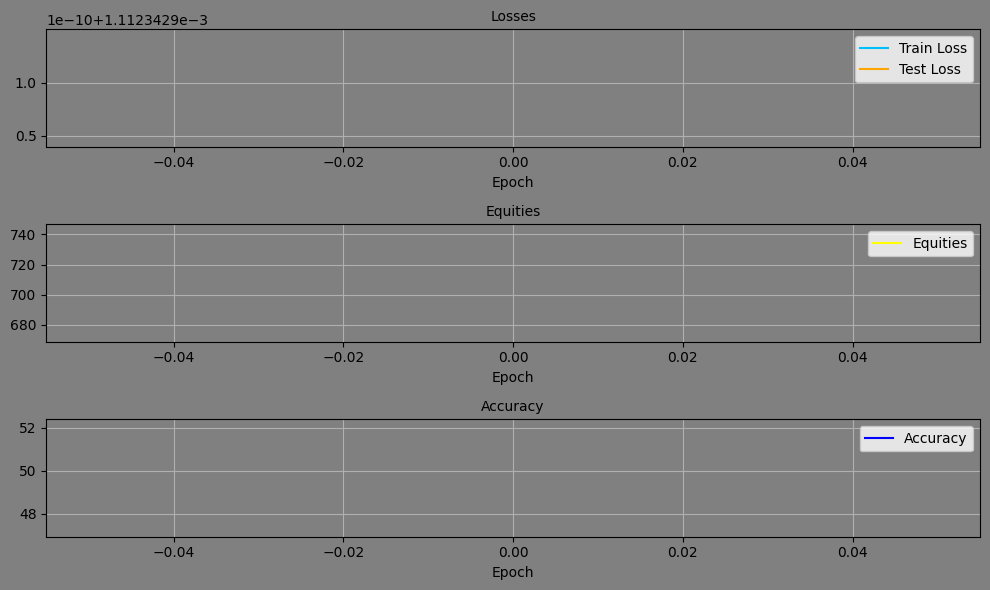

Epoch: 1, Equity: 1449.52, Accuracy: 51.93 train_losses: 0.0023966860354712773, test_losses: 0.000943262071814388, Duration: 0:00:01.039406


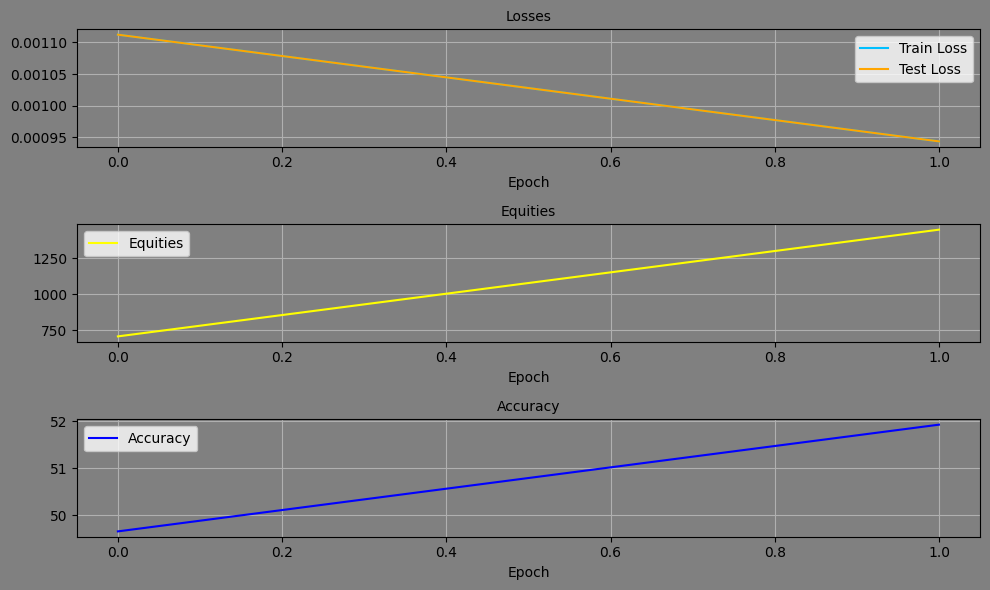

Epoch: 2, Equity: 1137.05, Accuracy: 51.31 train_losses: 0.0022094002597311036, test_losses: 0.0009053067769855261, Duration: 0:00:01.171507


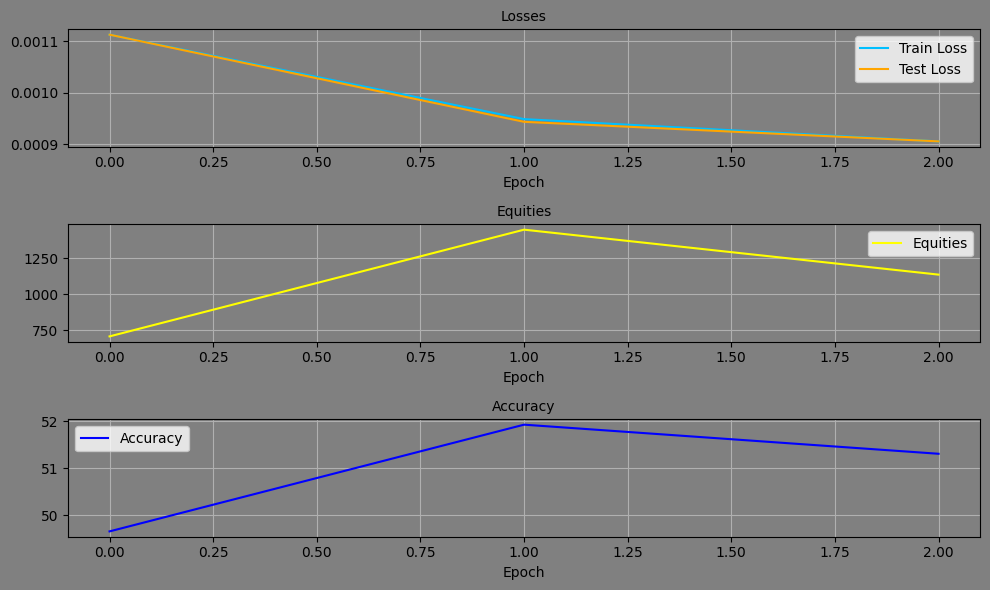

Epoch: 3, Equity: 978.56, Accuracy: 49.52 train_losses: 0.0021745190671127704, test_losses: 0.0008954033255577087, Duration: 0:00:01.087871


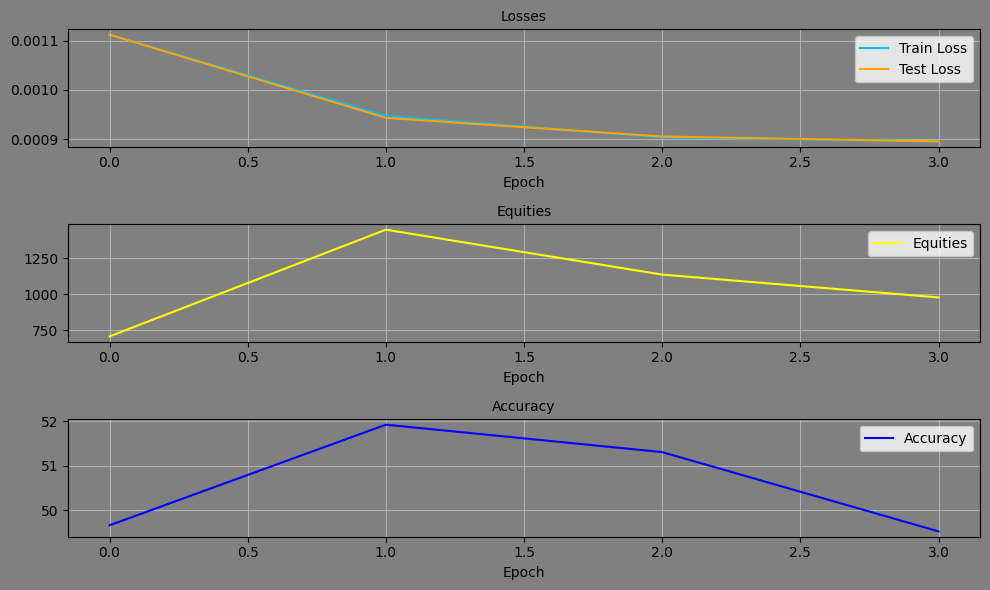

Epoch: 4, Equity: 900.68, Accuracy: 49.24 train_losses: 0.002156630241354647, test_losses: 0.0008915144135244191, Duration: 0:00:01.095366


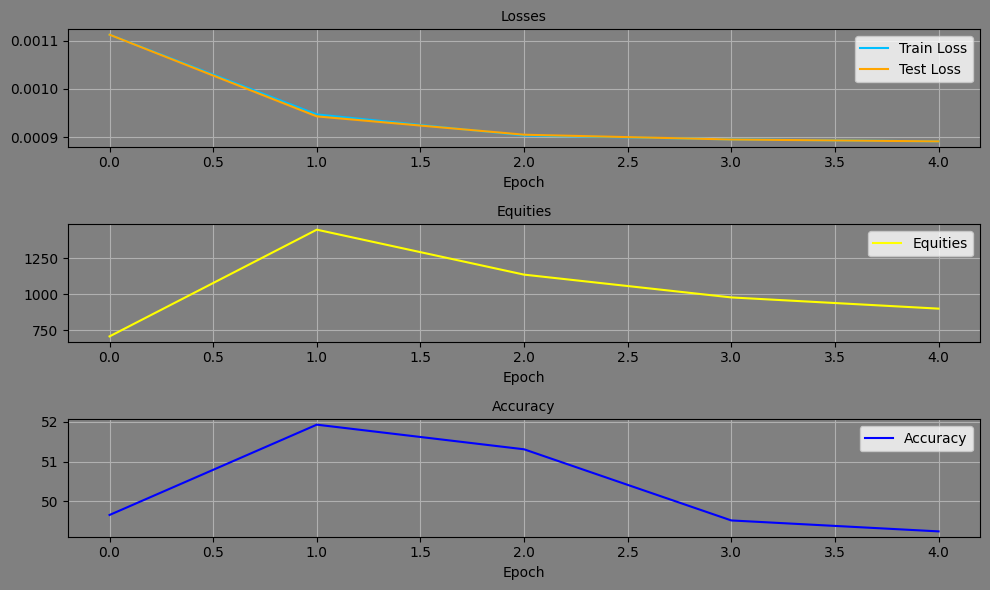

Epoch: 5, Equity: 871.29, Accuracy: 49.24 train_losses: 0.0021439626908695865, test_losses: 0.0009070996893569827, Duration: 0:00:01.153656


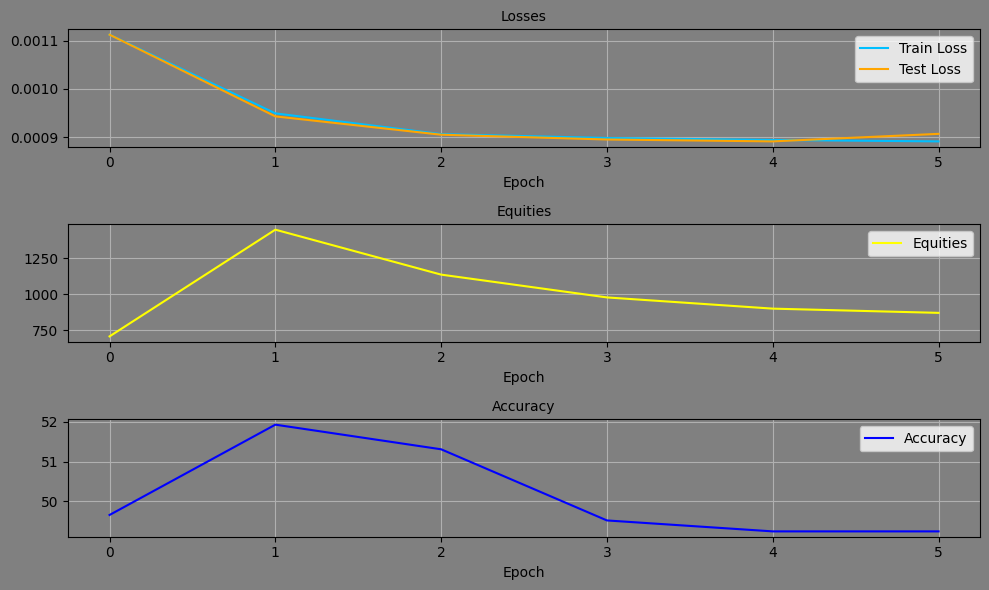

Epoch: 6, Equity: 902.56, Accuracy: 50.00 train_losses: 0.0021280753187372893, test_losses: 0.0008851396851241589, Duration: 0:00:01.019461


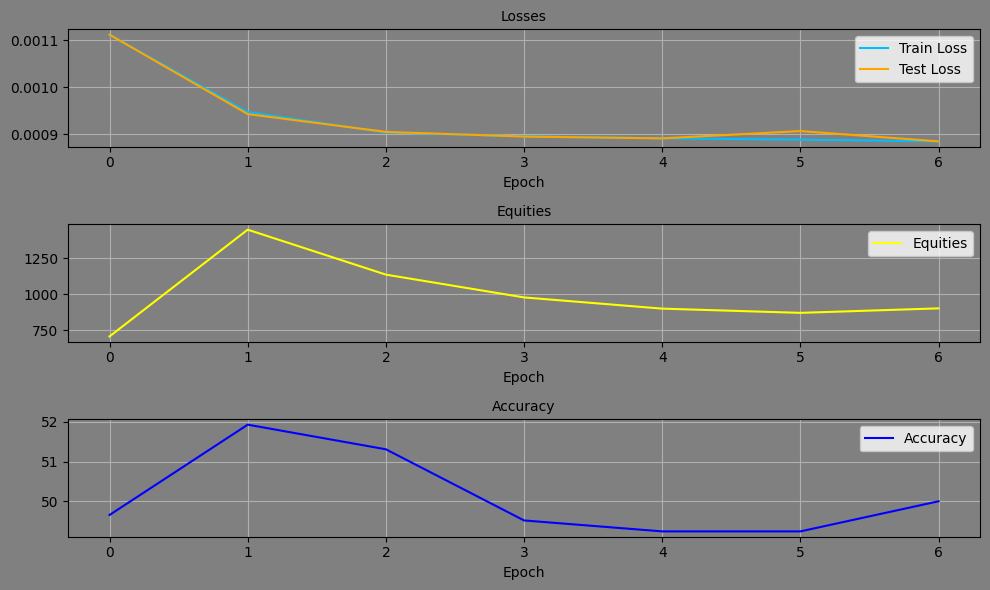

Epoch: 7, Equity: 1364.35, Accuracy: 51.86 train_losses: 0.0021145029268252553, test_losses: 0.0008932031923905015, Duration: 0:00:01.051597


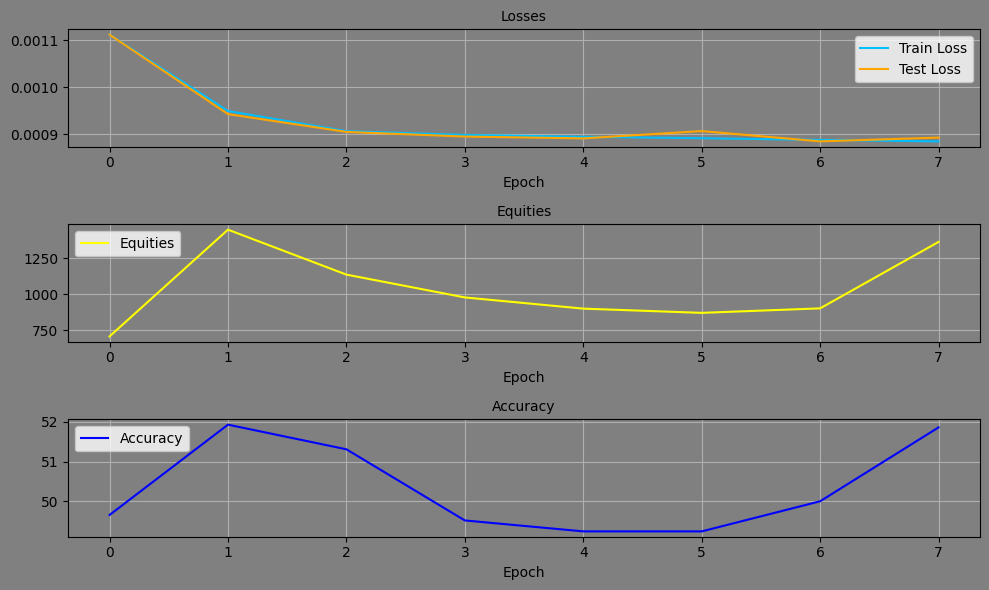

Epoch: 8, Equity: 792.27, Accuracy: 48.48 train_losses: 0.002106767627836195, test_losses: 0.0008957583922892809, Duration: 0:00:01.222272


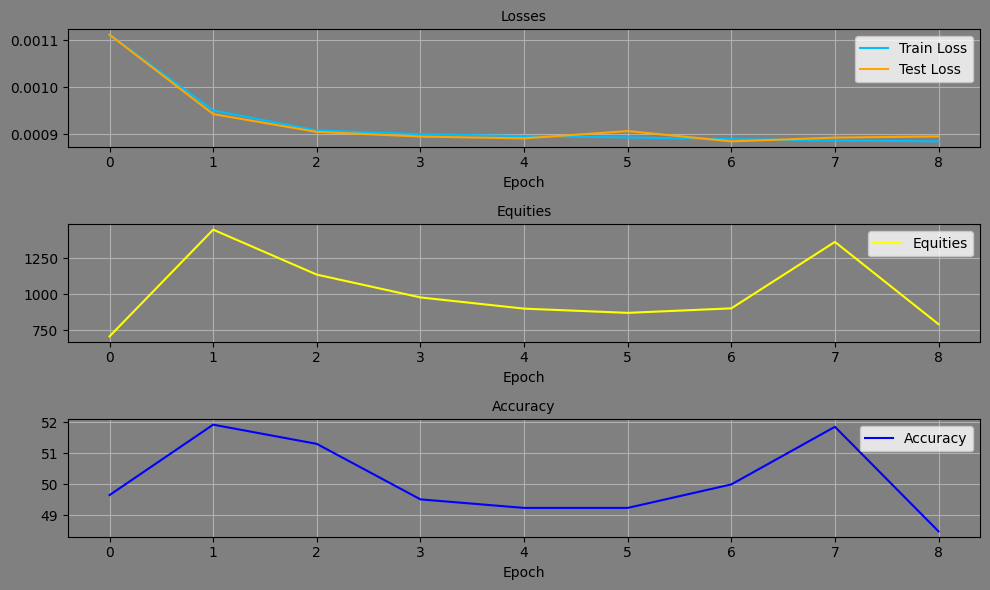

Epoch: 9, Equity: 1333.28, Accuracy: 51.58 train_losses: 0.0021011096077568924, test_losses: 0.0008952670032158494, Duration: 0:00:01.237185


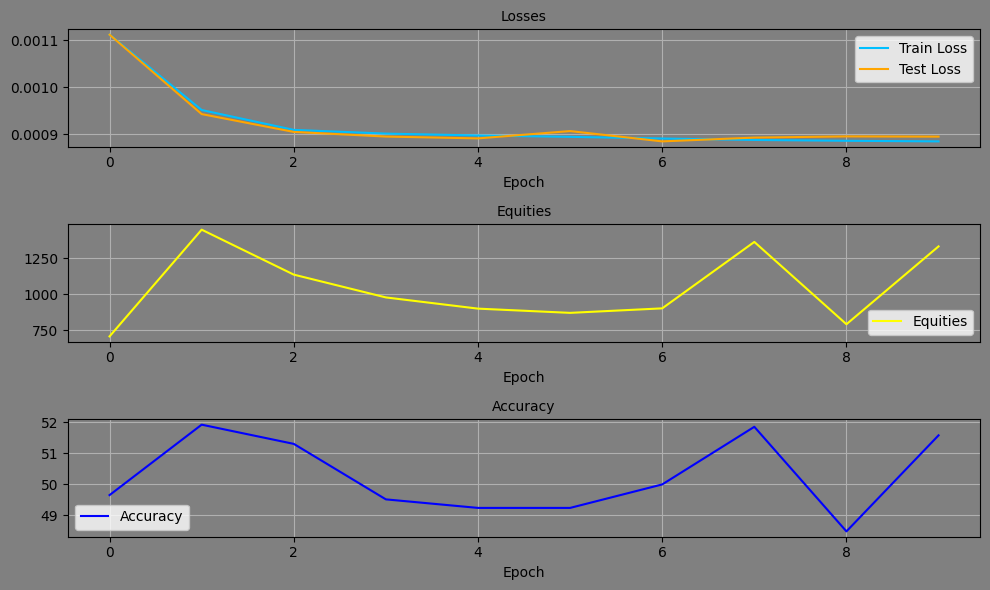

Epoch: 10, Equity: 1340.65, Accuracy: 51.58 train_losses: 0.002096233548351153, test_losses: 0.0008834984619170427, Duration: 0:00:01.219731


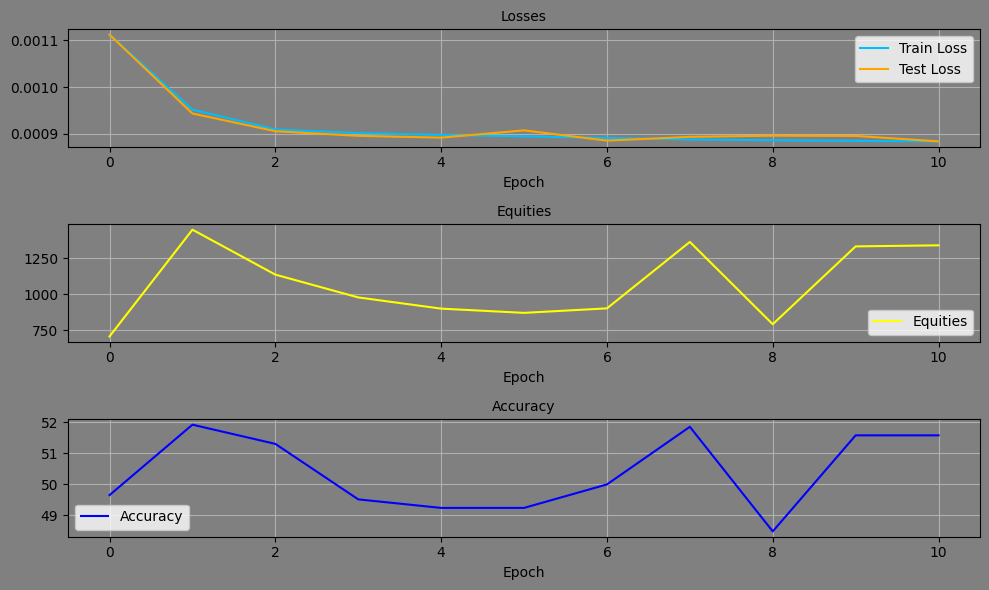

Epoch: 11, Equity: 1288.10, Accuracy: 51.17 train_losses: 0.0020914839495742845, test_losses: 0.0008855783962644637, Duration: 0:00:01.290023


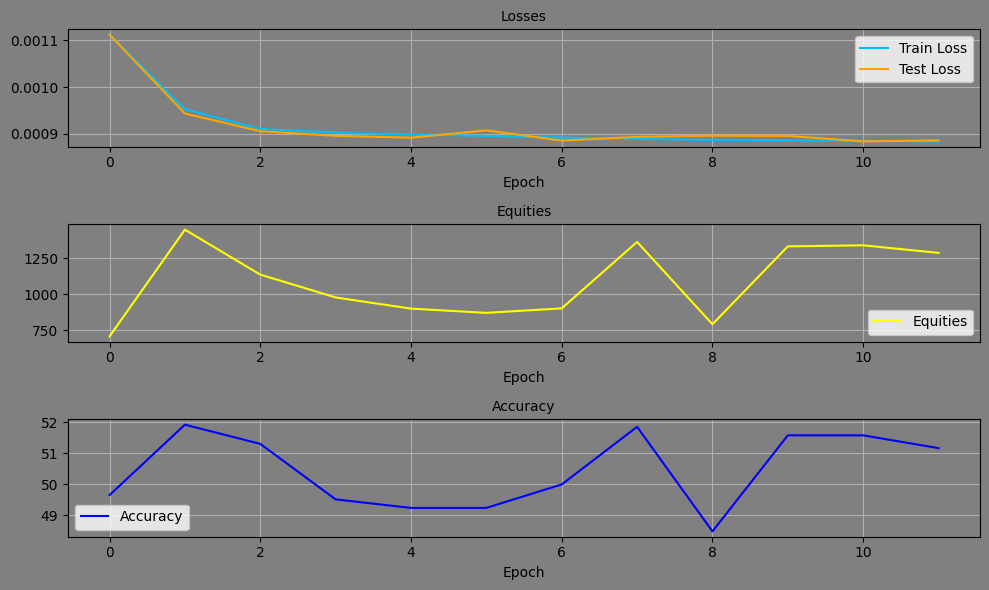

Epoch: 12, Equity: 1078.52, Accuracy: 51.24 train_losses: 0.002090442962201786, test_losses: 0.0008807806298136711, Duration: 0:00:01.351234


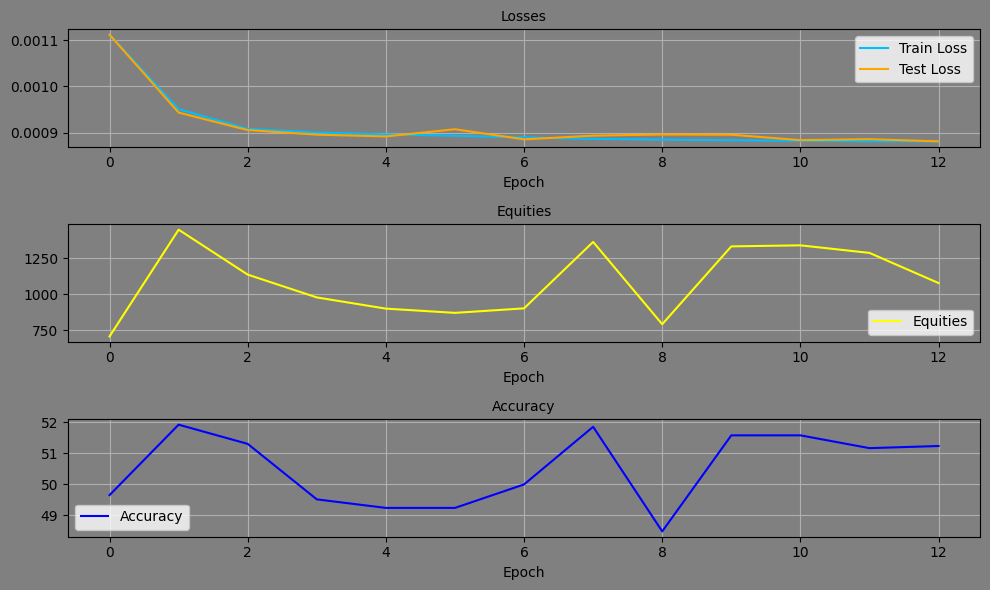

Epoch: 13, Equity: 1081.94, Accuracy: 51.38 train_losses: 0.002080916953135422, test_losses: 0.0008948834729380906, Duration: 0:00:01.120794


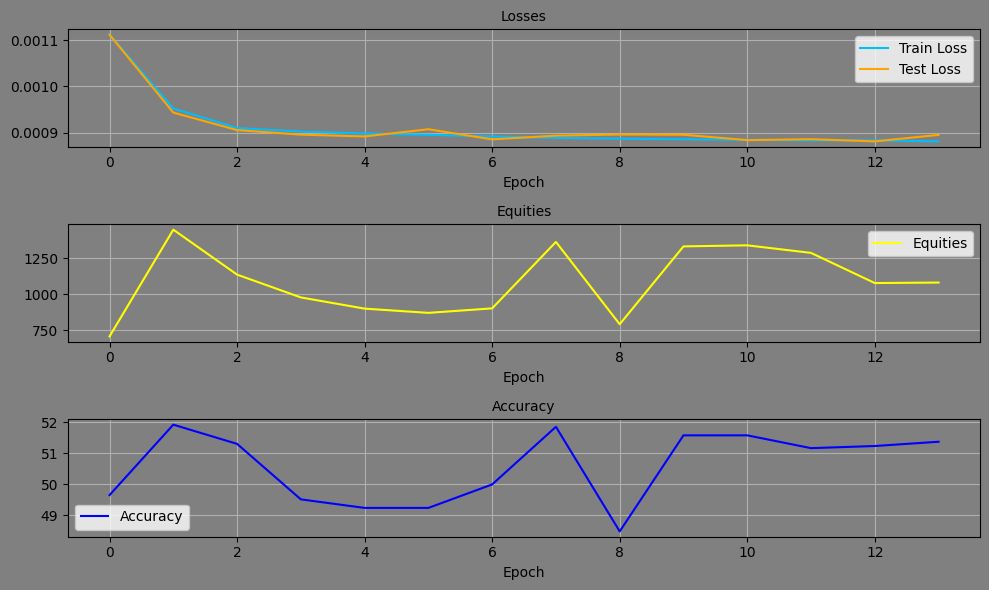

Epoch: 14, Equity: 919.71, Accuracy: 50.83 train_losses: 0.0020827083100688286, test_losses: 0.0008970570634119213, Duration: 0:00:01.100702


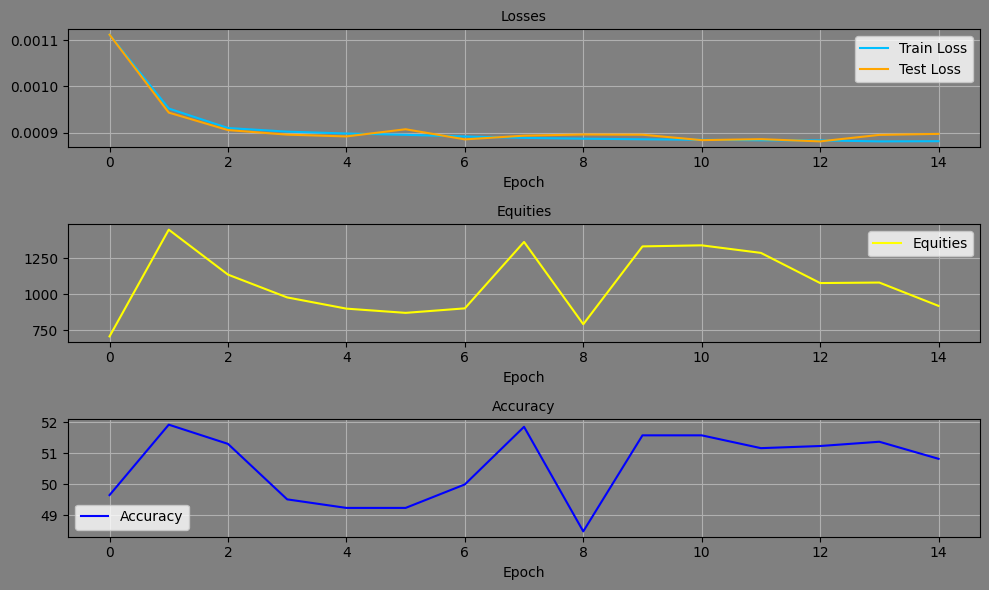

Epoch: 15, Equity: 1143.96, Accuracy: 51.93 train_losses: 0.002083012309279226, test_losses: 0.0008809686405584216, Duration: 0:00:01.105097


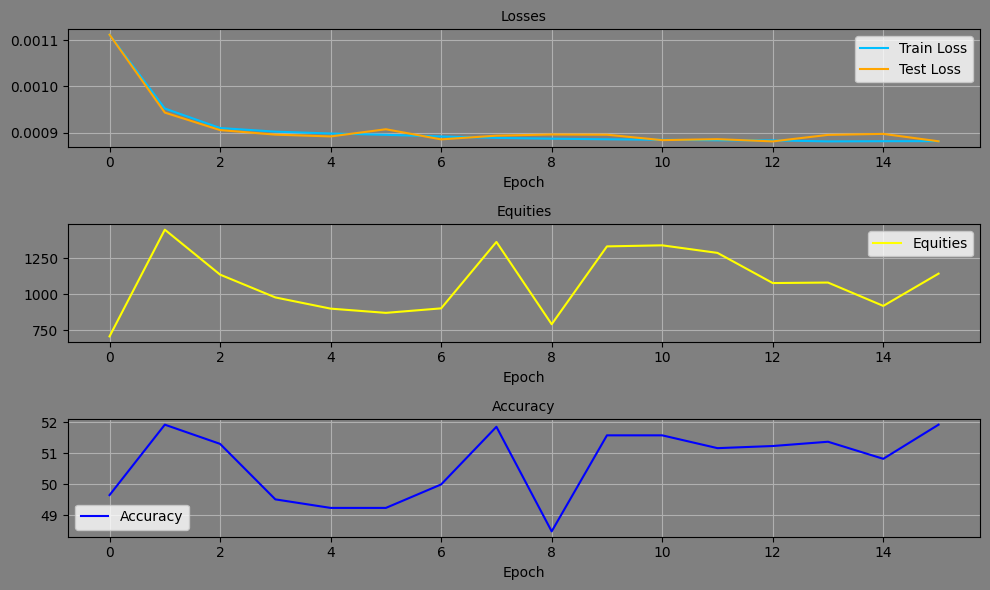

Epoch: 16, Equity: 1134.31, Accuracy: 49.72 train_losses: 0.002072540452531923, test_losses: 0.0008886272553354502, Duration: 0:00:01.104255


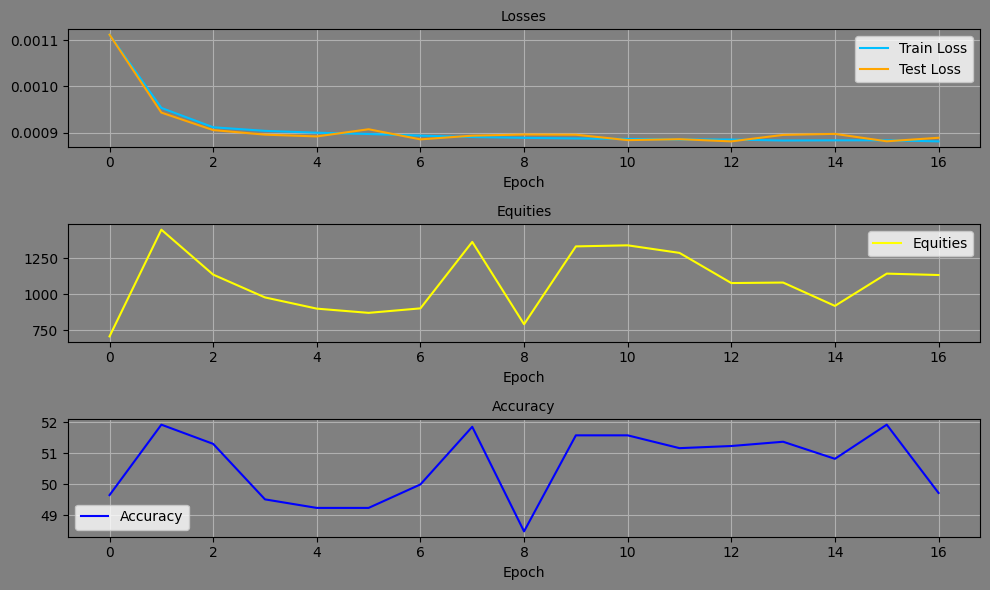

Epoch: 17, Equity: 1177.79, Accuracy: 51.52 train_losses: 0.002073241580706624, test_losses: 0.0008974754600785673, Duration: 0:00:01.296313


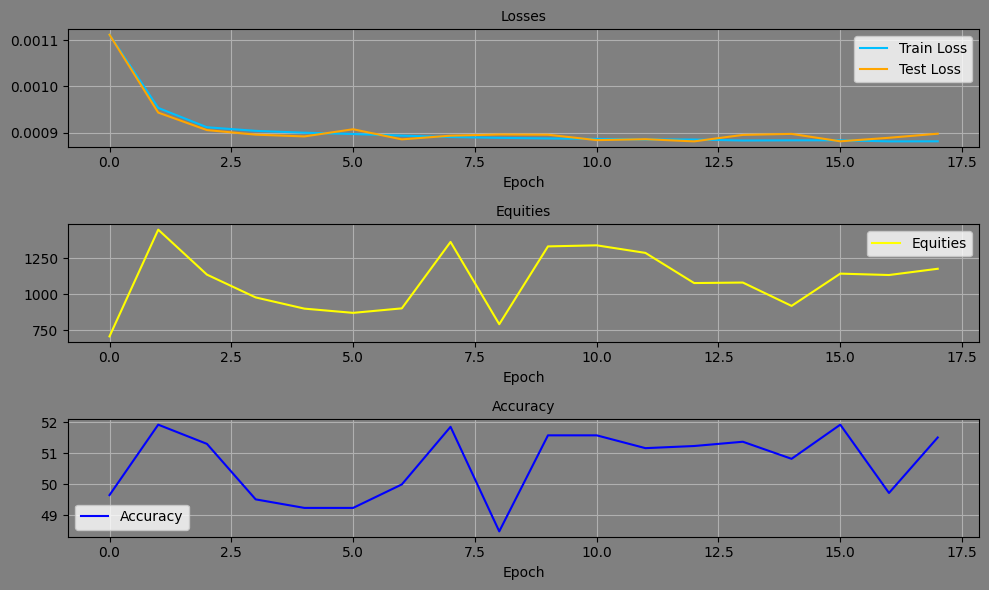

Epoch: 18, Equity: 978.37, Accuracy: 50.76 train_losses: 0.002075952877174549, test_losses: 0.0009064098121598363, Duration: 0:00:01.201631


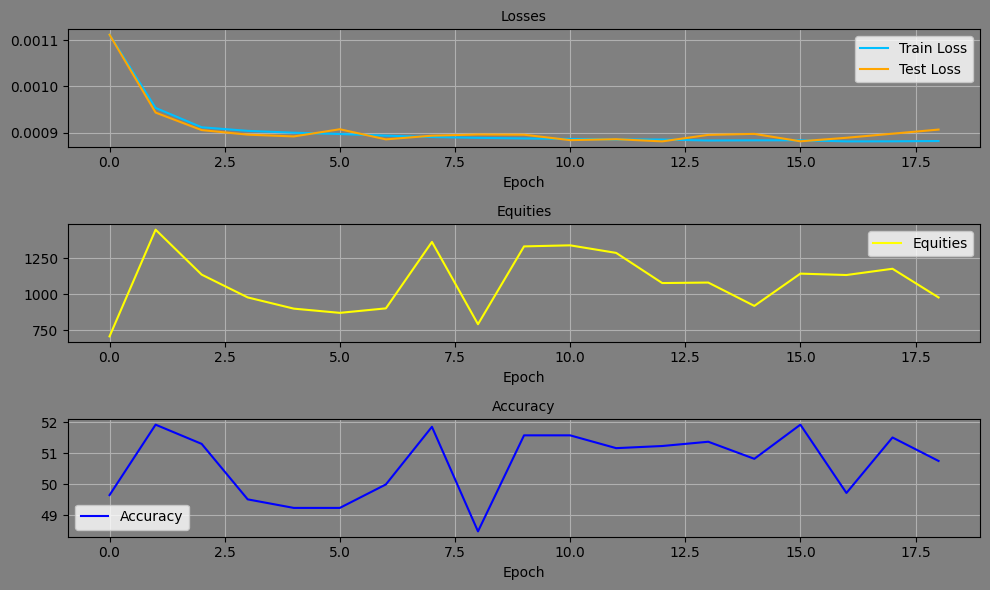

Epoch: 19, Equity: 1417.66, Accuracy: 51.93 train_losses: 0.0020718322889495466, test_losses: 0.000906052184291184, Duration: 0:00:01.272106


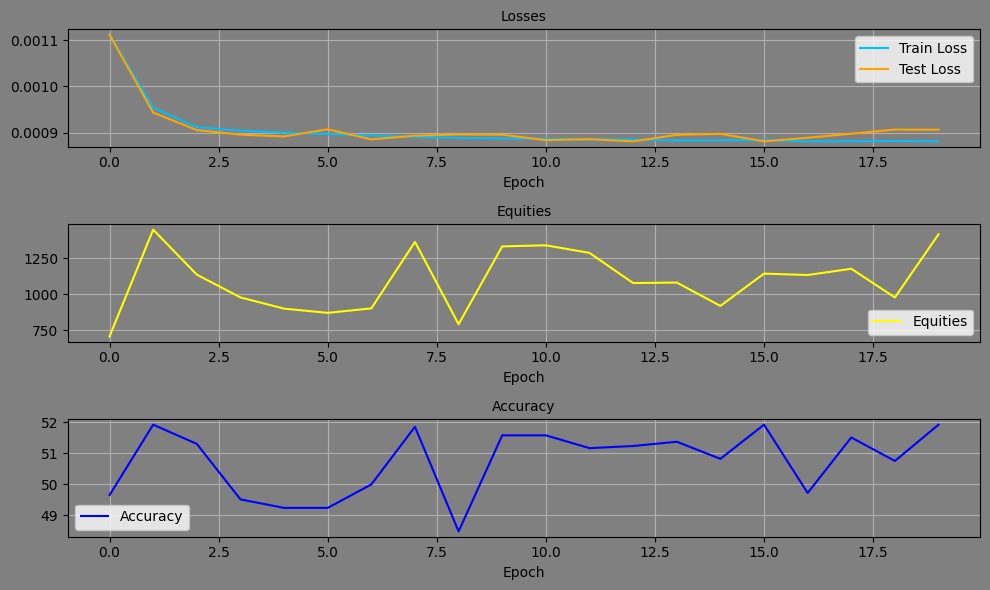

Epoch: 20, Equity: 1408.23, Accuracy: 52.00 train_losses: 0.0020670786323267834, test_losses: 0.000895373581442982, Duration: 0:00:01.460168


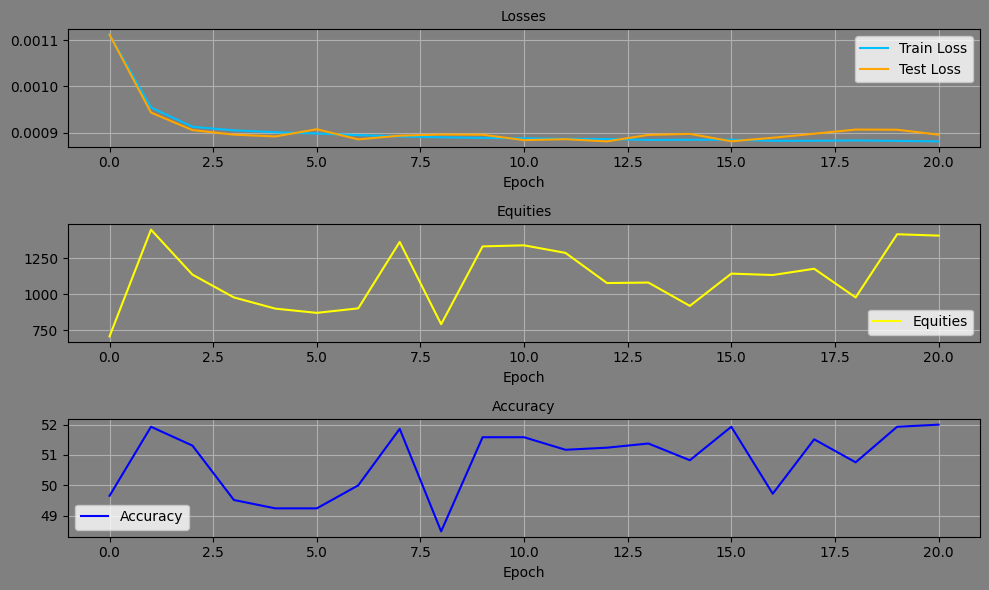

Epoch: 21, Equity: 1318.80, Accuracy: 51.65 train_losses: 0.002076147248097245, test_losses: 0.0008900397224351764, Duration: 0:00:01.250216


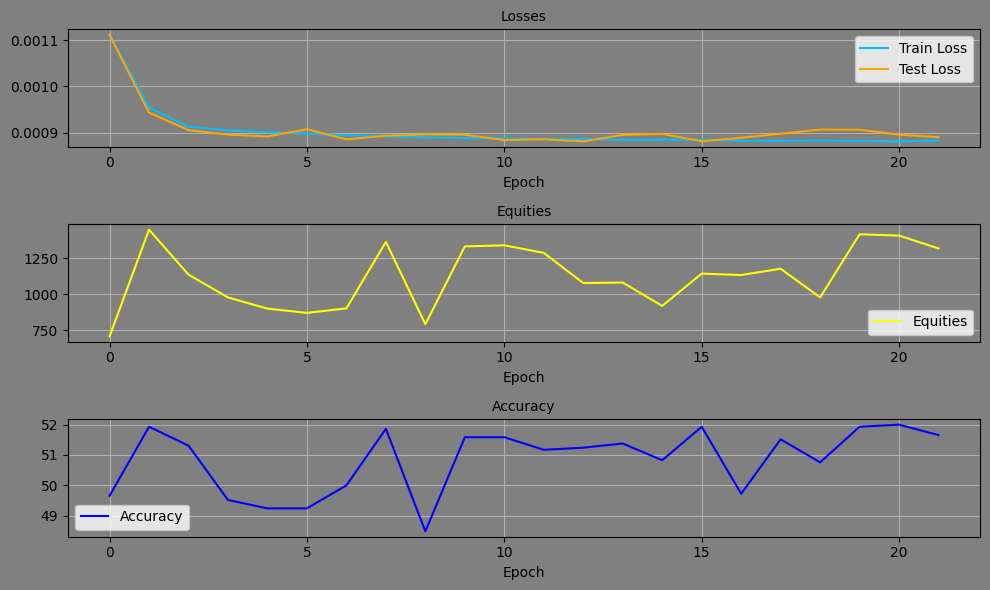

Epoch: 22, Equity: 1021.93, Accuracy: 51.45 train_losses: 0.0020692428996649612, test_losses: 0.0008812177693471313, Duration: 0:00:01.038896


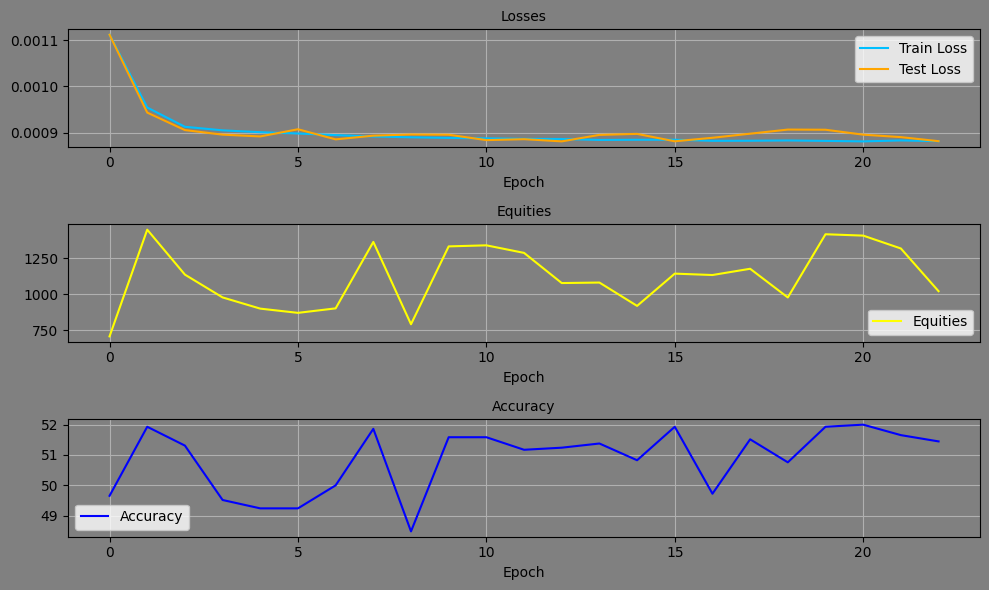

Epoch: 23, Equity: 1127.26, Accuracy: 49.86 train_losses: 0.0020707687561226655, test_losses: 0.0008835484040901065, Duration: 0:00:01.245294


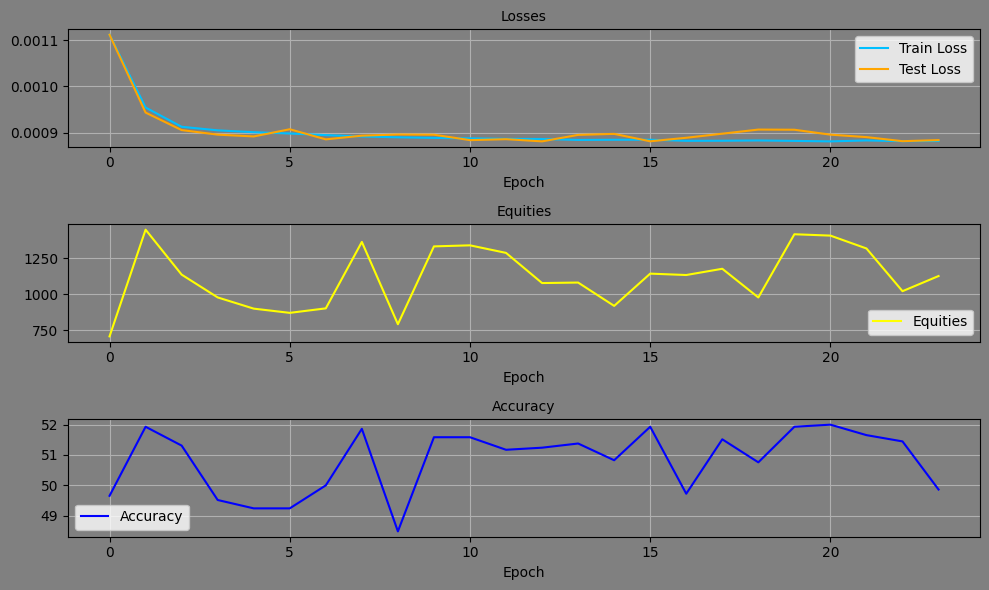

Epoch: 24, Equity: 1117.30, Accuracy: 49.72 train_losses: 0.0020686773590386366, test_losses: 0.0008885147981345654, Duration: 0:00:01.152148


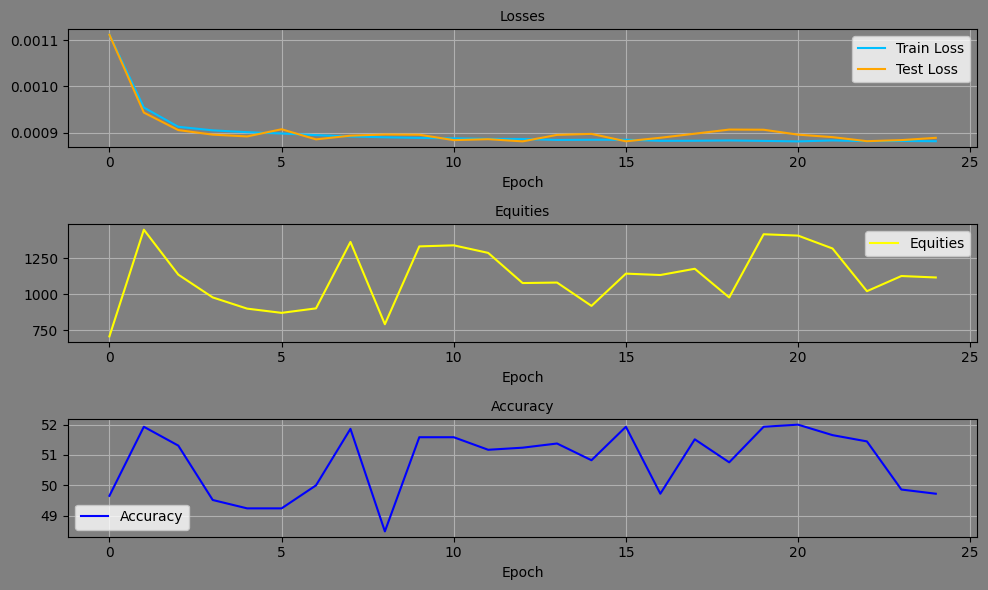

Epoch: 25, Equity: 1169.40, Accuracy: 51.03 train_losses: 0.00206873722092372, test_losses: 0.000900226179510355, Duration: 0:00:01.113708


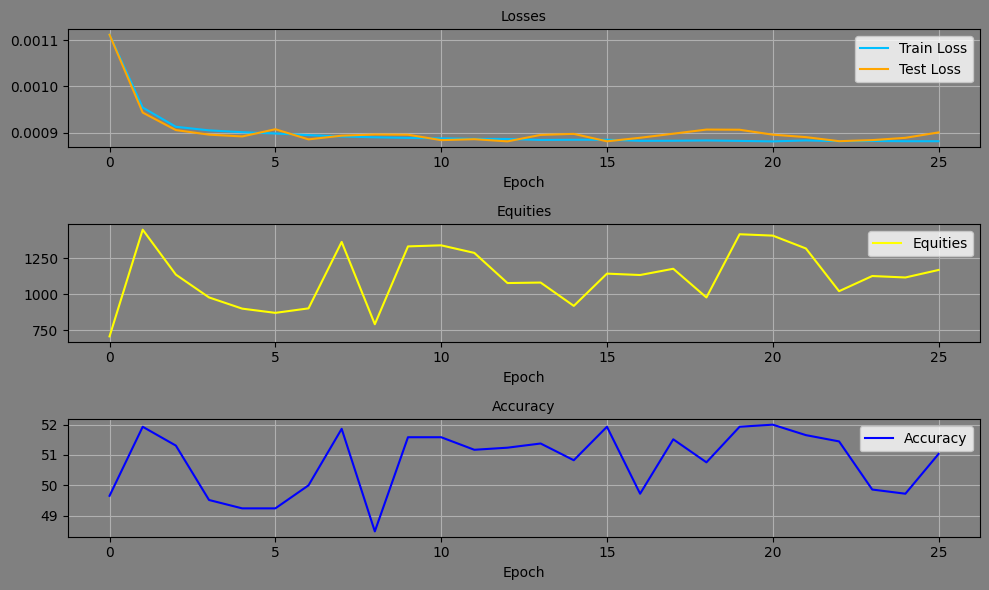

Epoch: 26, Equity: 971.30, Accuracy: 50.90 train_losses: 0.002060790717836276, test_losses: 0.0008851085440255702, Duration: 0:00:01.018744


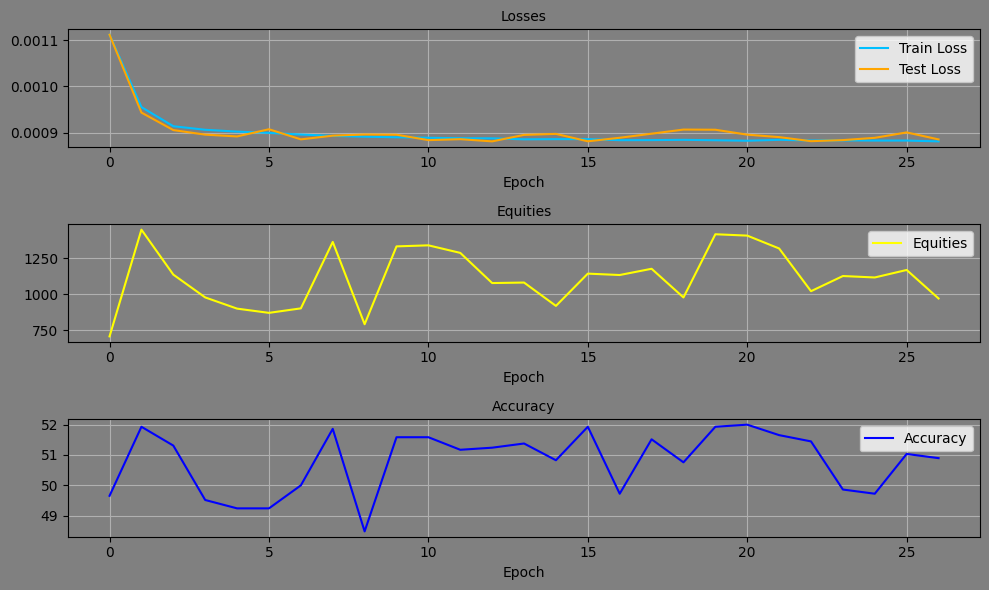

Epoch: 27, Equity: 1015.35, Accuracy: 49.45 train_losses: 0.0020634535807318396, test_losses: 0.0008823236566968262, Duration: 0:00:01.067359


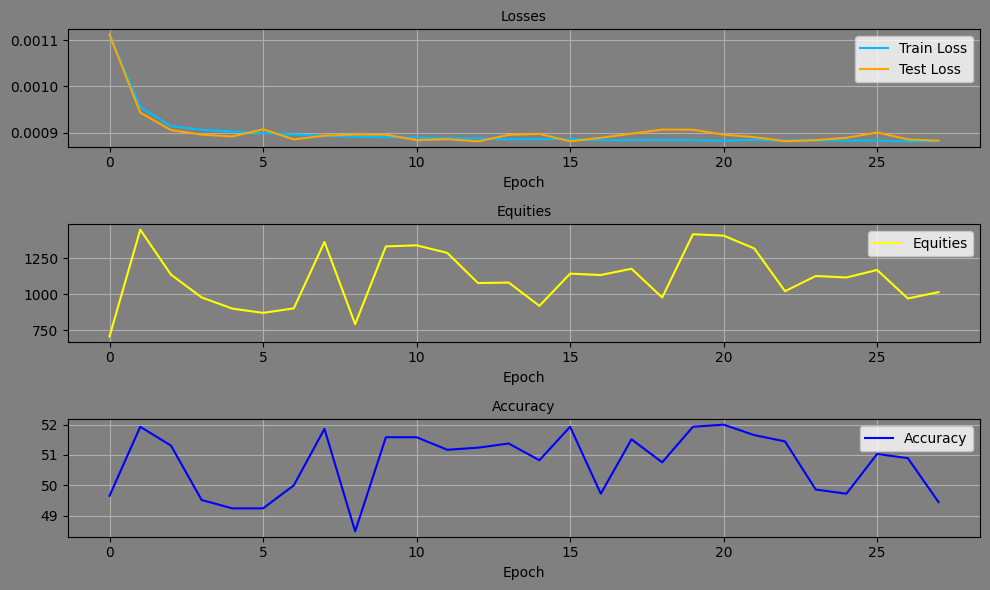

Epoch: 28, Equity: 1209.02, Accuracy: 51.52 train_losses: 0.0020656448881363823, test_losses: 0.0008839892689138651, Duration: 0:00:01.067172


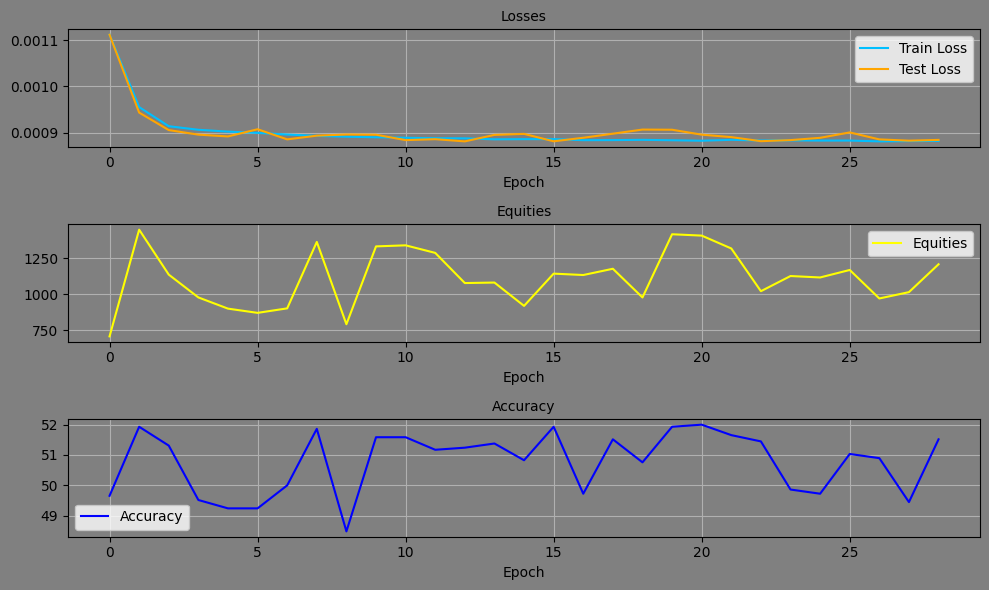

Epoch: 29, Equity: 1143.47, Accuracy: 50.00 train_losses: 0.002064357733472474, test_losses: 0.0008981047431007028, Duration: 0:00:01.013953


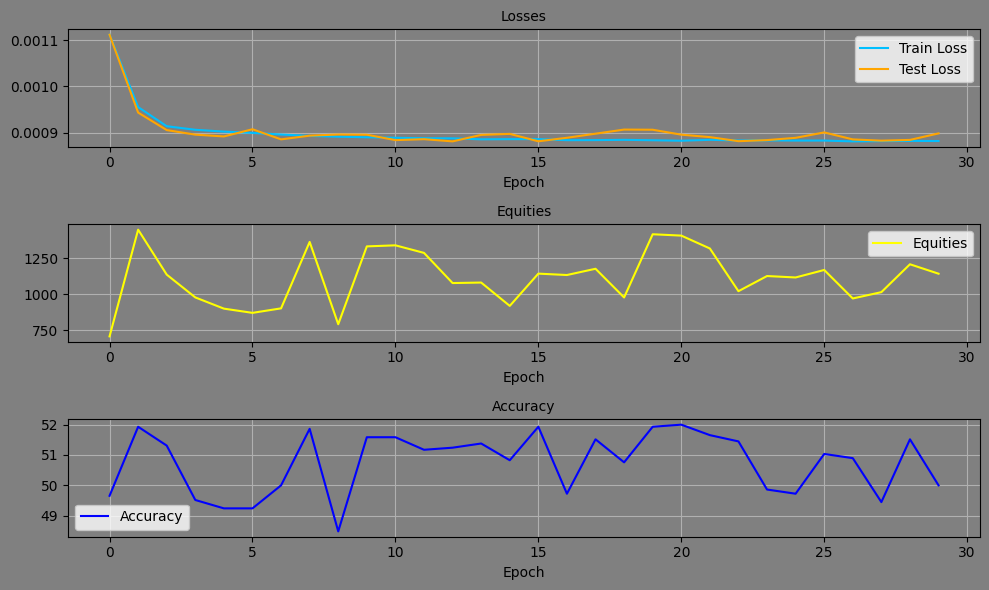

Epoch: 30, Equity: 1058.07, Accuracy: 51.31 train_losses: 0.00204894572578197, test_losses: 0.0008956207311712205, Duration: 0:00:01.035866


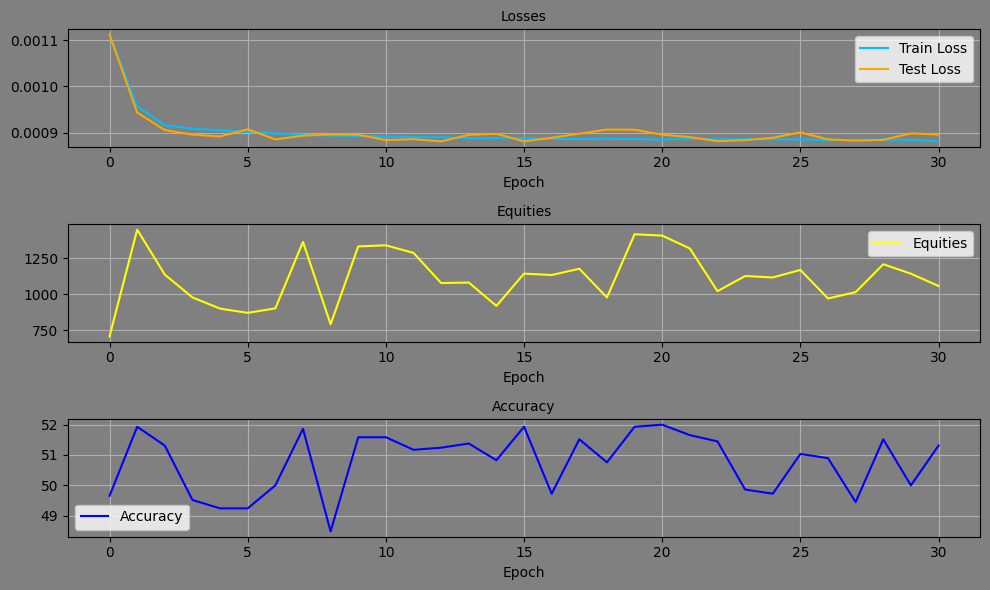

Epoch: 31, Equity: 920.98, Accuracy: 50.62 train_losses: 0.0020629694687634855, test_losses: 0.0008824479300528765, Duration: 0:00:01.072115


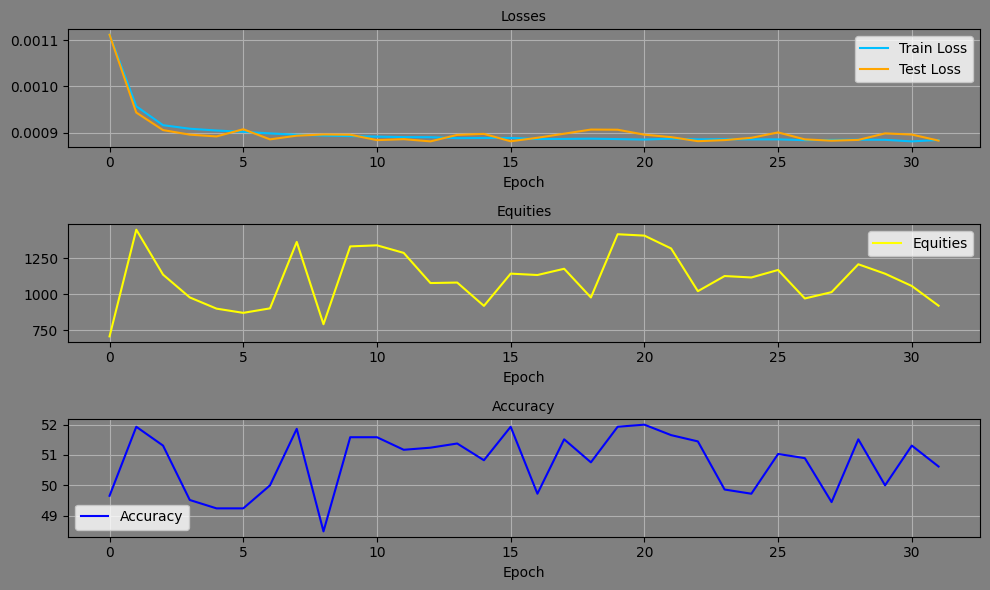

Epoch: 32, Equity: 1193.29, Accuracy: 51.45 train_losses: 0.002060807065322234, test_losses: 0.0008804896497167647, Duration: 0:00:01.074609


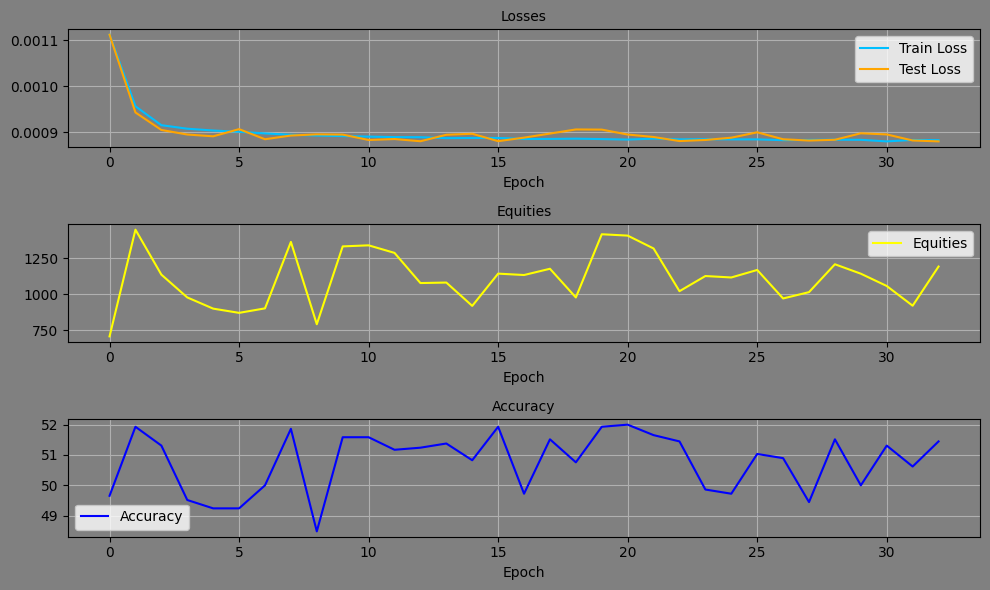

Epoch: 33, Equity: 929.70, Accuracy: 50.96 train_losses: 0.002056479158725316, test_losses: 0.0008748502004891634, Duration: 0:00:01.037027


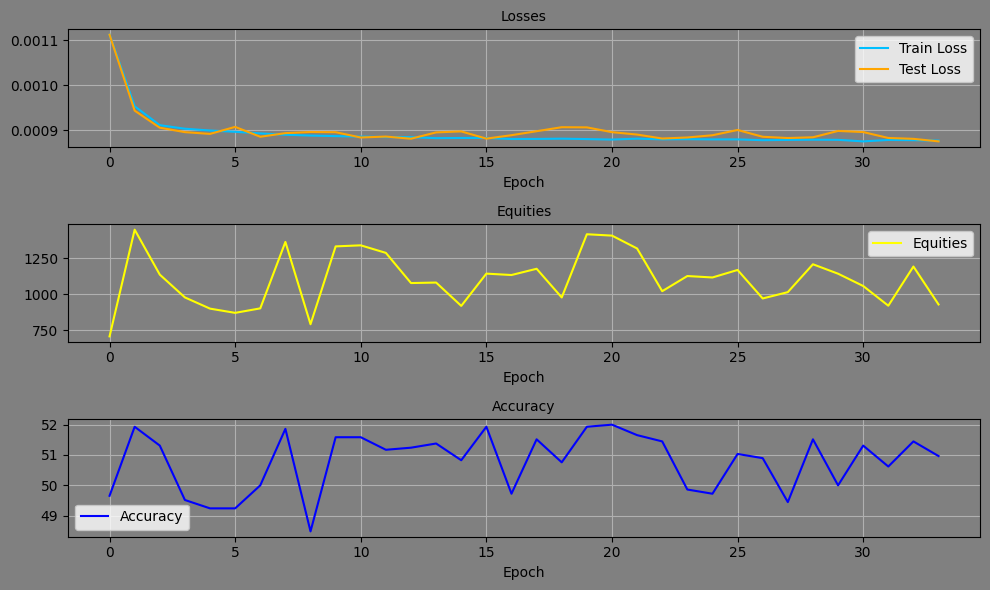

Epoch: 34, Equity: 1238.01, Accuracy: 51.65 train_losses: 0.0020586875296326346, test_losses: 0.0008793982560746372, Duration: 0:00:01.025324


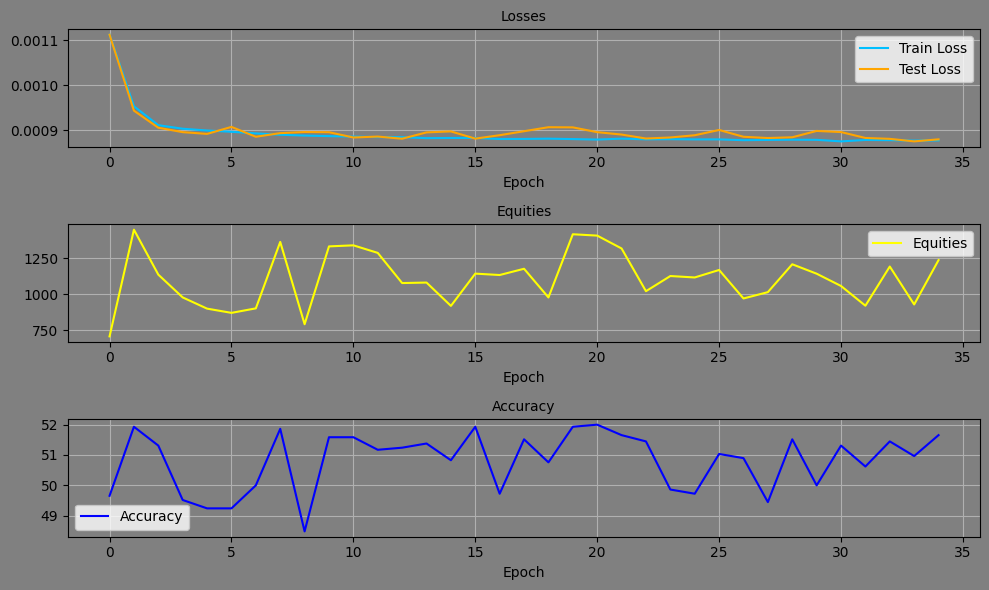

Epoch: 35, Equity: 1173.89, Accuracy: 51.31 train_losses: 0.0020586731680919245, test_losses: 0.0008755485760048032, Duration: 0:00:00.997227


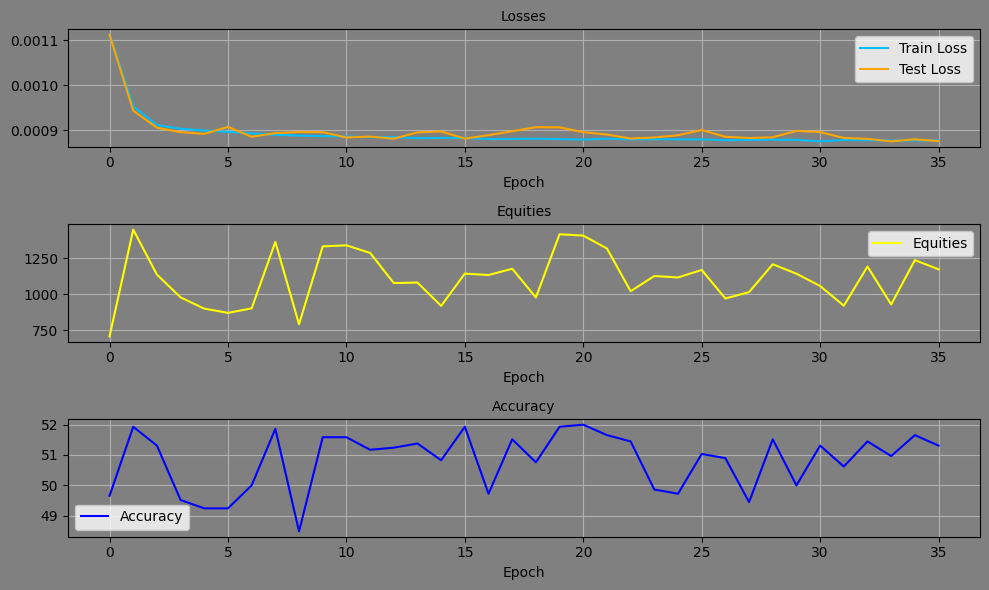

Epoch: 36, Equity: 1249.30, Accuracy: 51.65 train_losses: 0.002057463113960433, test_losses: 0.0008779986528679729, Duration: 0:00:01.061466


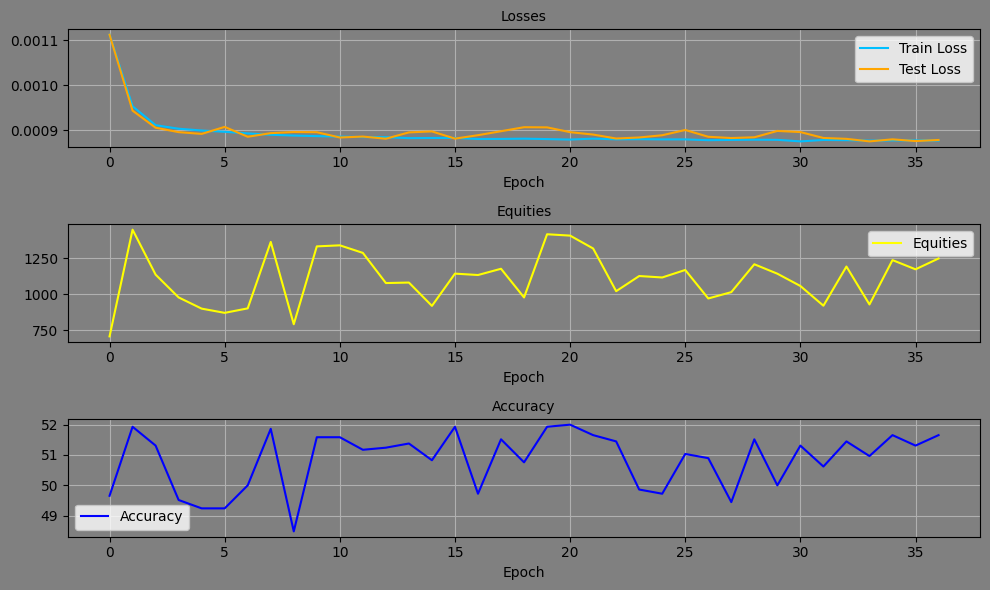

Epoch: 37, Equity: 1258.38, Accuracy: 51.86 train_losses: 0.0020580573165397023, test_losses: 0.0008927869494073093, Duration: 0:00:01.040719


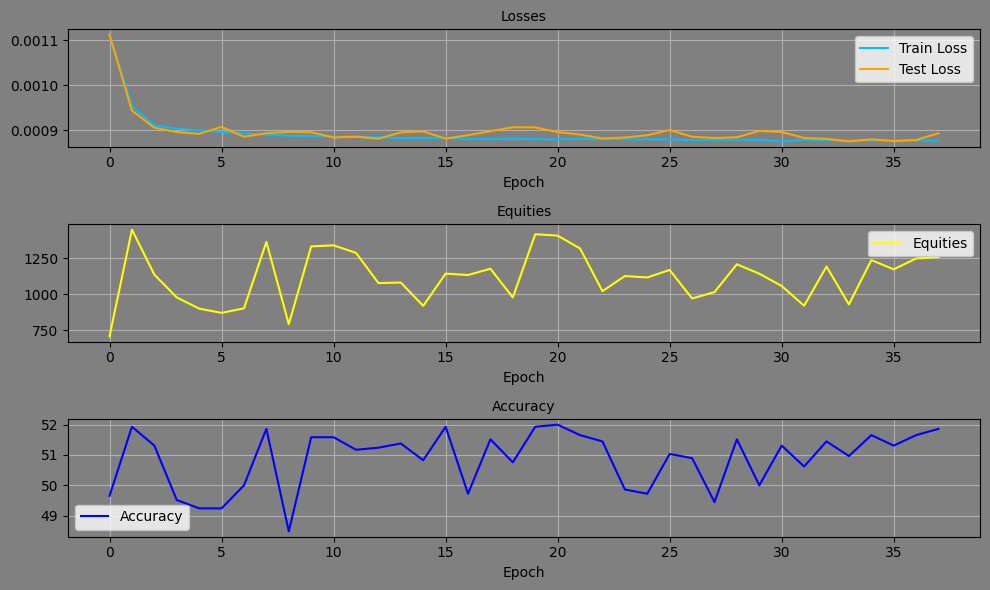

Epoch: 38, Equity: 1187.08, Accuracy: 51.72 train_losses: 0.0020440277889893325, test_losses: 0.000883940898347646, Duration: 0:00:01.106660


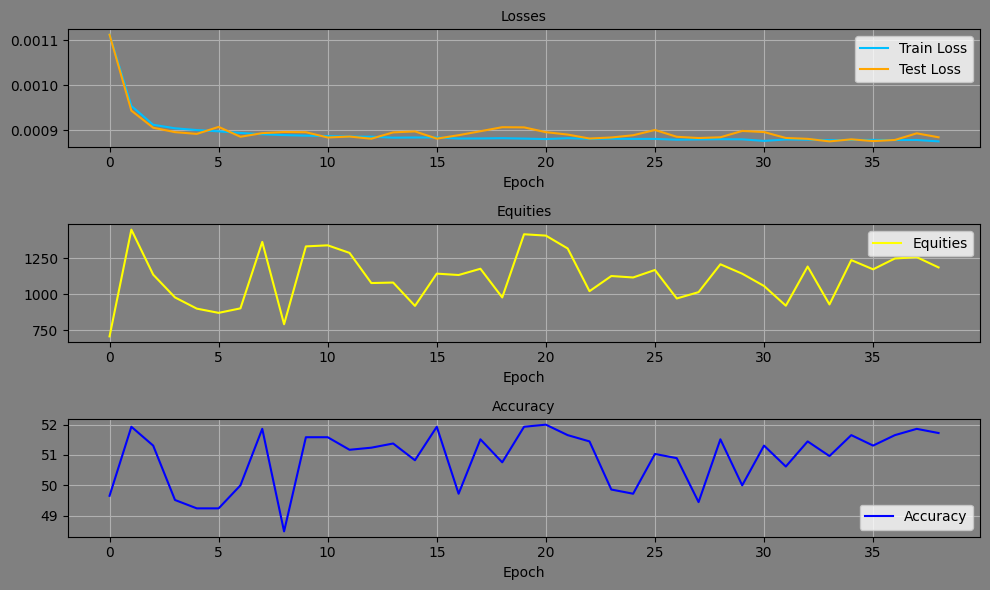

Epoch: 39, Equity: 1181.04, Accuracy: 51.52 train_losses: 0.002055565071877219, test_losses: 0.0008865796844474971, Duration: 0:00:01.029286


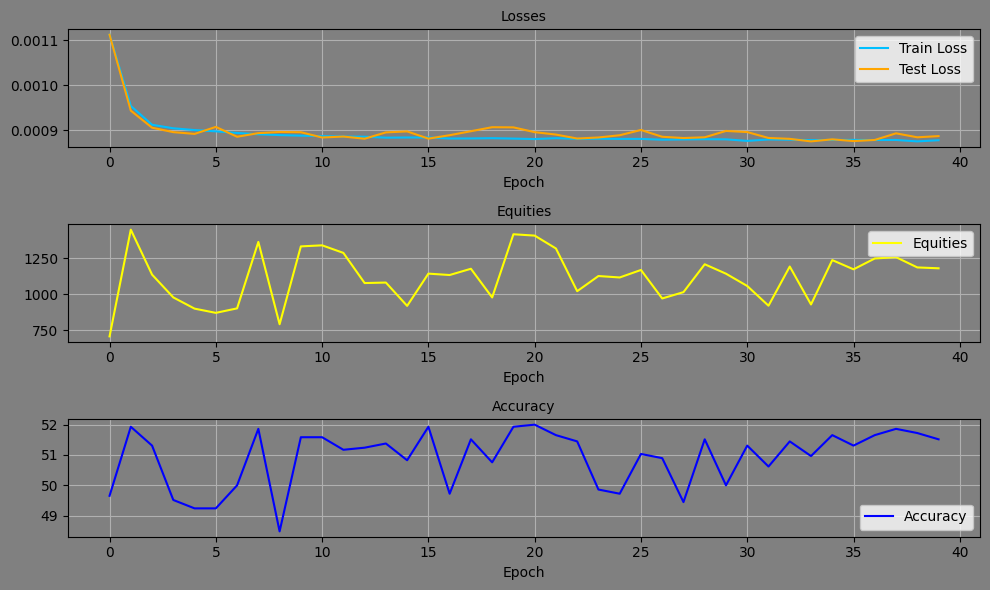

Epoch: 40, Equity: 1217.76, Accuracy: 51.79 train_losses: 0.0020505748175945813, test_losses: 0.0008882758556865156, Duration: 0:00:01.003266


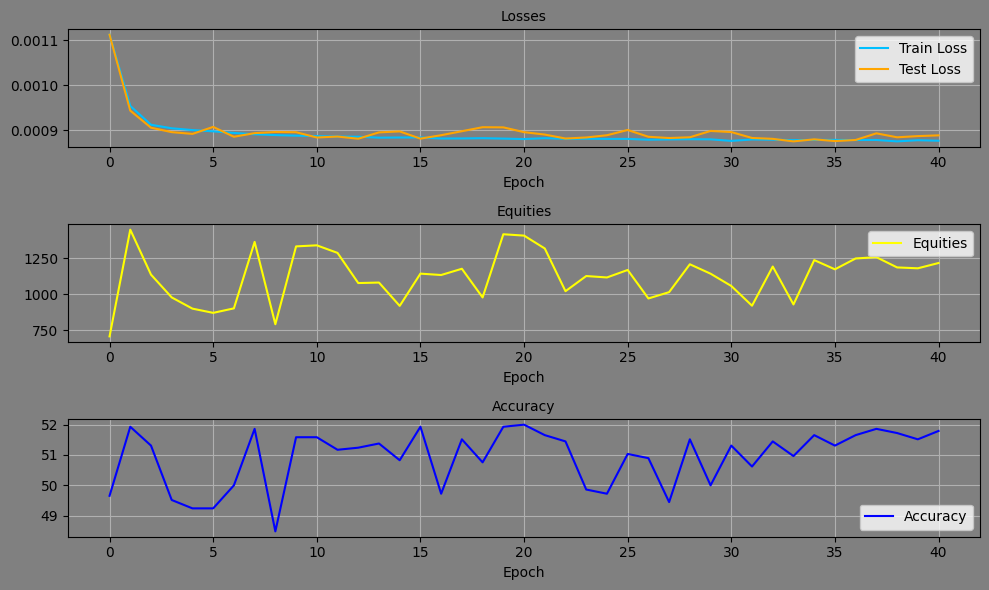

Epoch: 41, Equity: 1229.32, Accuracy: 51.65 train_losses: 0.0020496109782177354, test_losses: 0.0008777673938311636, Duration: 0:00:01.205222


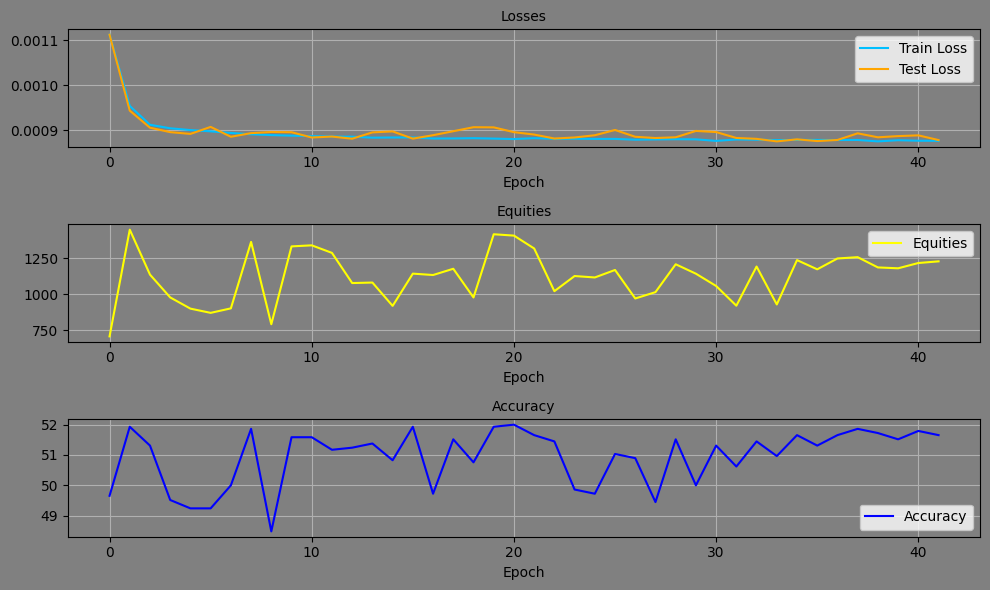

Epoch: 42, Equity: 955.93, Accuracy: 49.52 train_losses: 0.002051358235963223, test_losses: 0.0008806133409962058, Duration: 0:00:01.082068


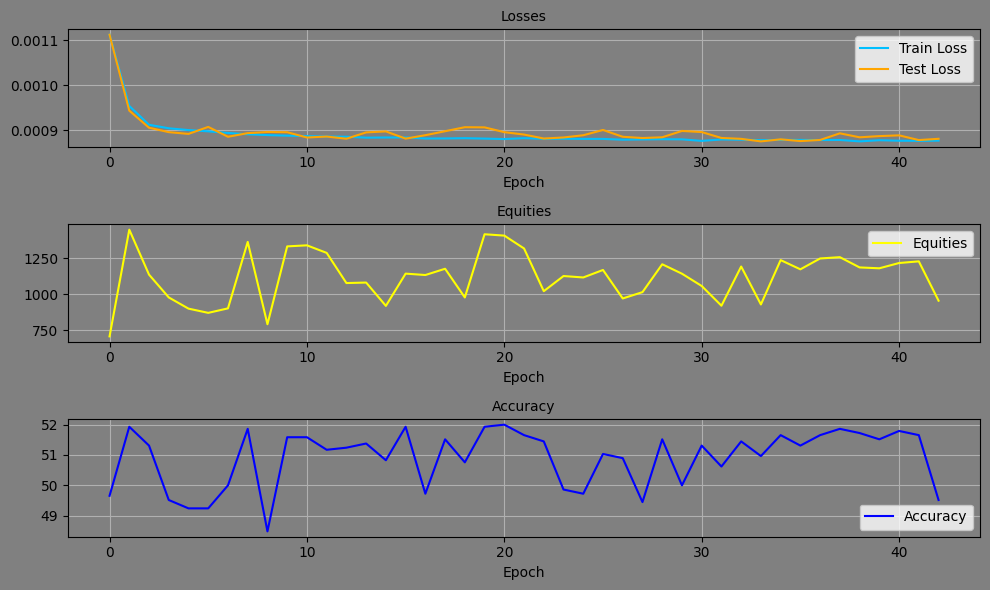

Epoch: 43, Equity: 1209.52, Accuracy: 51.79 train_losses: 0.0020451459907016994, test_losses: 0.0008795356843620539, Duration: 0:00:01.062010


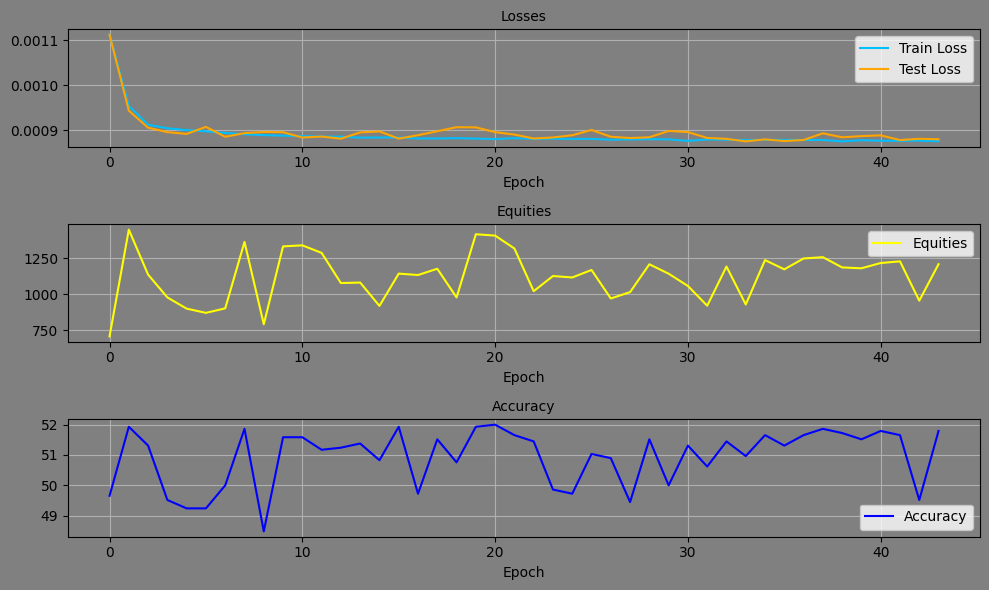

Epoch: 44, Equity: 1022.50, Accuracy: 49.93 train_losses: 0.0020391068362470674, test_losses: 0.0008789236890152097, Duration: 0:00:01.051540


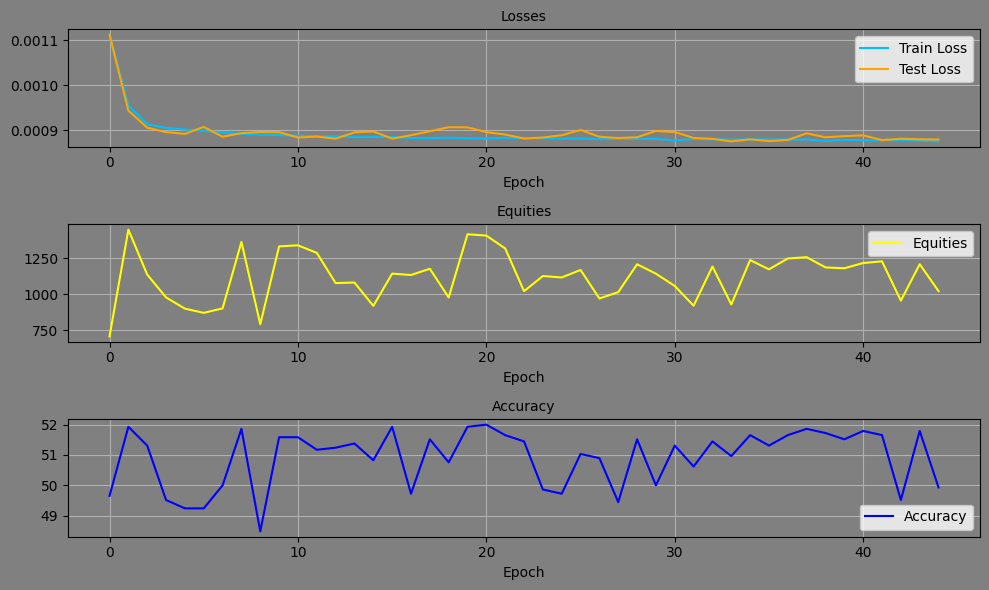

Epoch: 45, Equity: 1213.92, Accuracy: 51.58 train_losses: 0.0020510388318554407, test_losses: 0.0008912260527722538, Duration: 0:00:01.037649


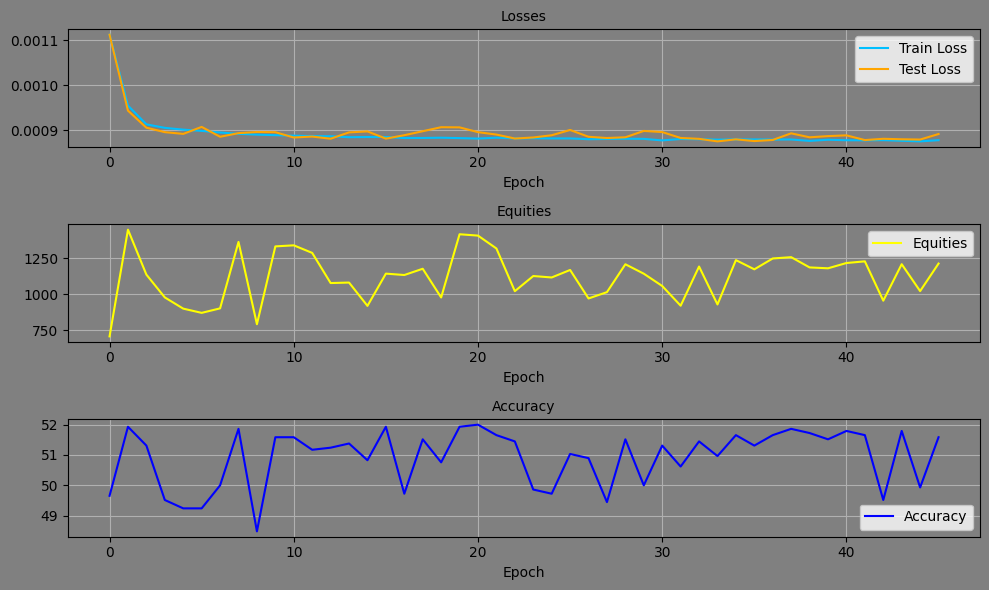

Epoch: 46, Equity: 1072.63, Accuracy: 51.31 train_losses: 0.0020507123800308368, test_losses: 0.0008827766287140548, Duration: 0:00:01.087689


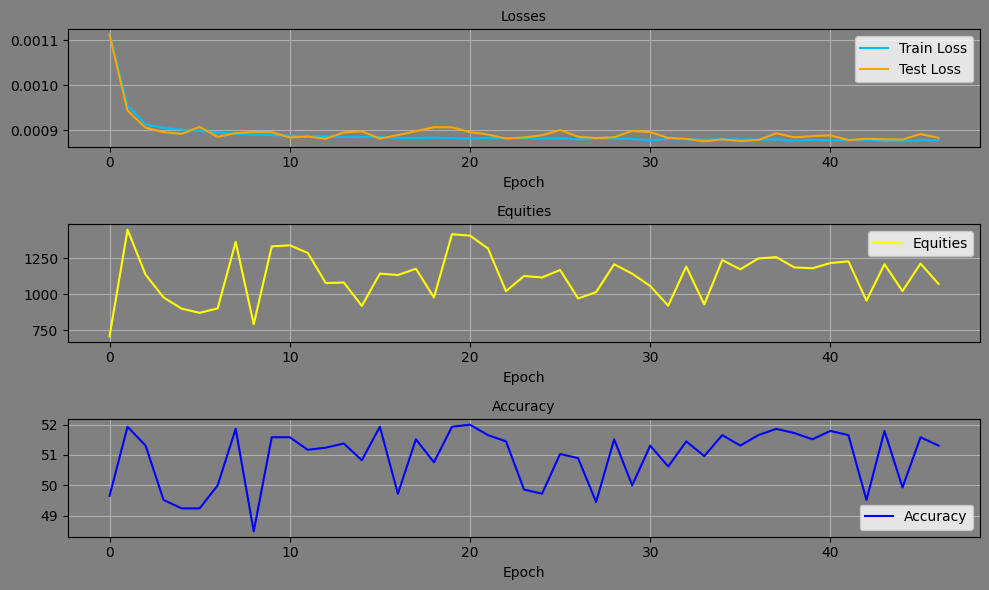

Epoch: 47, Equity: 1195.27, Accuracy: 51.79 train_losses: 0.002047819133299673, test_losses: 0.0008748368127271533, Duration: 0:00:01.106619


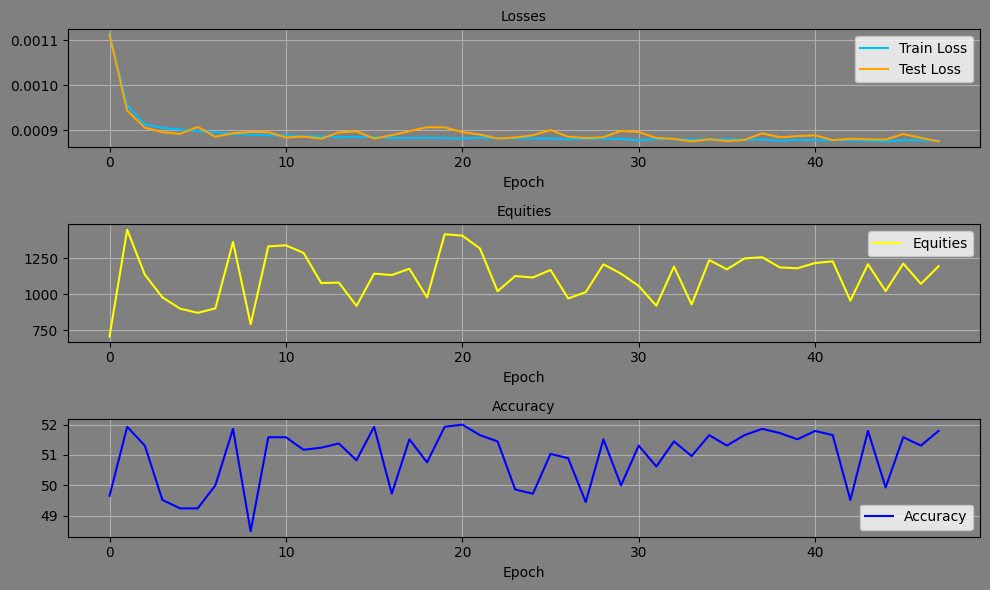

Epoch: 48, Equity: 1203.37, Accuracy: 51.65 train_losses: 0.002050050181515288, test_losses: 0.000876762846019119, Duration: 0:00:01.187102


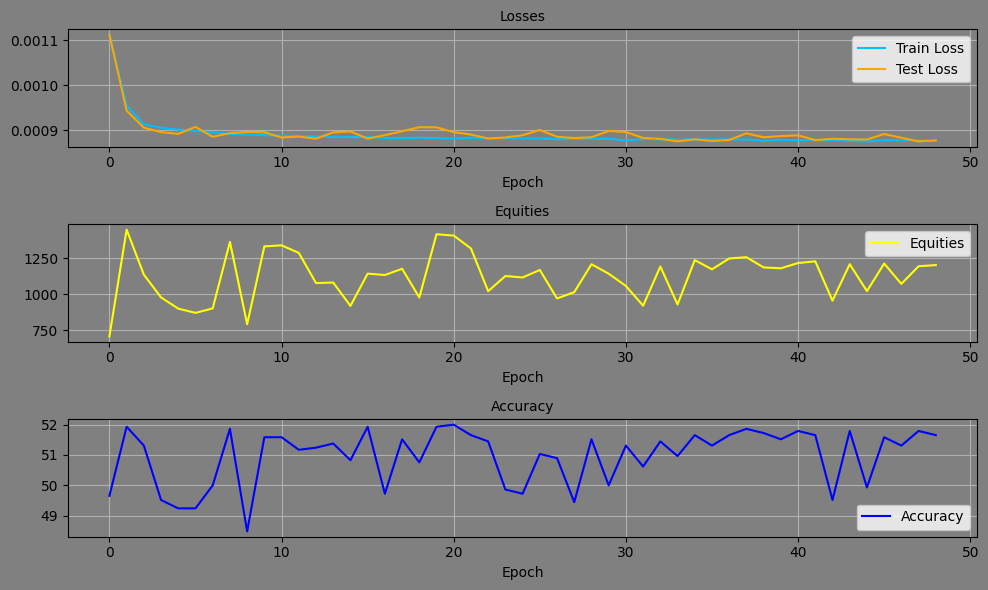

Epoch: 49, Equity: 1370.89, Accuracy: 52.07 train_losses: 0.0020198090110219494, test_losses: 0.0008749309345148504, Duration: 0:00:01.113425


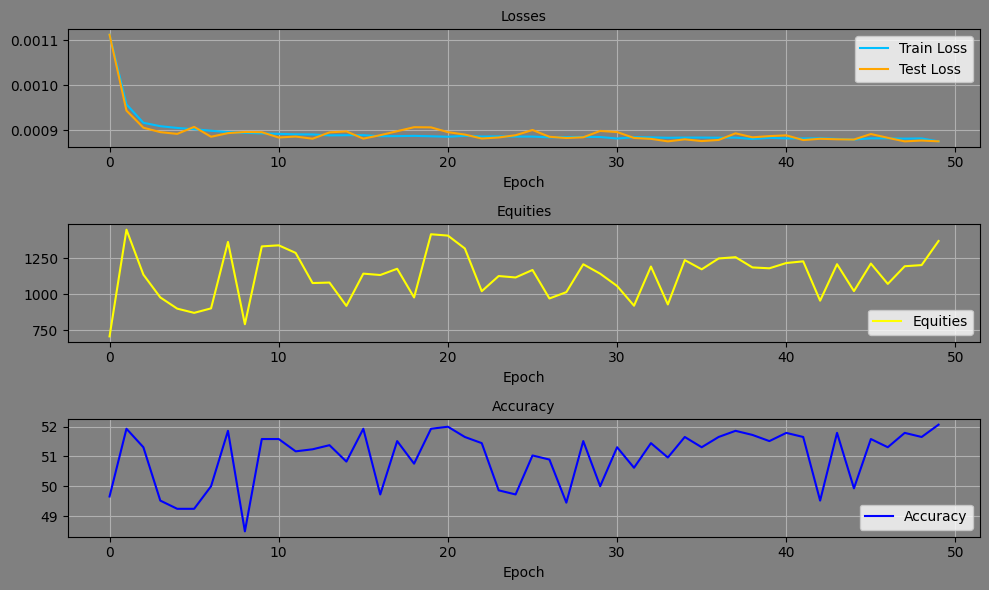

Epoch: 50, Equity: 1179.67, Accuracy: 51.45 train_losses: 0.002048183958368262, test_losses: 0.0008811316802166402, Duration: 0:00:01.225237


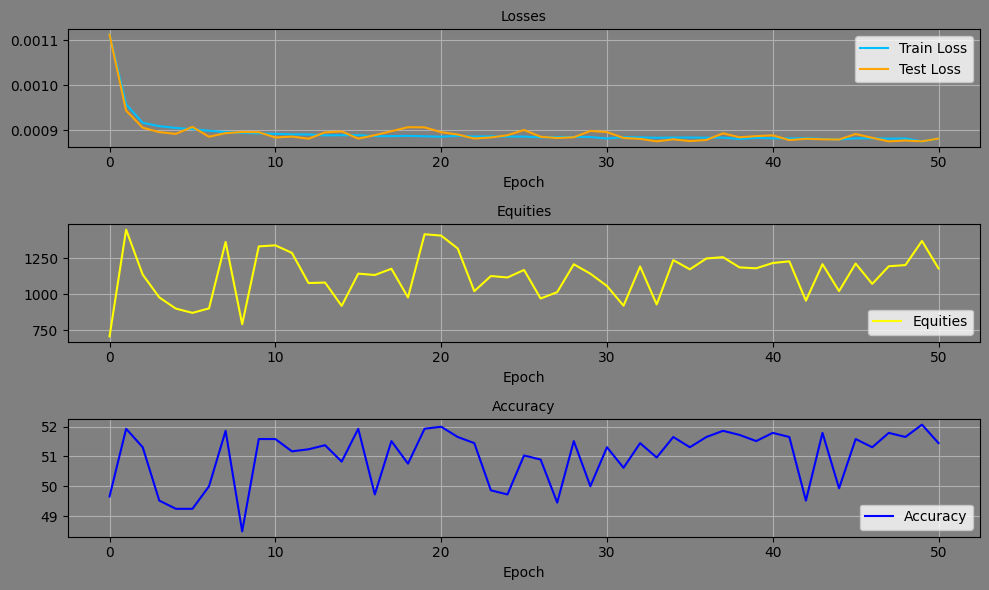

Epoch: 51, Equity: 1198.45, Accuracy: 51.38 train_losses: 0.0020412680659381384, test_losses: 0.0008763526566326618, Duration: 0:00:01.123089


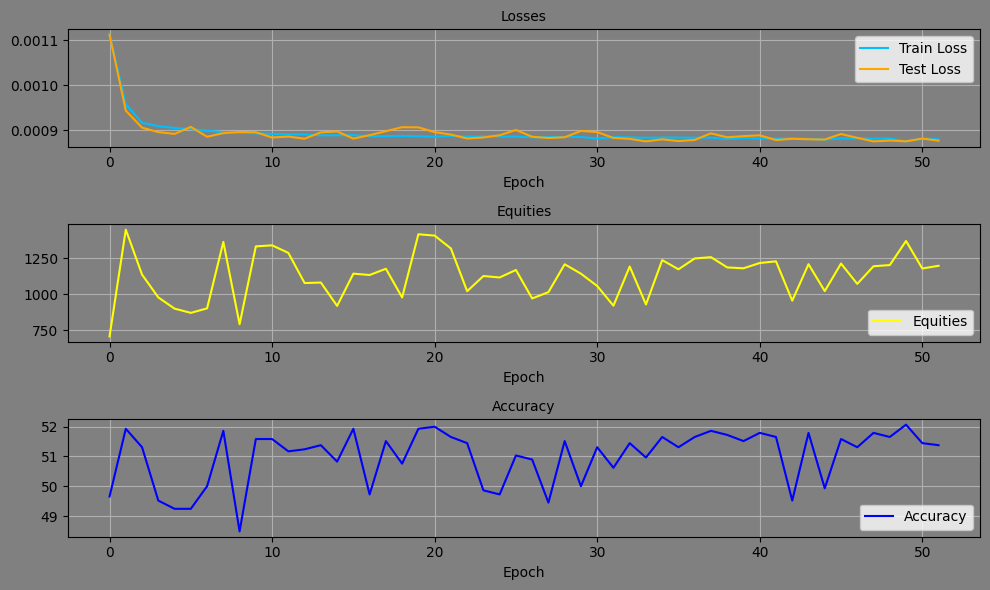

Epoch: 52, Equity: 1374.83, Accuracy: 53.37 train_losses: 0.0020488556146898763, test_losses: 0.0008744108490645885, Duration: 0:00:01.074383


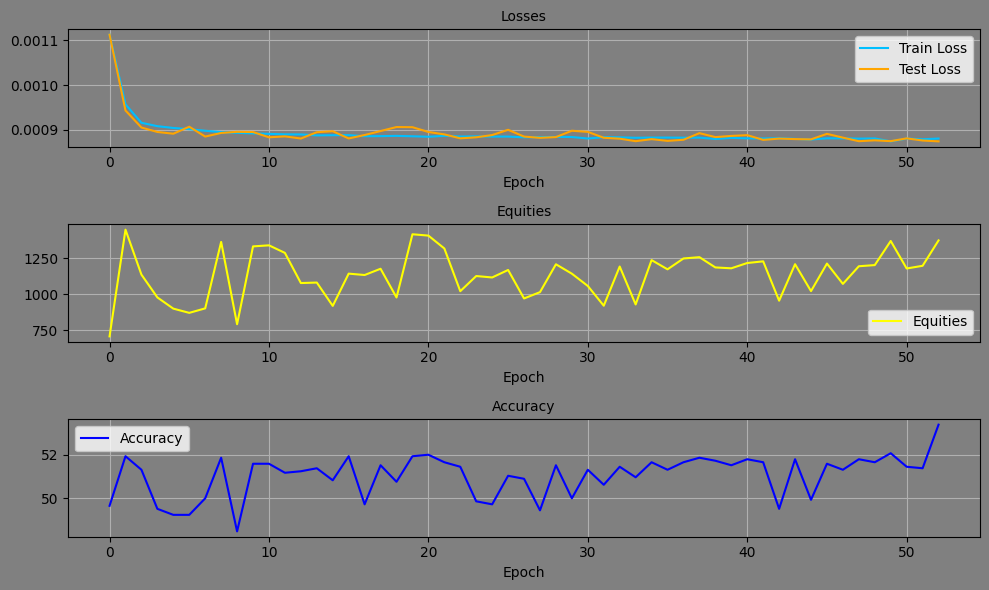

Epoch: 53, Equity: 1211.22, Accuracy: 51.38 train_losses: 0.002041518141800958, test_losses: 0.0008828443242236972, Duration: 0:00:01.056011


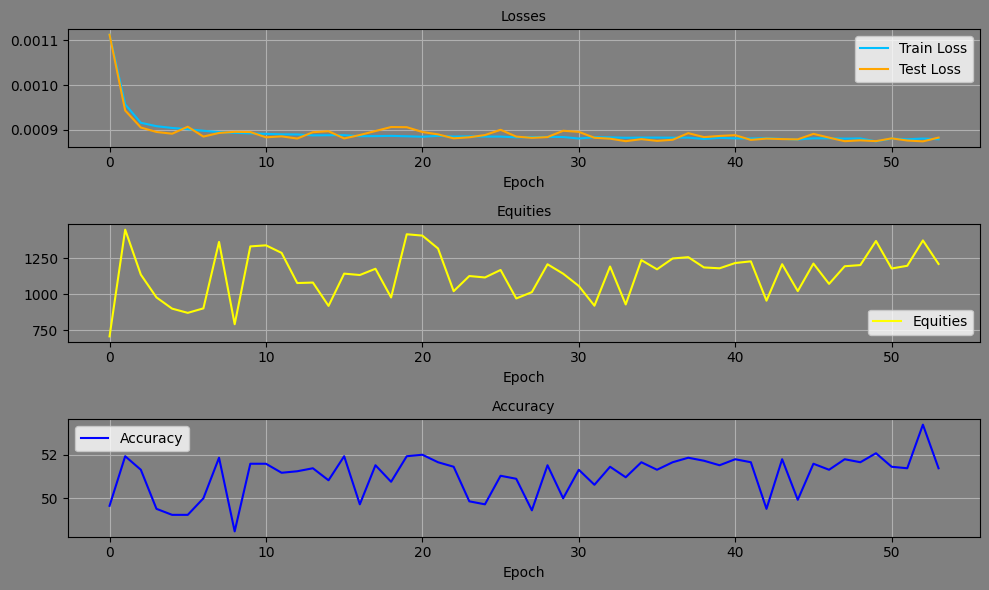

Epoch: 54, Equity: 1199.35, Accuracy: 50.76 train_losses: 0.0020423361365633306, test_losses: 0.0008806895348243415, Duration: 0:00:01.072492


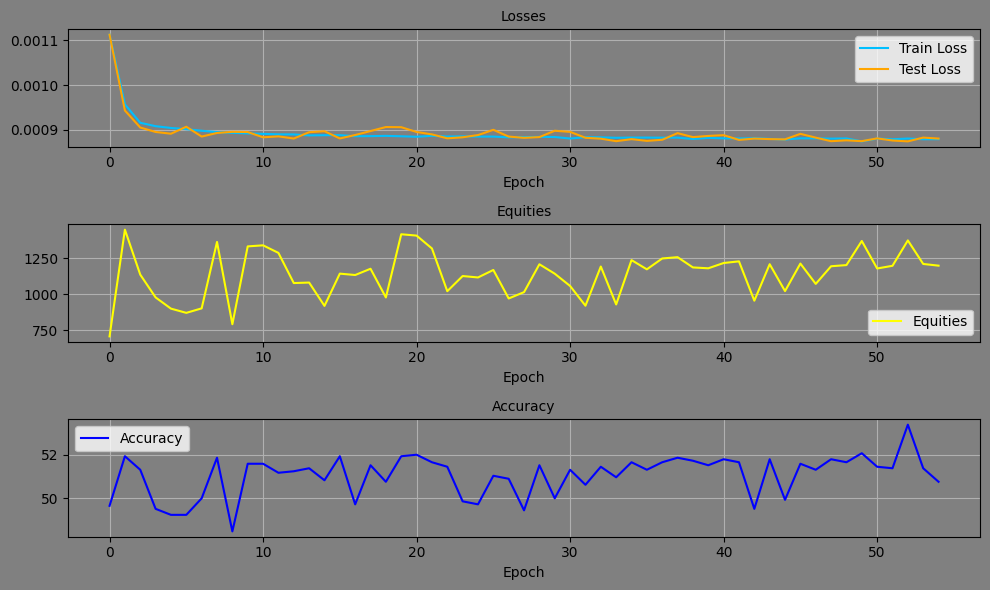

Epoch: 55, Equity: 1129.97, Accuracy: 51.10 train_losses: 0.002026974995275058, test_losses: 0.0008766460814513266, Duration: 0:00:01.035779


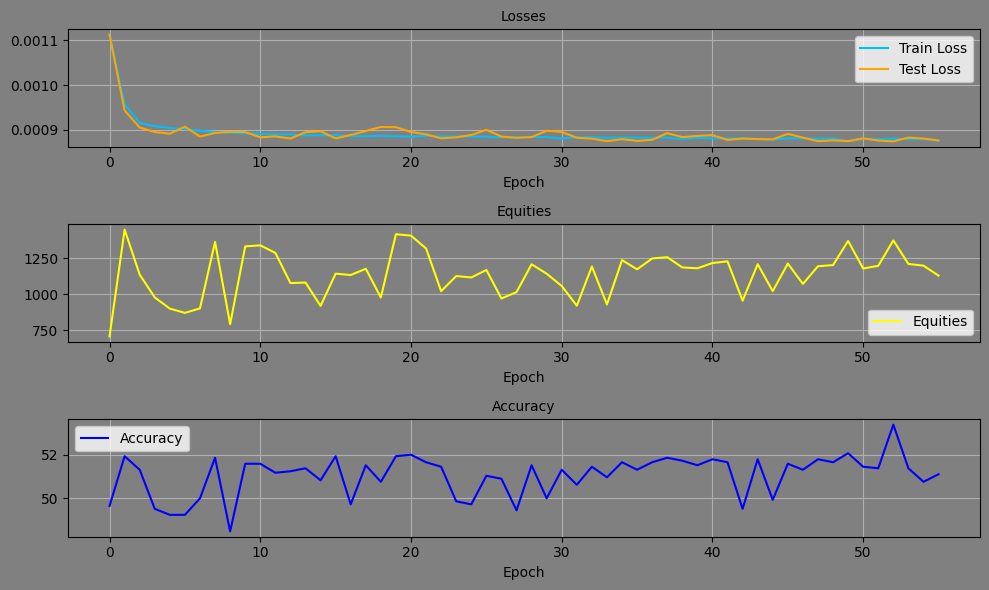

Epoch: 56, Equity: 1281.54, Accuracy: 52.96 train_losses: 0.0020450955224690765, test_losses: 0.0008800207870081067, Duration: 0:00:01.058861


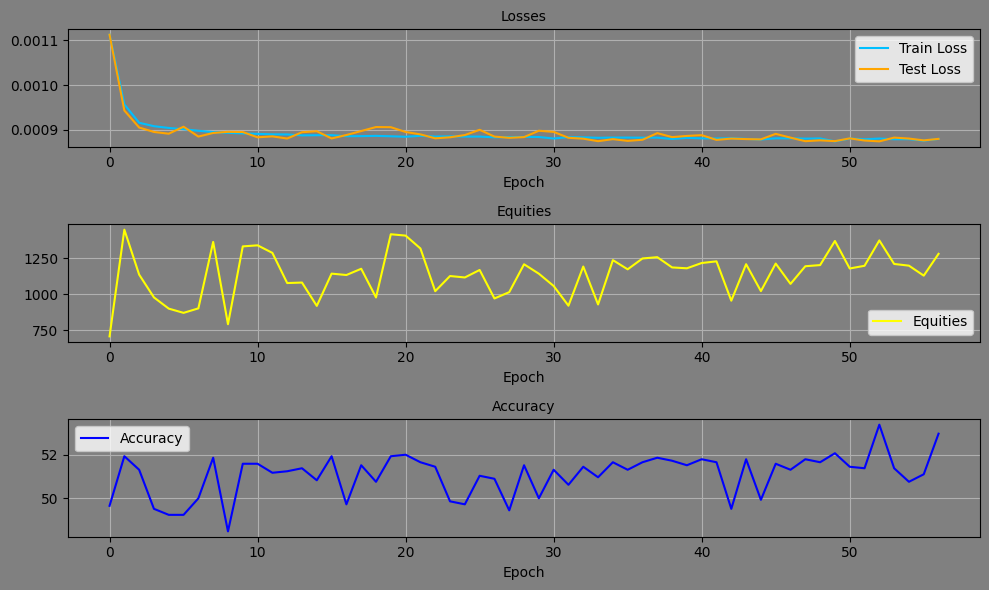

Epoch: 57, Equity: 1265.30, Accuracy: 51.93 train_losses: 0.002041634625448982, test_losses: 0.0008706440567038953, Duration: 0:00:00.995187


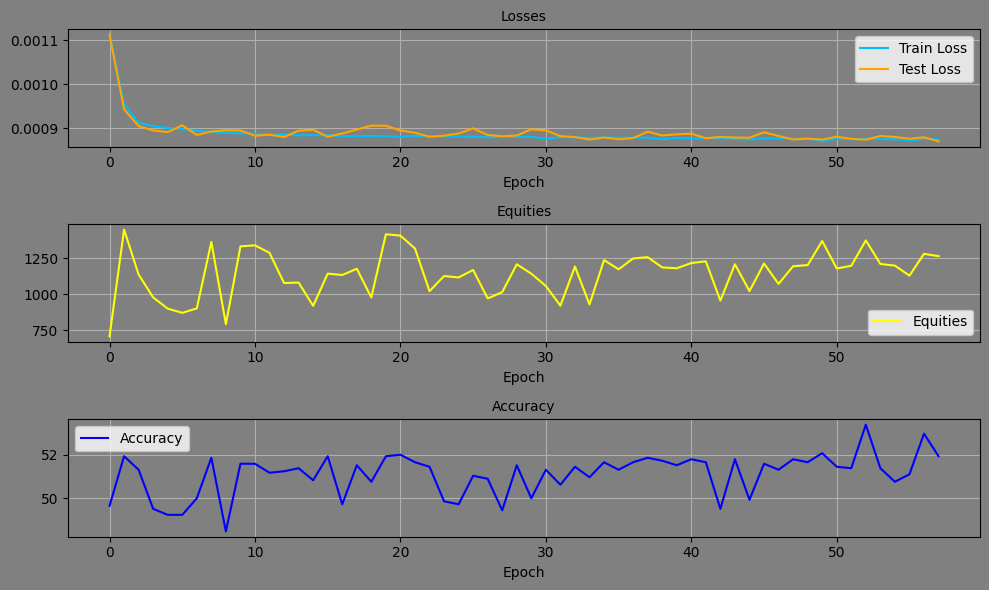

Epoch: 58, Equity: 1094.03, Accuracy: 51.03 train_losses: 0.0020457934294026143, test_losses: 0.0008786242105998099, Duration: 0:00:01.040693


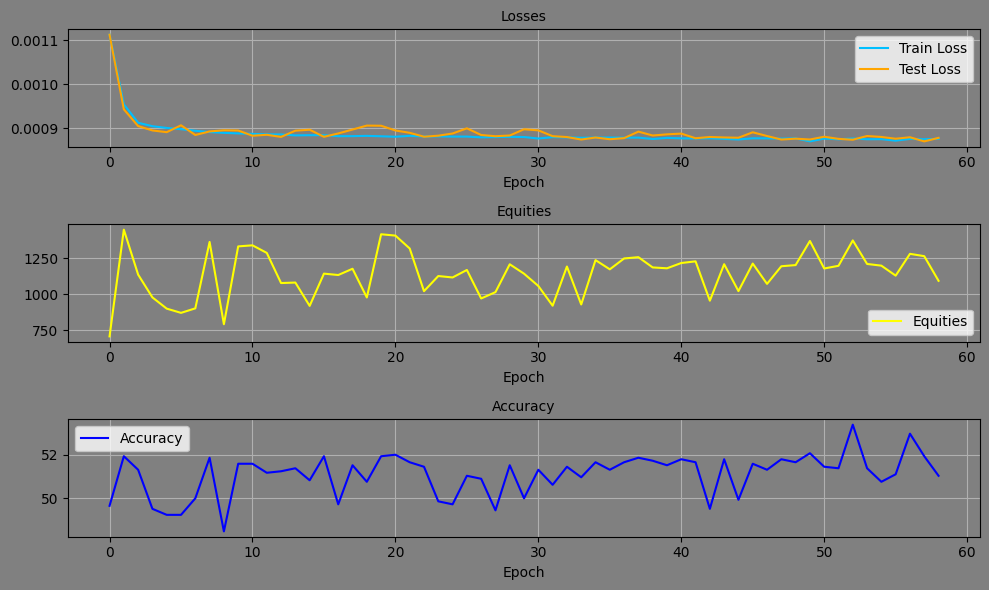

Epoch: 59, Equity: 1369.20, Accuracy: 52.41 train_losses: 0.0020433705985232332, test_losses: 0.0008761784993112087, Duration: 0:00:01.027843


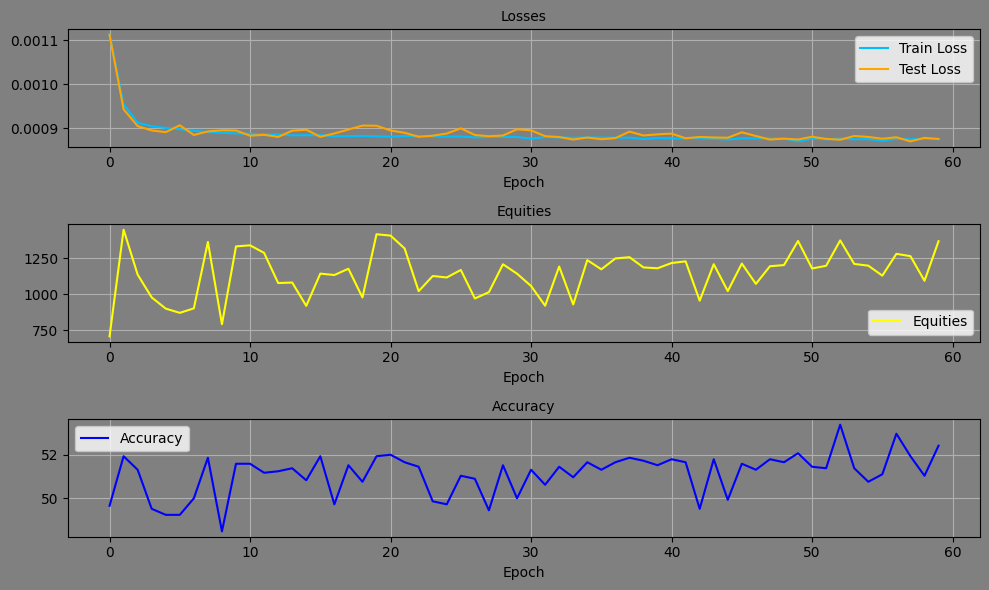

Epoch: 60, Equity: 1034.70, Accuracy: 50.76 train_losses: 0.002041714108740163, test_losses: 0.0008848363650031388, Duration: 0:00:01.032834


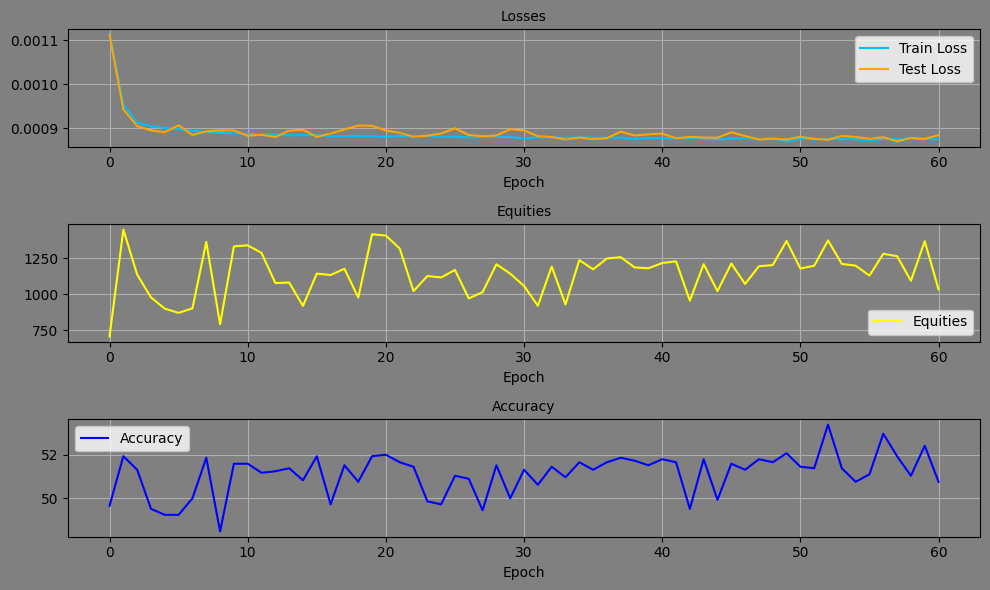

Epoch: 61, Equity: 1119.19, Accuracy: 51.17 train_losses: 0.0020444211288226776, test_losses: 0.0008777644252404571, Duration: 0:00:01.081443


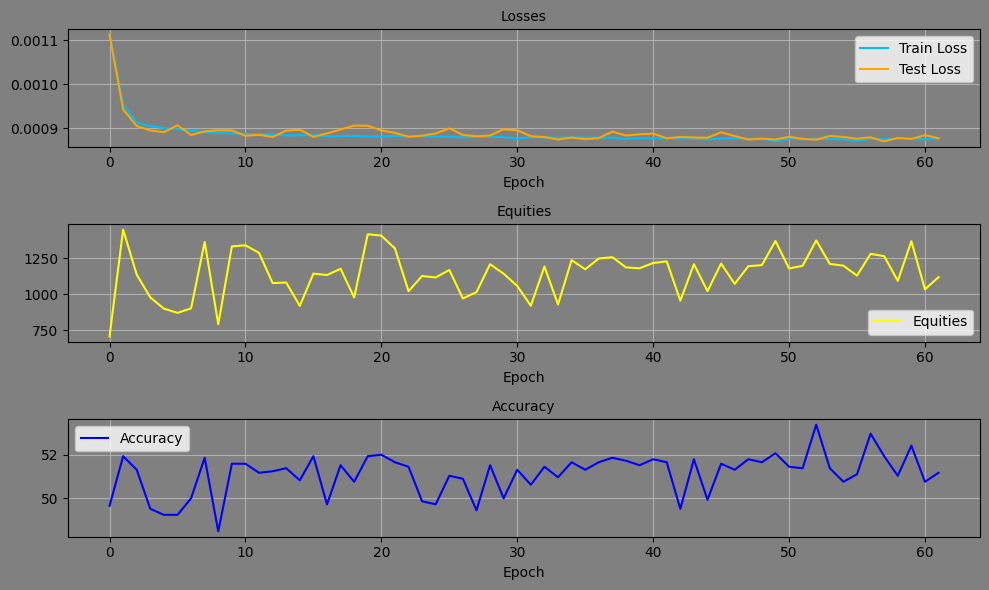

Epoch: 62, Equity: 1147.75, Accuracy: 51.17 train_losses: 0.002043794080432284, test_losses: 0.0008771653519943357, Duration: 0:00:01.010390


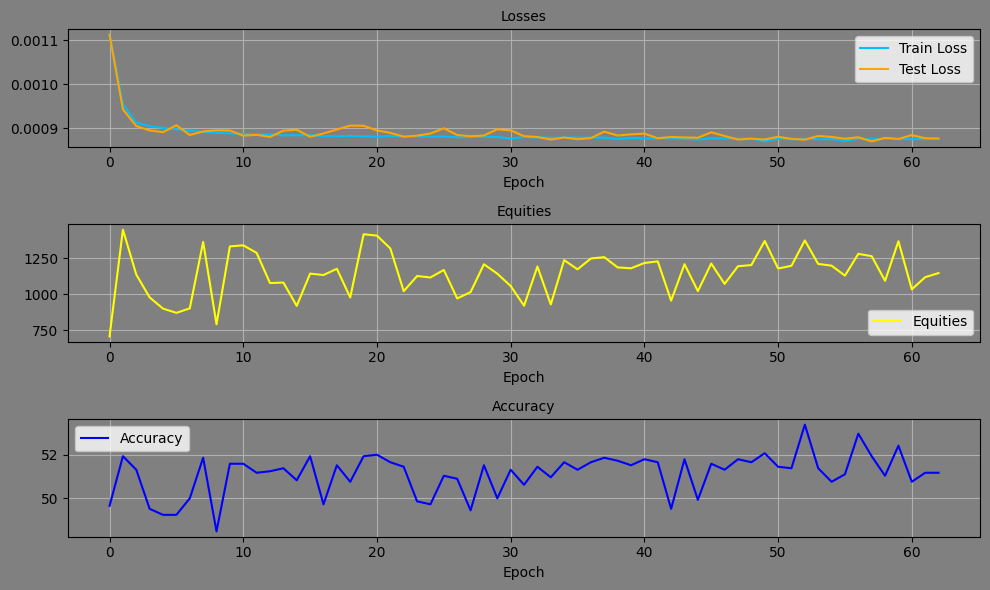

Epoch: 63, Equity: 1164.87, Accuracy: 50.00 train_losses: 0.002038826927706252, test_losses: 0.0008743219077587128, Duration: 0:00:01.053335


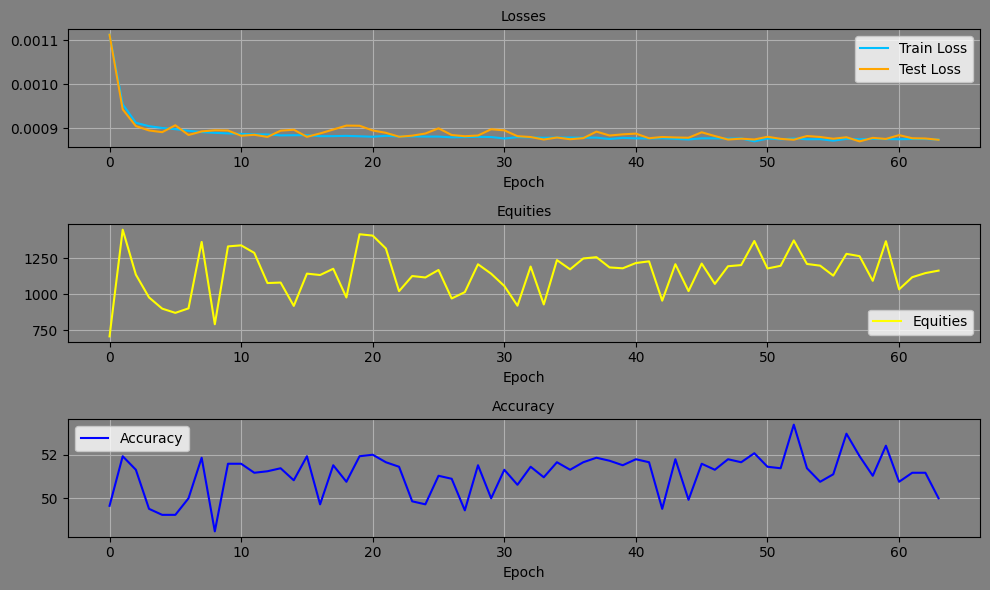

Epoch: 64, Equity: 1088.93, Accuracy: 50.90 train_losses: 0.0020436689508603187, test_losses: 0.0008806029218249023, Duration: 0:00:01.100194


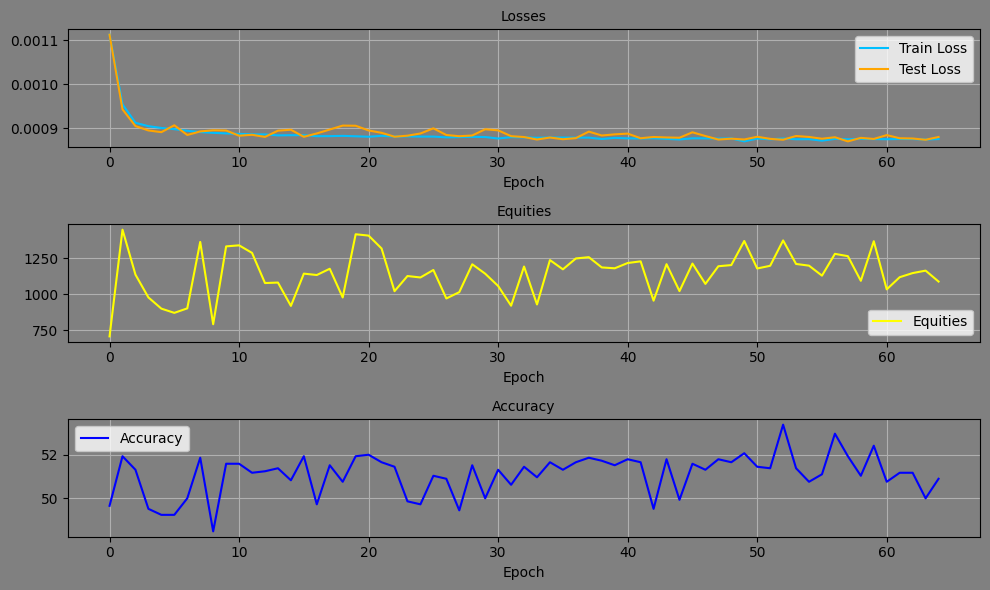

Epoch: 65, Equity: 1237.47, Accuracy: 51.86 train_losses: 0.0020416379906445757, test_losses: 0.00087297975551337, Duration: 0:00:01.050603


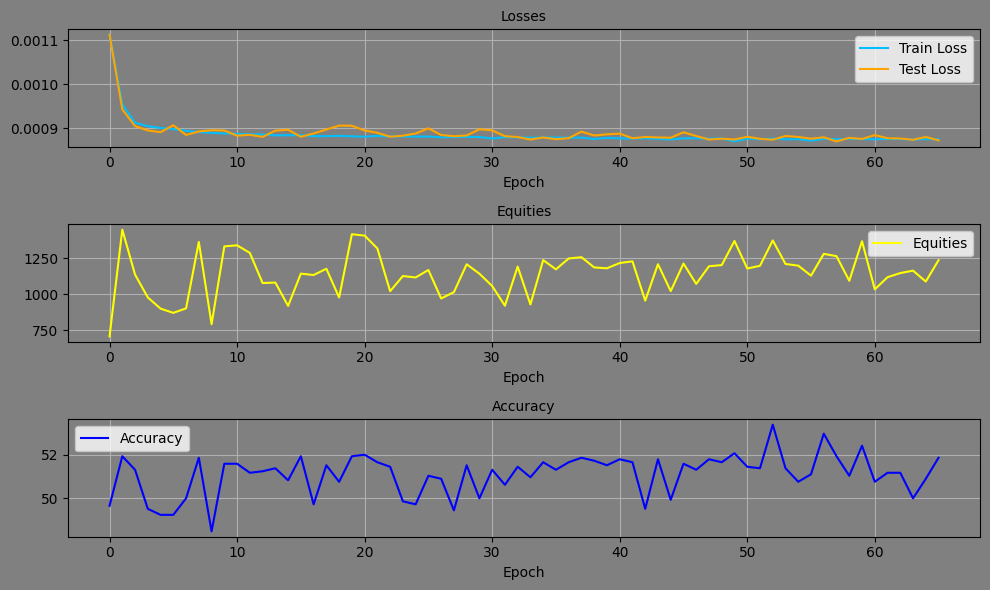

Epoch: 66, Equity: 1153.93, Accuracy: 50.96 train_losses: 0.002040336676602048, test_losses: 0.0008792425505816936, Duration: 0:00:01.029008


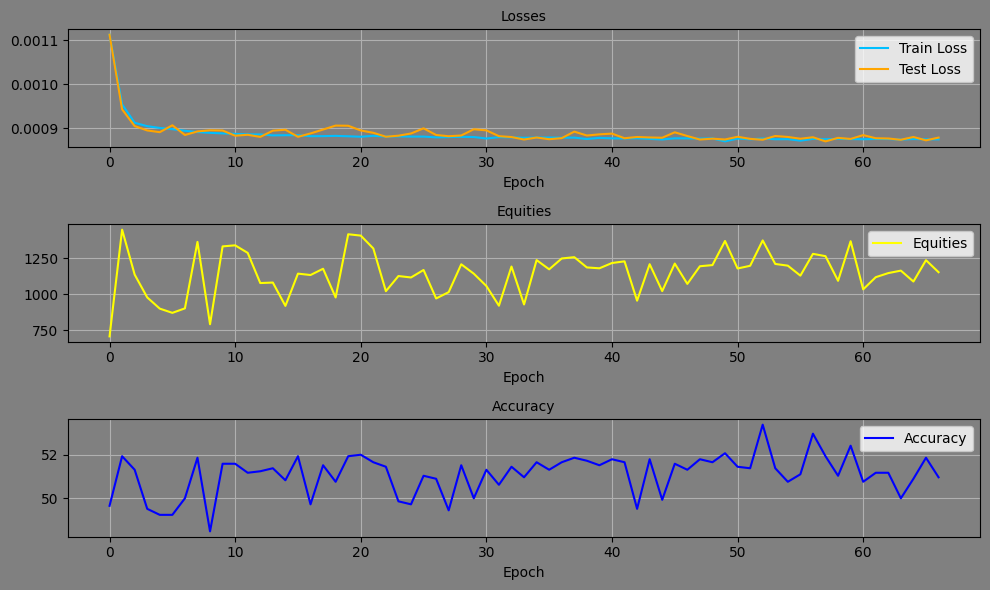

Epoch: 67, Equity: 1133.72, Accuracy: 50.62 train_losses: 0.0020439141025427915, test_losses: 0.0008760228520259261, Duration: 0:00:01.034171


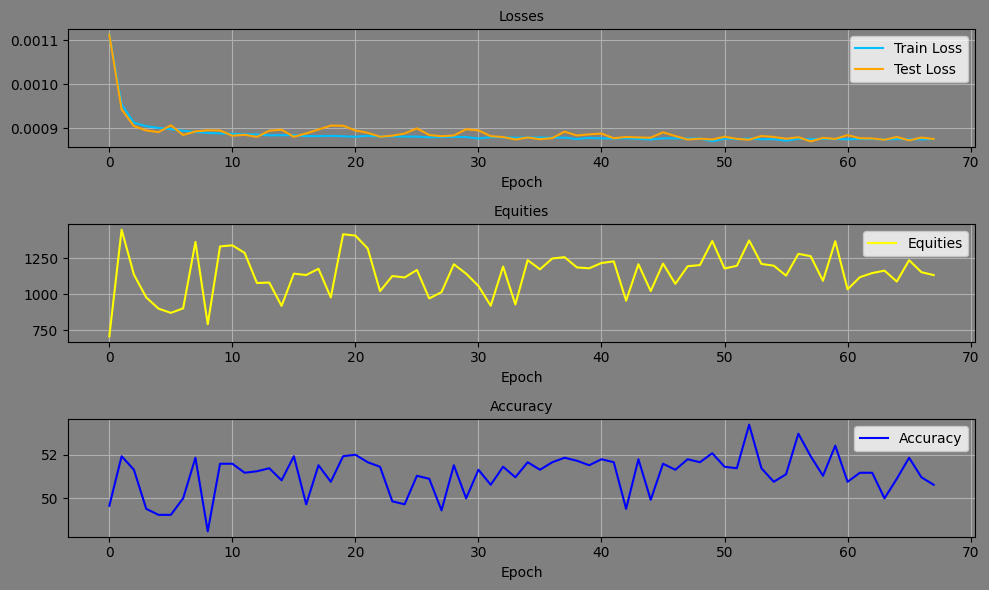

Epoch: 68, Equity: 1367.08, Accuracy: 52.27 train_losses: 0.002039548732014039, test_losses: 0.0008694732678122818, Duration: 0:00:01.138396


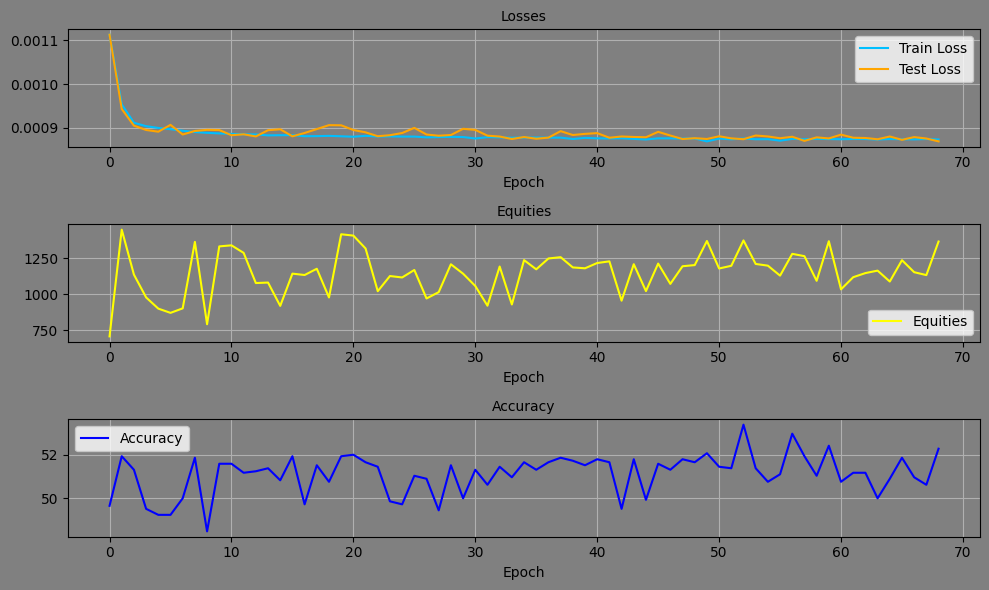

Epoch: 69, Equity: 1119.62, Accuracy: 49.45 train_losses: 0.0020397397291873278, test_losses: 0.0008997168624773622, Duration: 0:00:01.335813


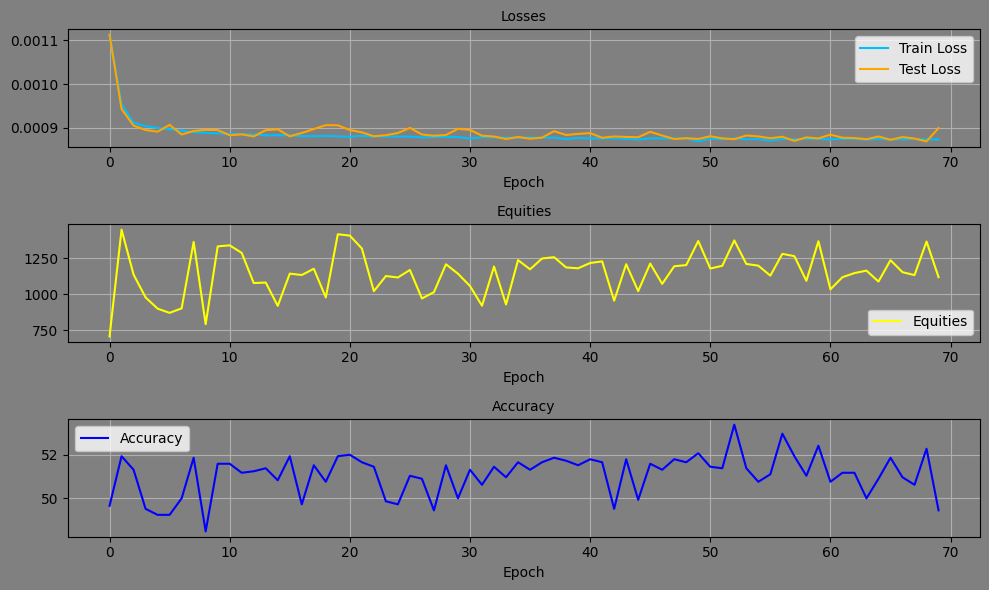

Epoch: 70, Equity: 1476.45, Accuracy: 53.58 train_losses: 0.0020394472084650736, test_losses: 0.0008699130266904831, Duration: 0:00:01.194030


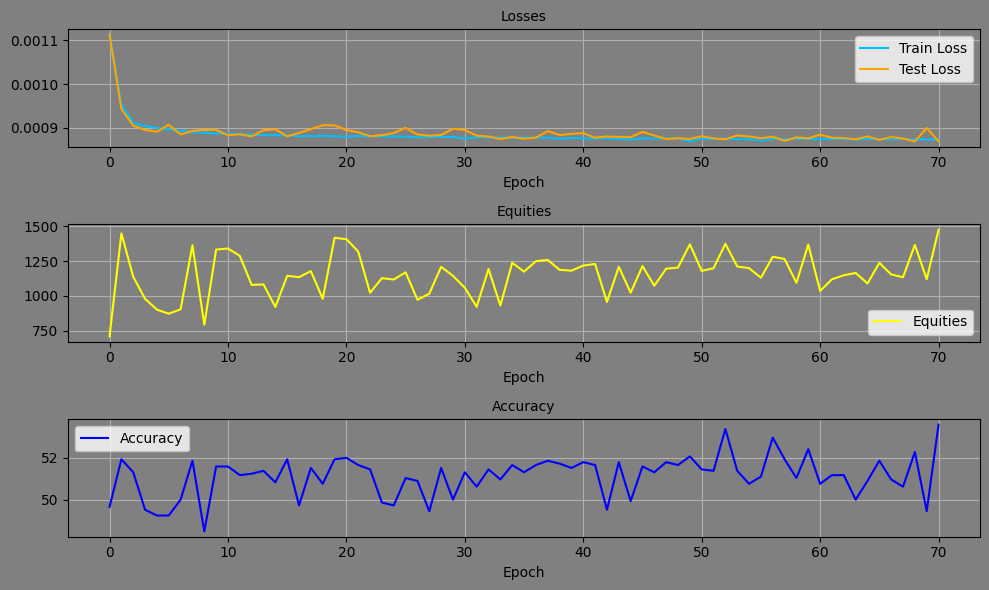

Epoch: 71, Equity: 1259.93, Accuracy: 51.31 train_losses: 0.002040348979803036, test_losses: 0.0008737344760447741, Duration: 0:00:01.186554


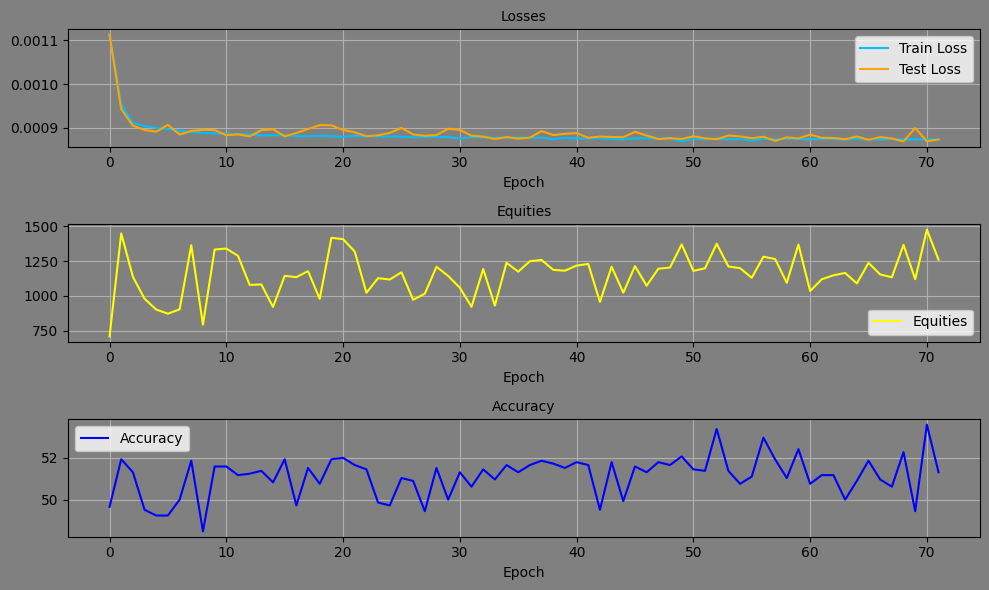

Epoch: 72, Equity: 1312.56, Accuracy: 52.34 train_losses: 0.002041608480195011, test_losses: 0.0008739574695937335, Duration: 0:00:01.148365


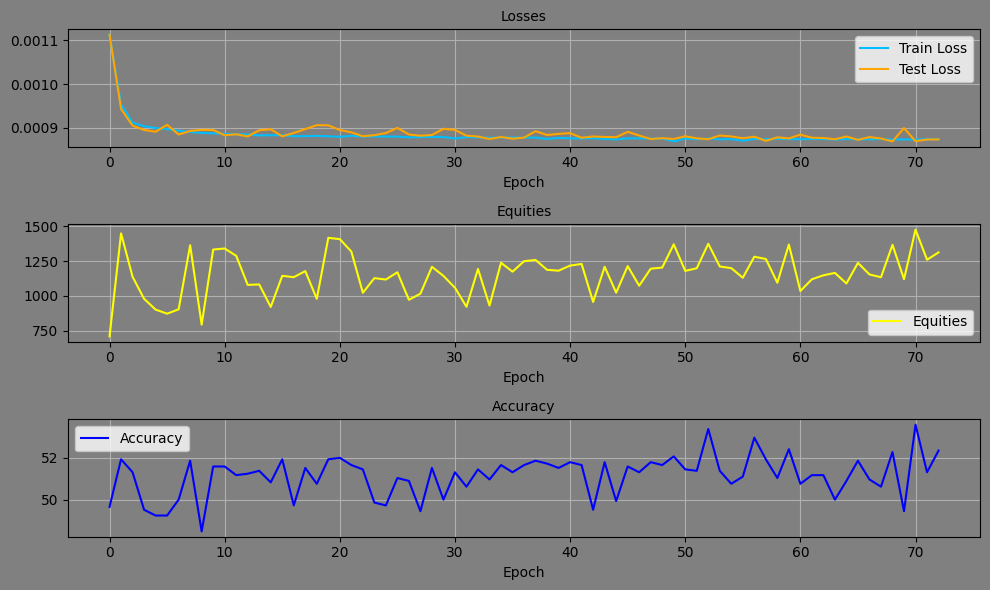

Epoch: 73, Equity: 1103.41, Accuracy: 50.90 train_losses: 0.0020413078607842794, test_losses: 0.0008735405863262713, Duration: 0:00:01.097927


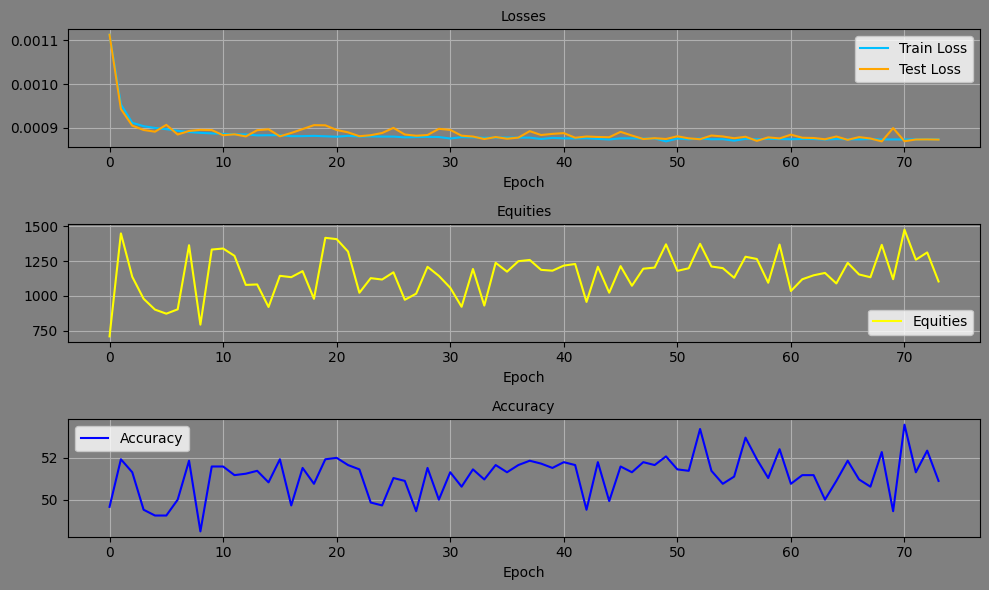

Epoch: 74, Equity: 1395.24, Accuracy: 52.82 train_losses: 0.0020384396274914585, test_losses: 0.0008754318114370108, Duration: 0:00:01.044314


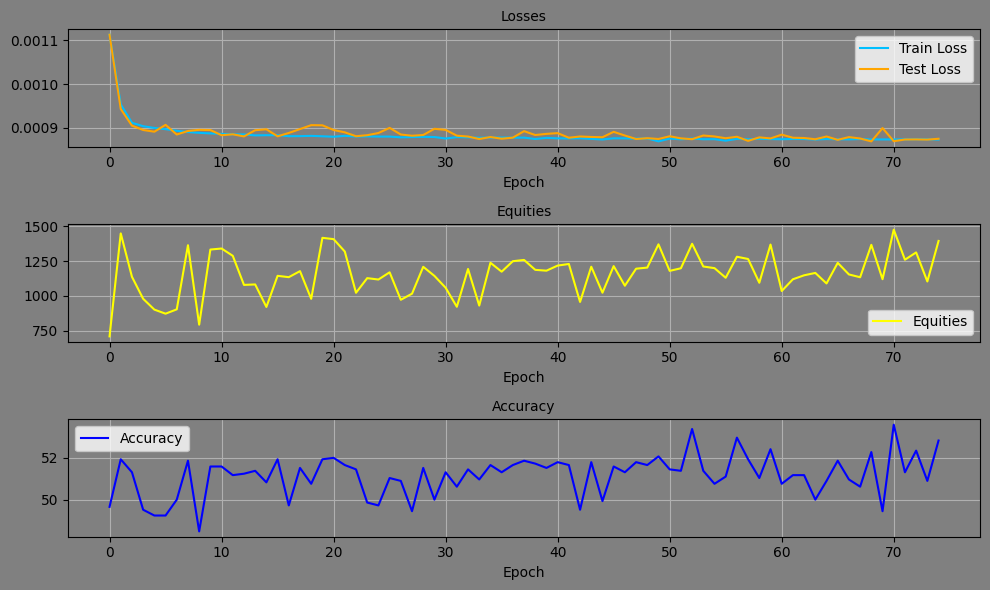

Epoch: 75, Equity: 1404.96, Accuracy: 52.96 train_losses: 0.002037377899519325, test_losses: 0.000874428718816489, Duration: 0:00:01.131317


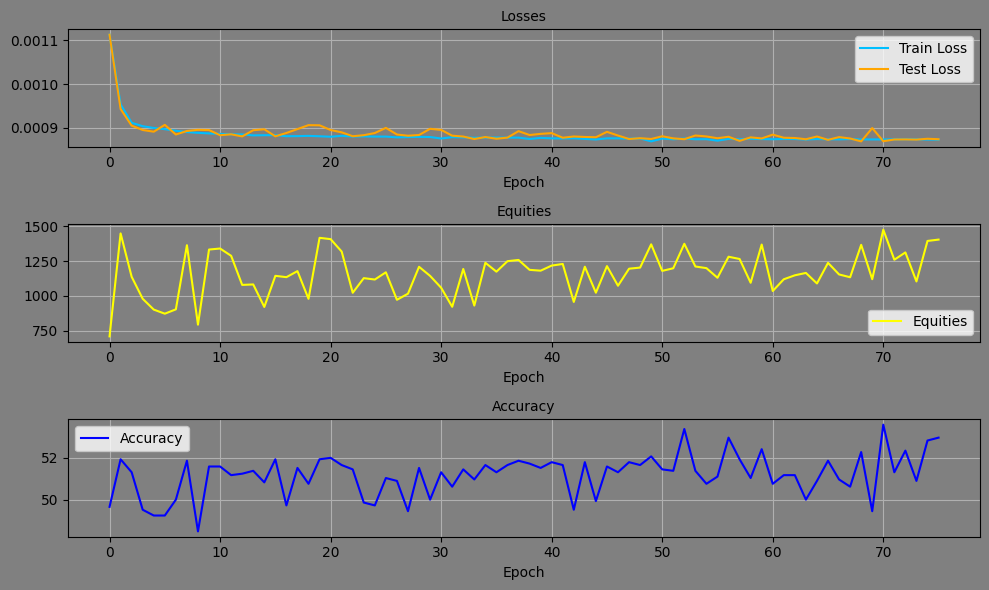

Epoch: 76, Equity: 1104.52, Accuracy: 51.17 train_losses: 0.0020374390976770538, test_losses: 0.0008744364604353905, Duration: 0:00:01.177796


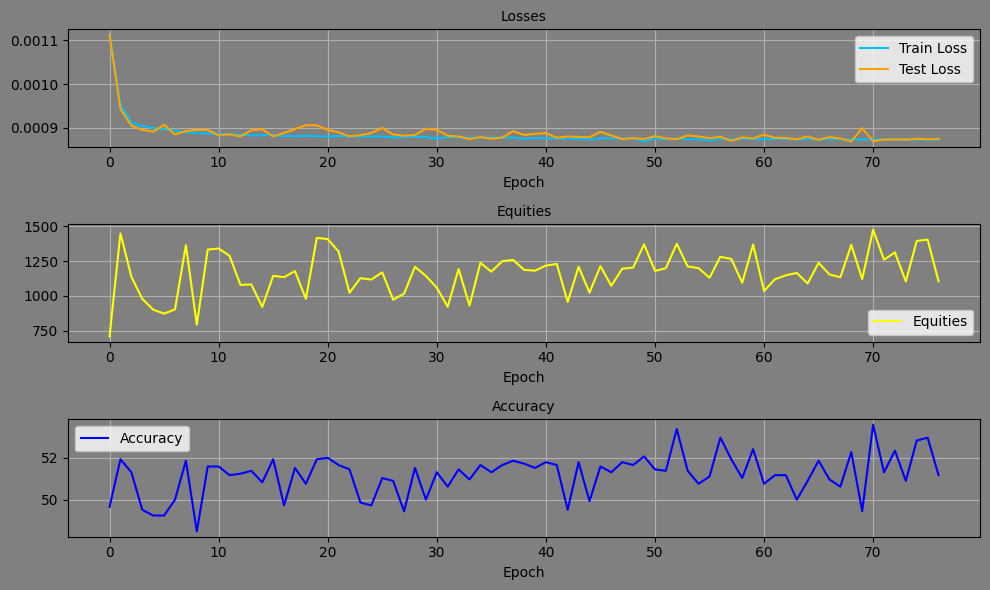

Epoch: 77, Equity: 1172.27, Accuracy: 51.52 train_losses: 0.0020372038810408766, test_losses: 0.0008754160371609032, Duration: 0:00:01.154478


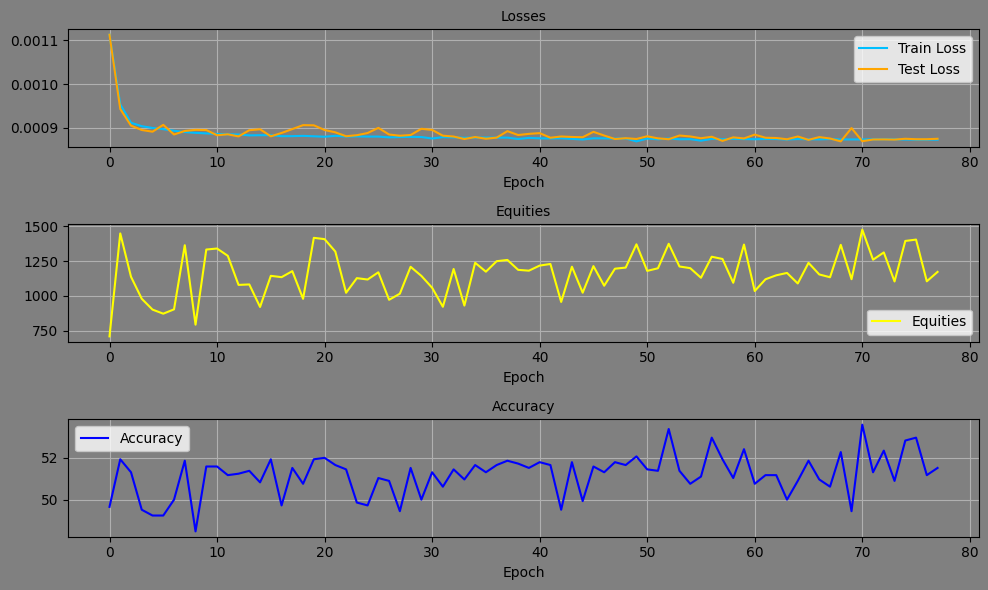

Epoch: 78, Equity: 1435.95, Accuracy: 52.96 train_losses: 0.002033818832984174, test_losses: 0.0008782077929936349, Duration: 0:00:01.129125


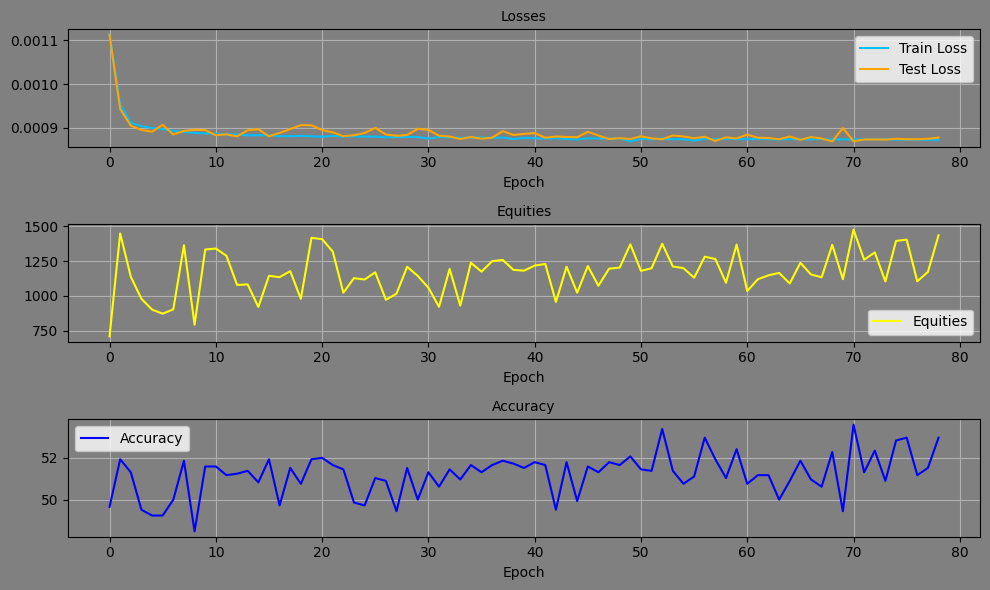

Epoch: 79, Equity: 1432.37, Accuracy: 53.17 train_losses: 0.0020321008838391046, test_losses: 0.0008790199062786996, Duration: 0:00:01.084898


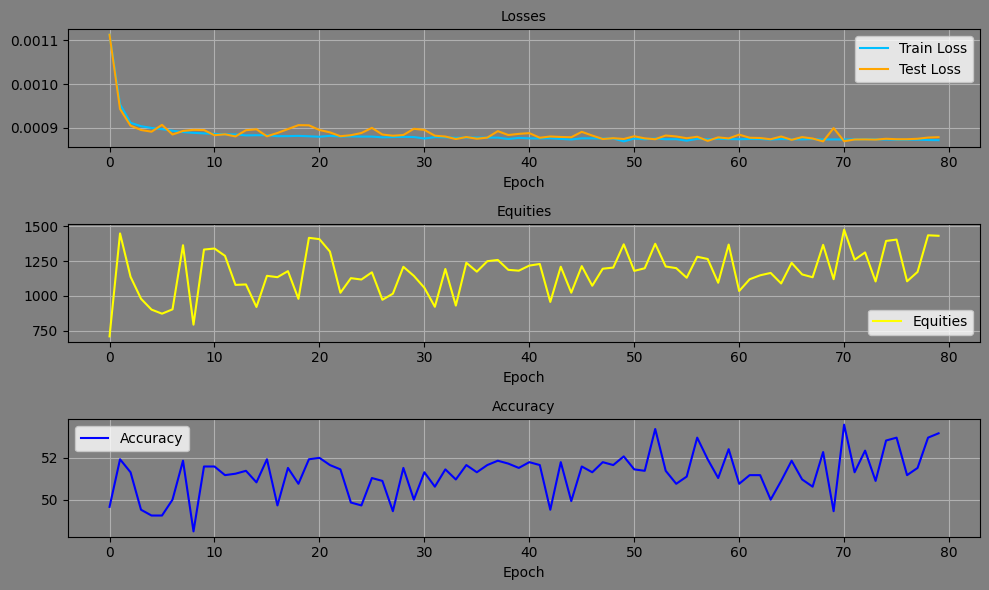

Epoch: 80, Equity: 1276.95, Accuracy: 52.48 train_losses: 0.002037906242425196, test_losses: 0.0008726173546165228, Duration: 0:00:01.072735


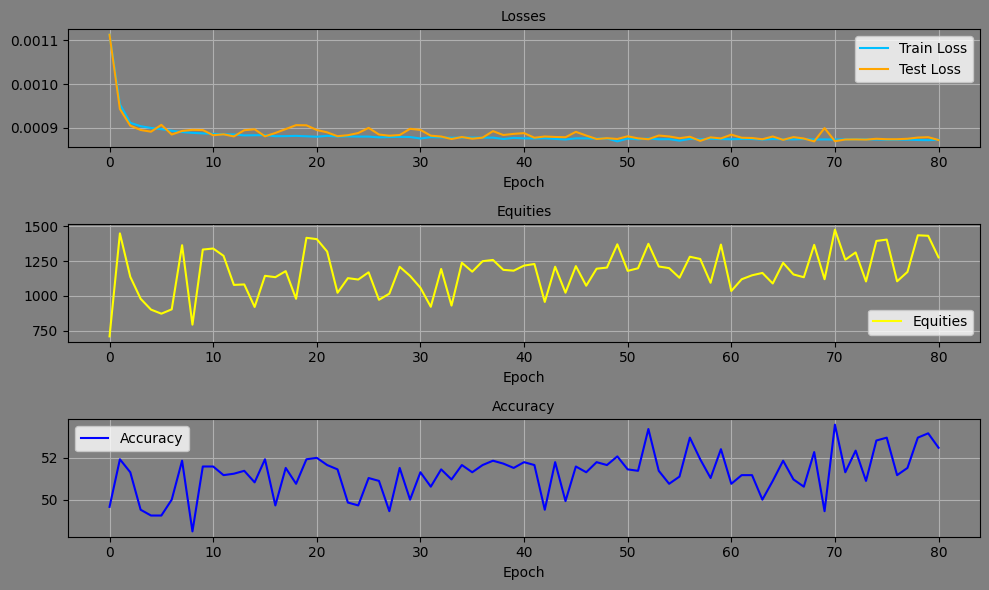

Epoch: 81, Equity: 1571.03, Accuracy: 53.99 train_losses: 0.0020378342721991804, test_losses: 0.000876266451086849, Duration: 0:00:01.056219


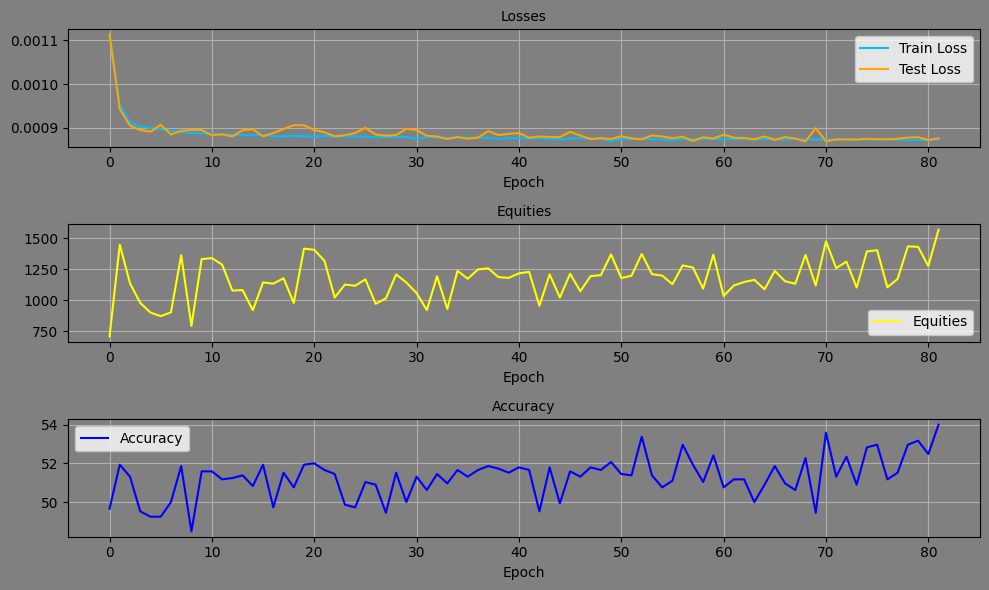

Epoch: 82, Equity: 1115.01, Accuracy: 50.90 train_losses: 0.002036985446883392, test_losses: 0.0008722100756131113, Duration: 0:00:01.077329


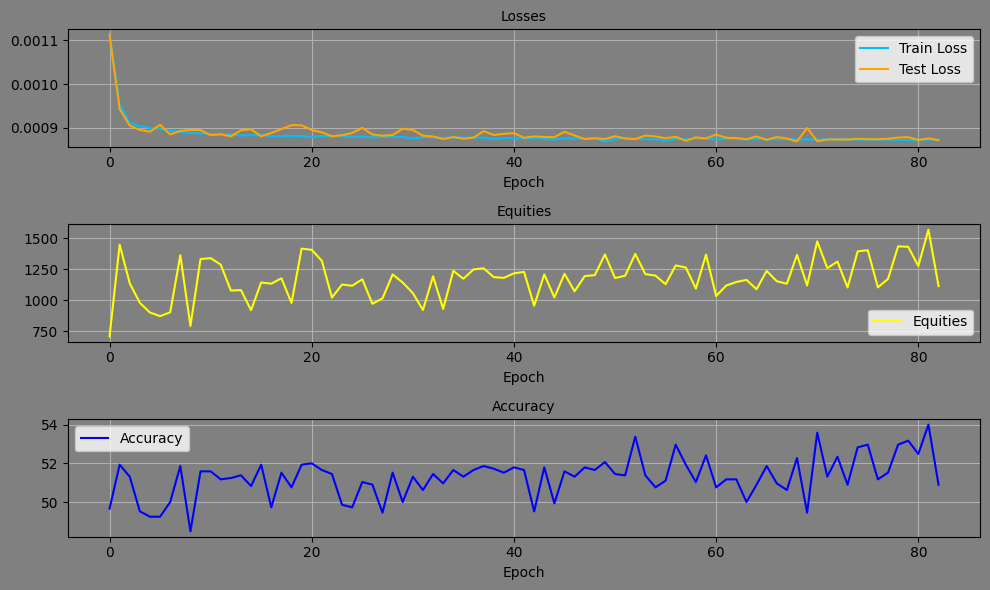

Epoch: 83, Equity: 1129.75, Accuracy: 49.79 train_losses: 0.002031526655771546, test_losses: 0.0008762018987908959, Duration: 0:00:01.141206


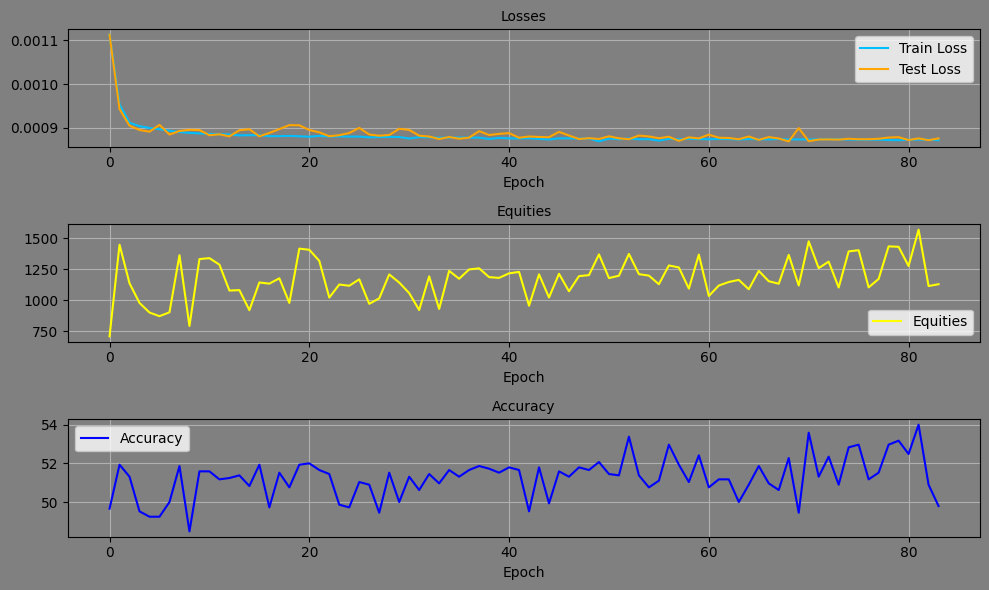

Epoch: 84, Equity: 1432.97, Accuracy: 52.89 train_losses: 0.0020305371843695667, test_losses: 0.0008751345449127257, Duration: 0:00:01.124969


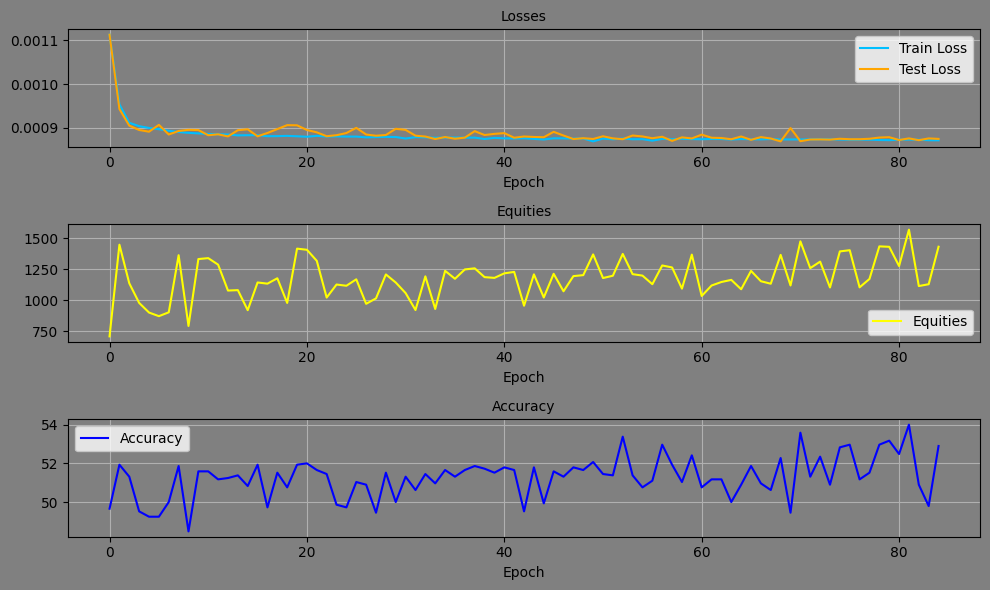

Epoch: 85, Equity: 1142.70, Accuracy: 50.28 train_losses: 0.00203573847386492, test_losses: 0.0008731762645766139, Duration: 0:00:01.088783


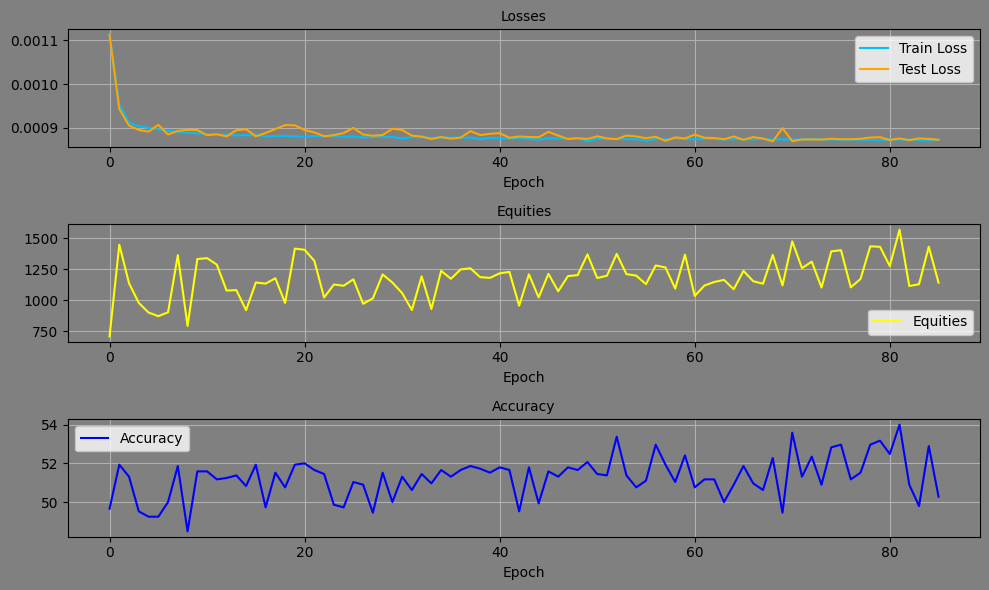

Epoch: 86, Equity: 1101.27, Accuracy: 50.90 train_losses: 0.002035764939365341, test_losses: 0.0008752149296924472, Duration: 0:00:01.054944


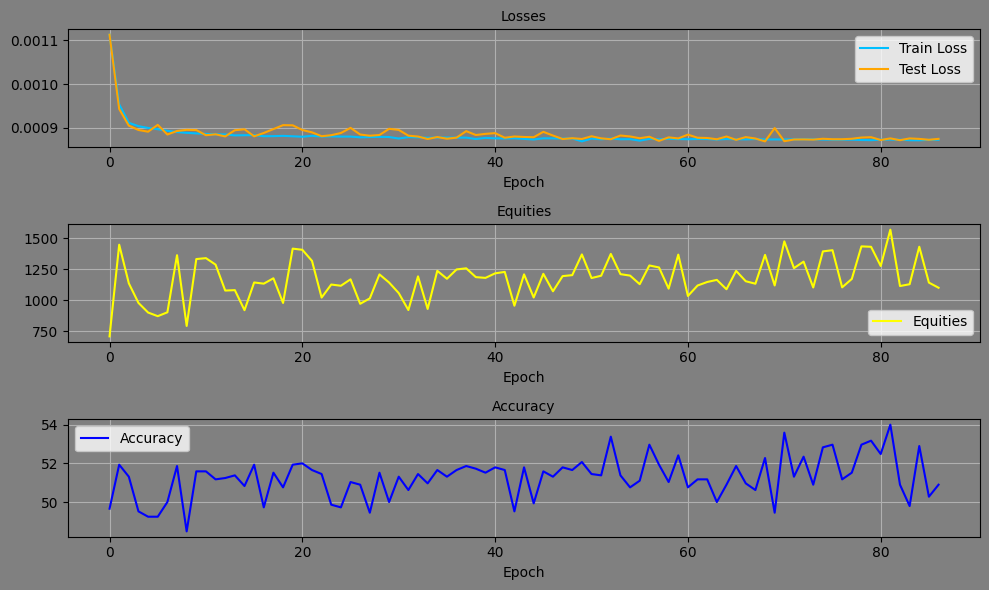

Epoch: 87, Equity: 1421.11, Accuracy: 53.10 train_losses: 0.002035369100462225, test_losses: 0.0008730523404665291, Duration: 0:00:01.074010


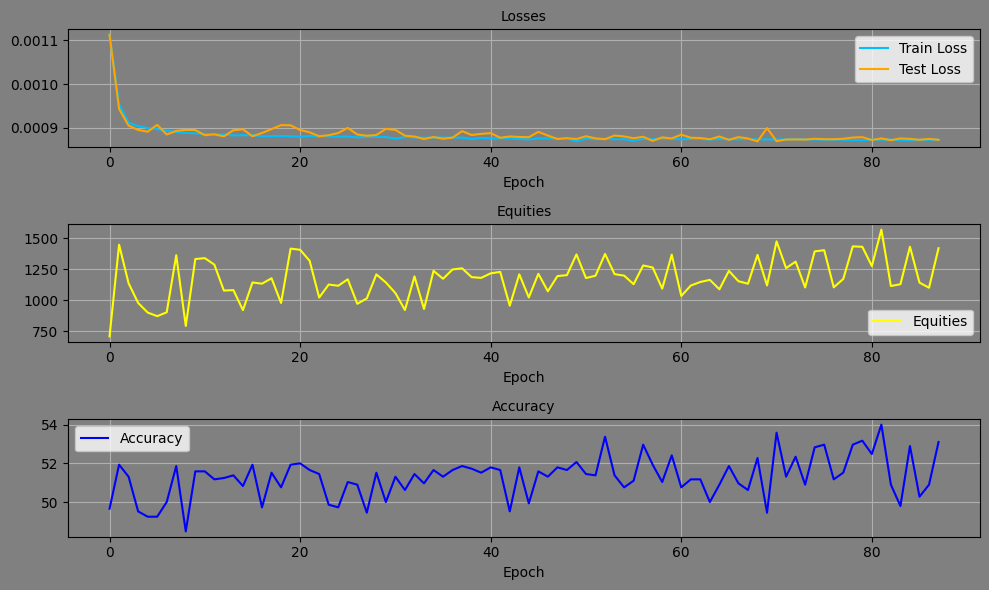

Epoch: 88, Equity: 1185.57, Accuracy: 50.76 train_losses: 0.0020359317144323943, test_losses: 0.0008757624309509993, Duration: 0:00:01.064643


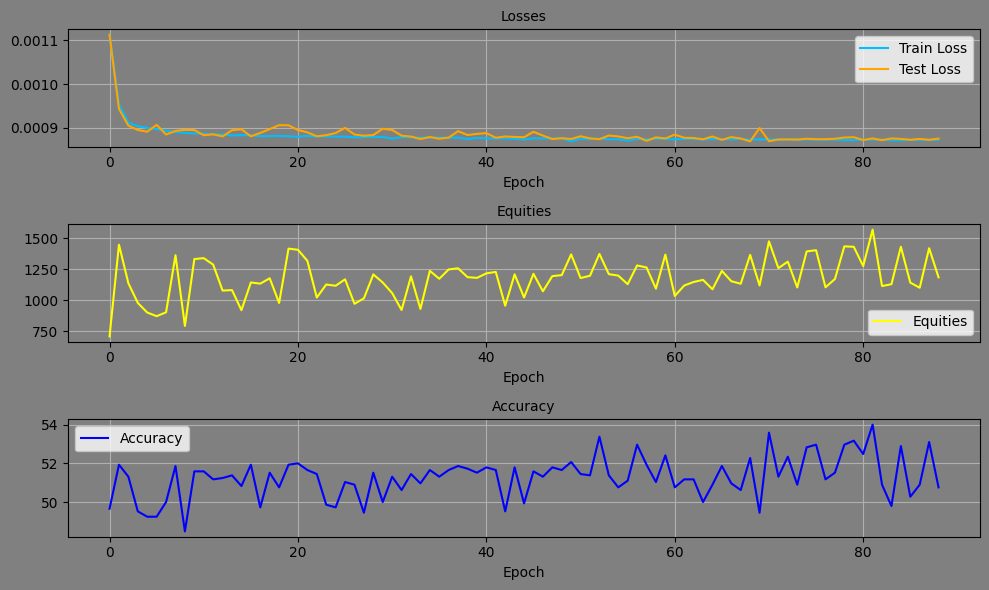

Epoch: 89, Equity: 1165.46, Accuracy: 51.03 train_losses: 0.002035762884572322, test_losses: 0.0008742462377995253, Duration: 0:00:01.047750


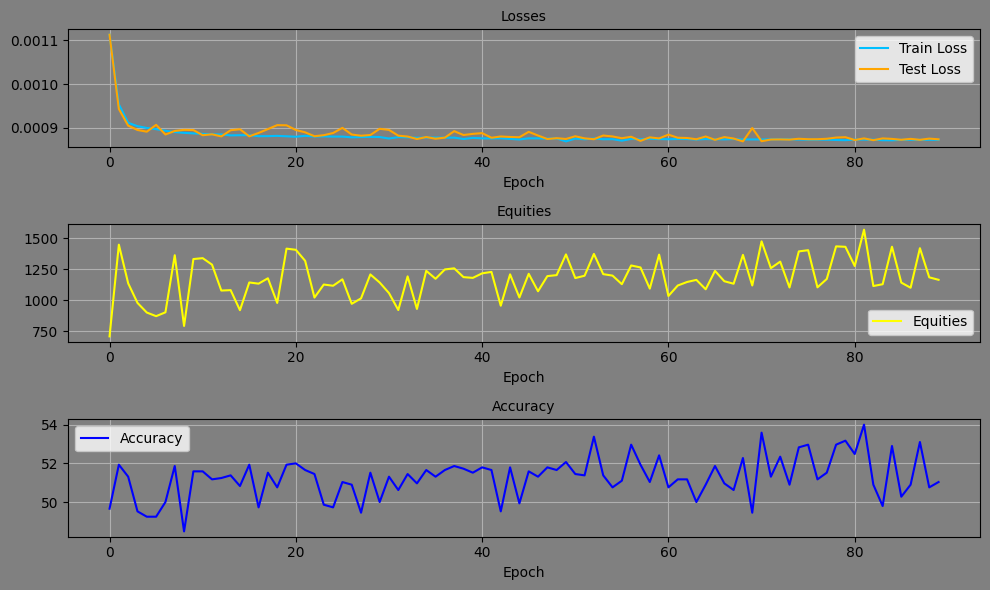

Epoch: 90, Equity: 1169.10, Accuracy: 50.41 train_losses: 0.0020331513741859786, test_losses: 0.000874721969012171, Duration: 0:00:01.000159


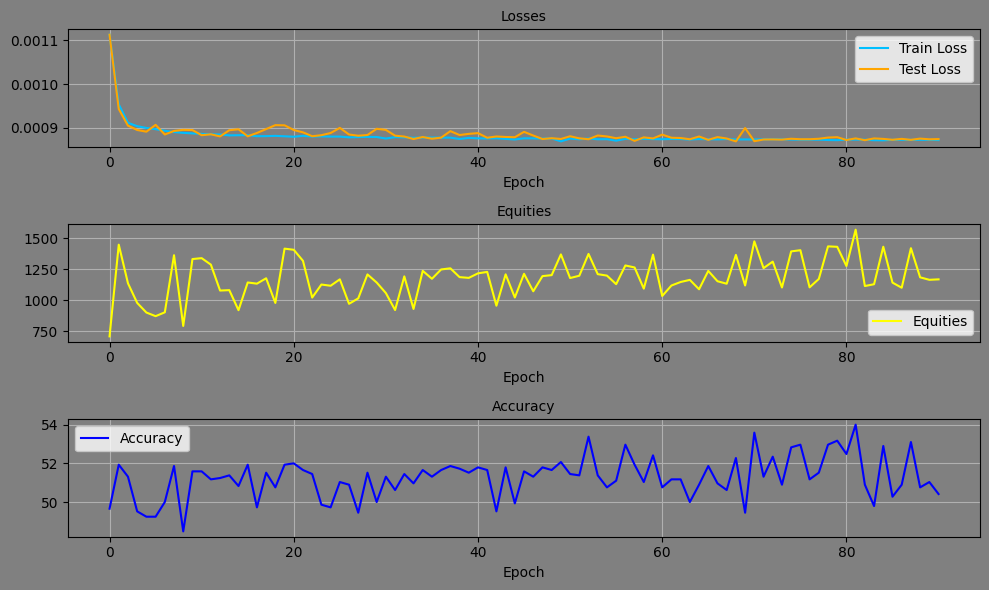

Epoch: 91, Equity: 1080.20, Accuracy: 49.24 train_losses: 0.002029079446105093, test_losses: 0.0008849425357766449, Duration: 0:00:00.997745


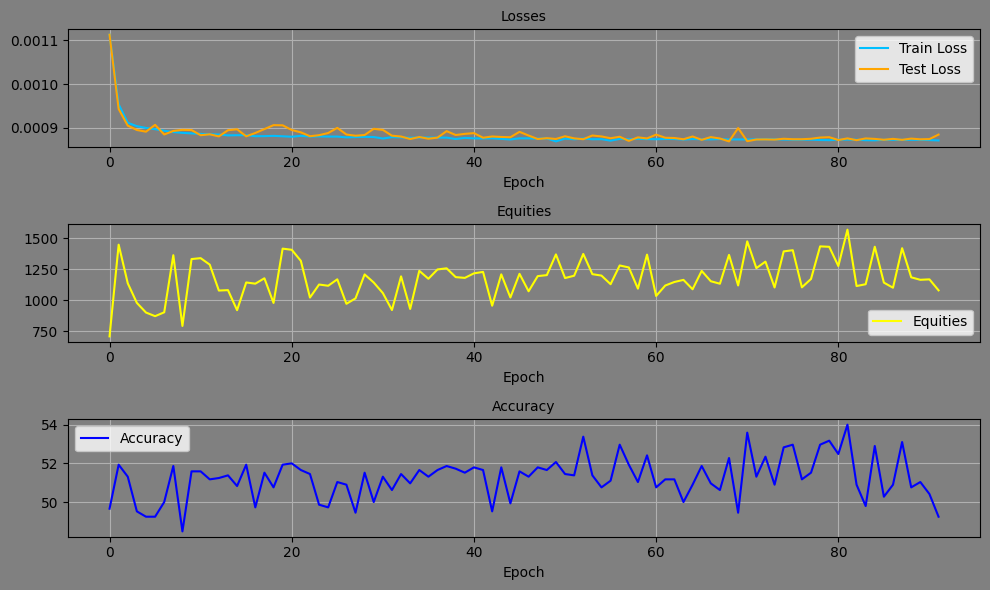

Epoch: 92, Equity: 1142.23, Accuracy: 50.48 train_losses: 0.0020345038224068406, test_losses: 0.0008715576841495931, Duration: 0:00:01.027444


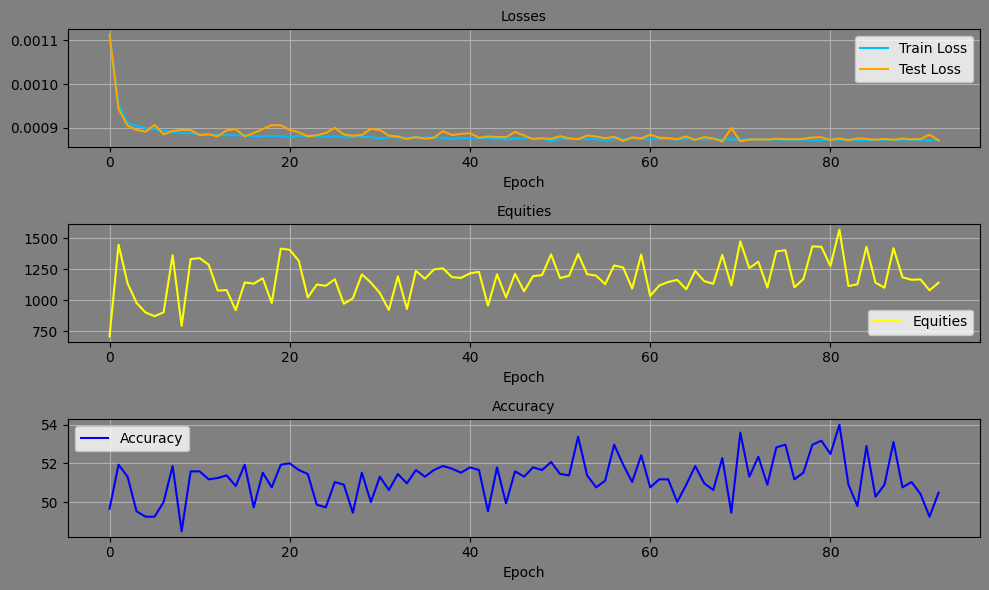

Epoch: 93, Equity: 1113.08, Accuracy: 50.62 train_losses: 0.0020343887162358105, test_losses: 0.0008732342394068837, Duration: 0:00:01.061709


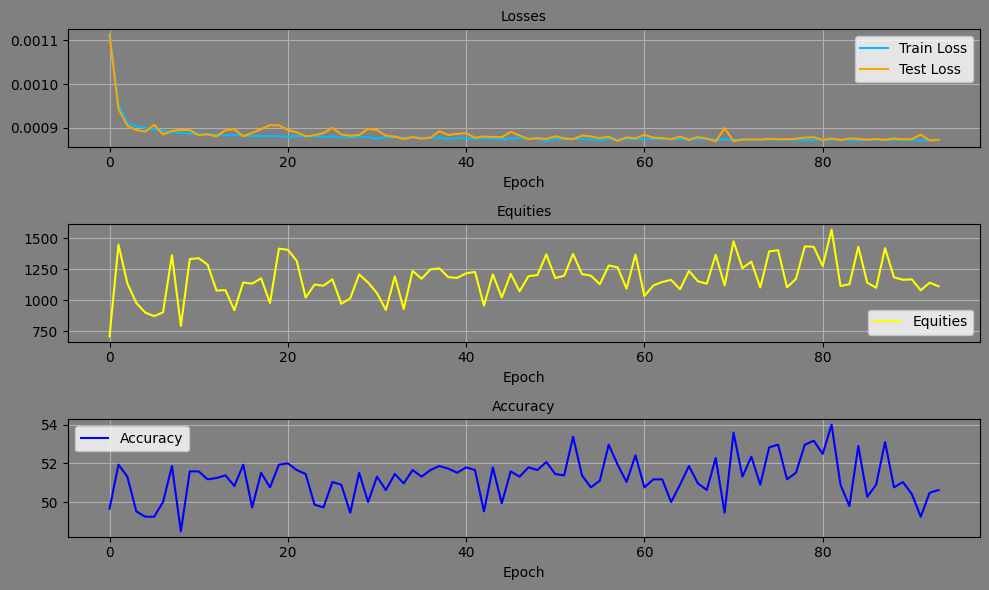

Epoch: 94, Equity: 1170.71, Accuracy: 51.52 train_losses: 0.002029226933469108, test_losses: 0.0008729639812372625, Duration: 0:00:01.041984


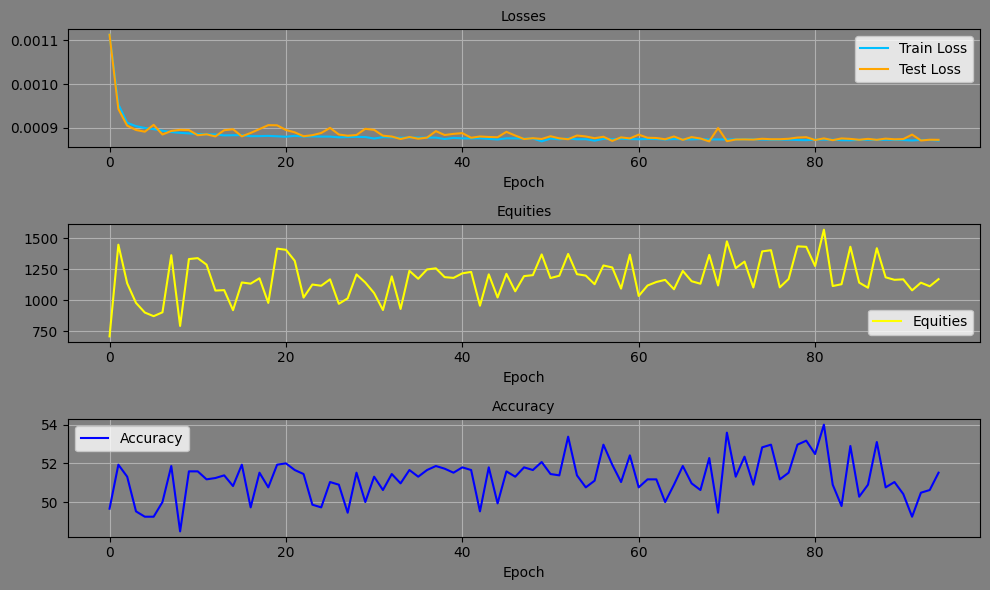

Epoch: 95, Equity: 1510.79, Accuracy: 53.31 train_losses: 0.0020313153025029915, test_losses: 0.0008723877836018801, Duration: 0:00:01.129878


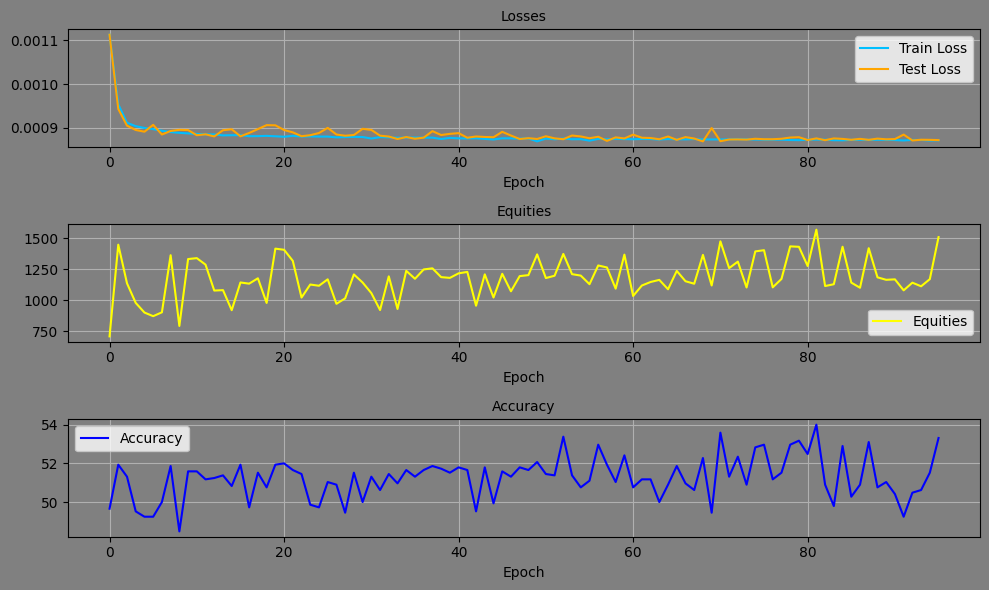

Epoch: 96, Equity: 1137.76, Accuracy: 50.69 train_losses: 0.0020356016185787244, test_losses: 0.0008713224669918418, Duration: 0:00:01.076741


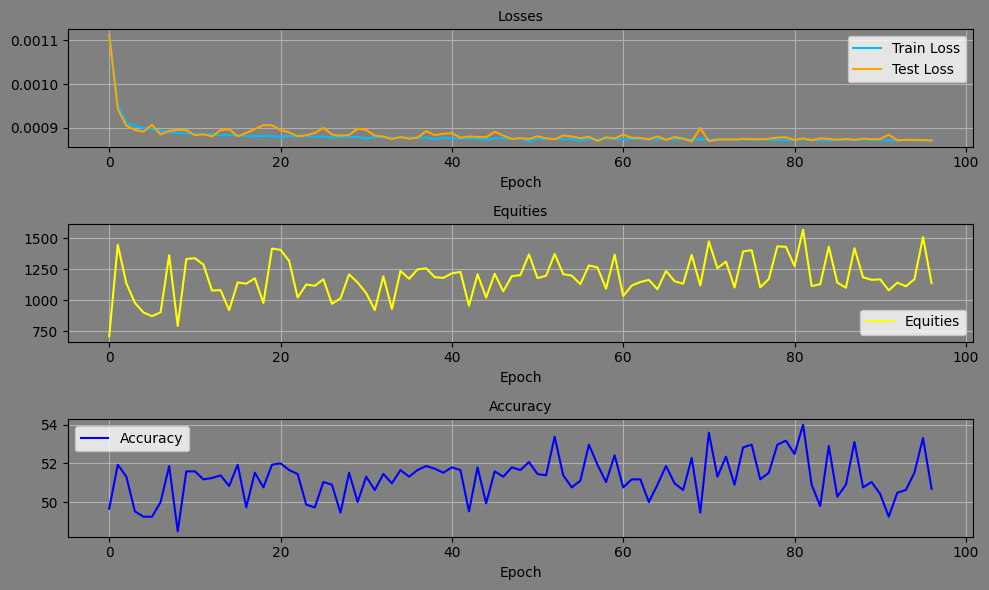

Epoch: 97, Equity: 1590.97, Accuracy: 54.48 train_losses: 0.002030100155514114, test_losses: 0.000875274243298918, Duration: 0:00:01.048950


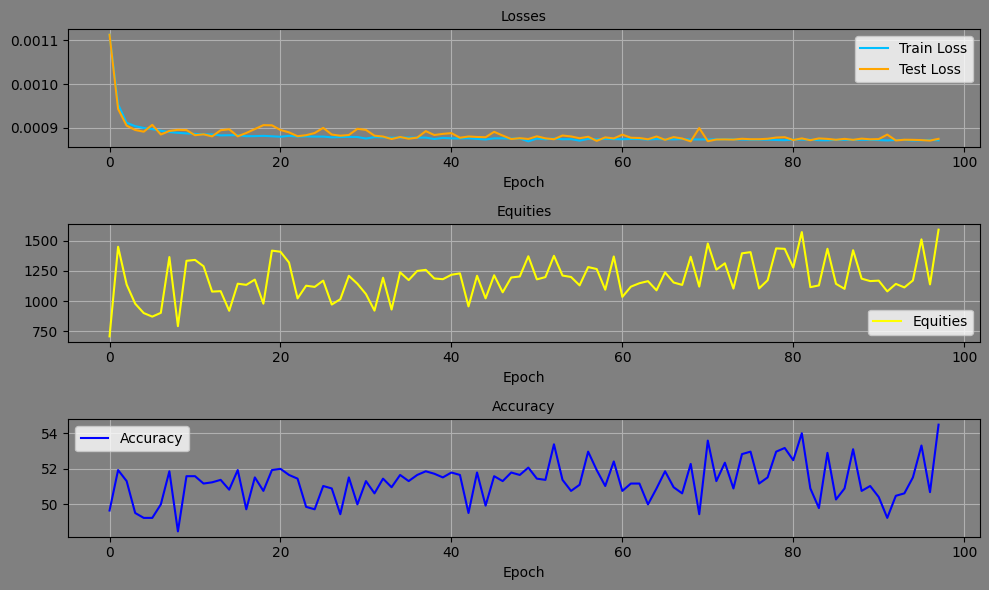

Epoch: 98, Equity: 1508.95, Accuracy: 53.10 train_losses: 0.002030782230381143, test_losses: 0.0008772058645263314, Duration: 0:00:01.110296


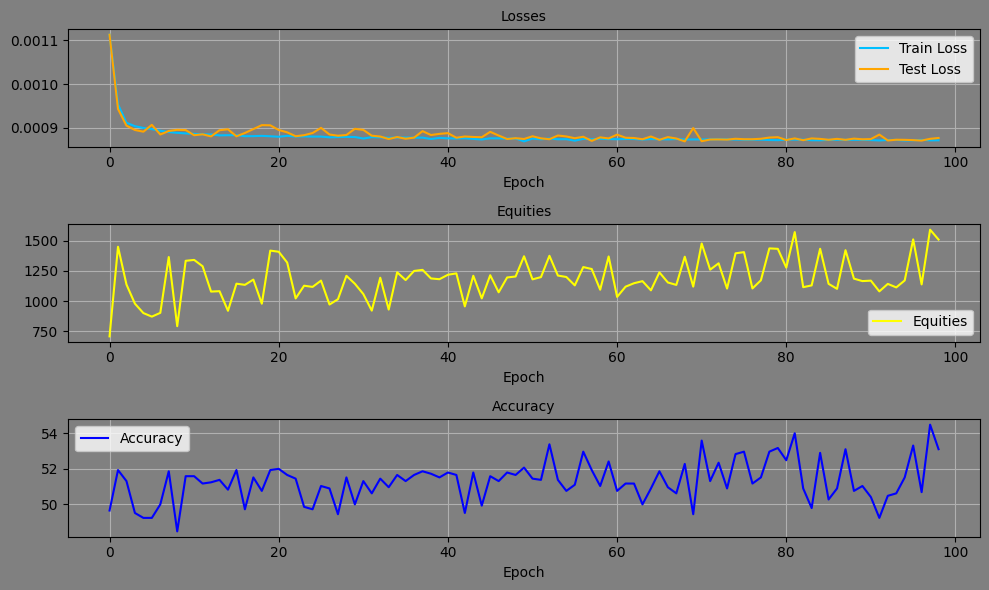

Epoch: 99, Equity: 1234.13, Accuracy: 50.83 train_losses: 0.0020323611164171796, test_losses: 0.0008789128623902798, Duration: 0:00:01.093443


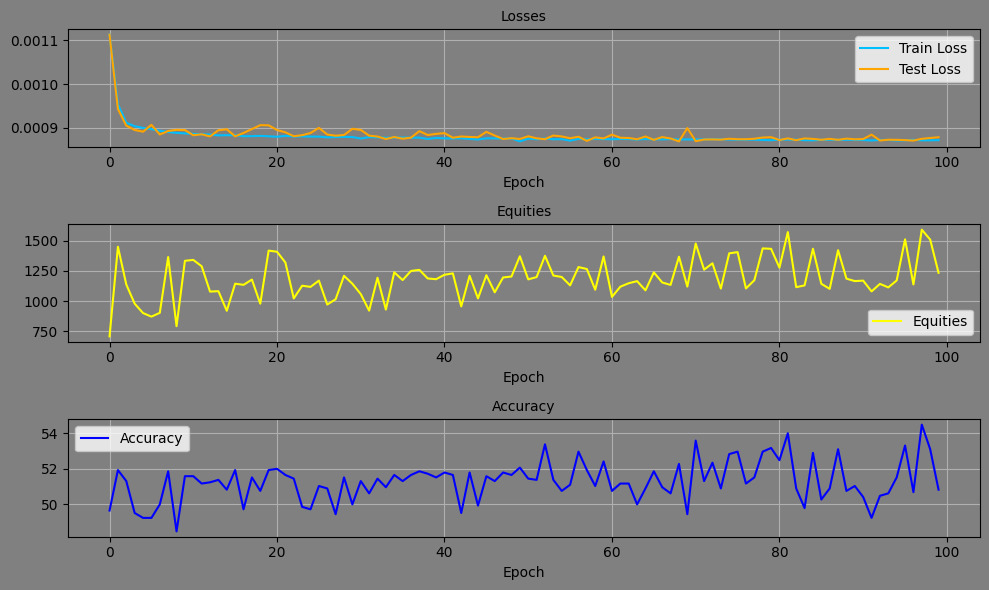

Epoch: 100, Equity: 1182.99, Accuracy: 50.21 train_losses: 0.0020321044129132555, test_losses: 0.0008792022126726806, Duration: 0:00:01.002602


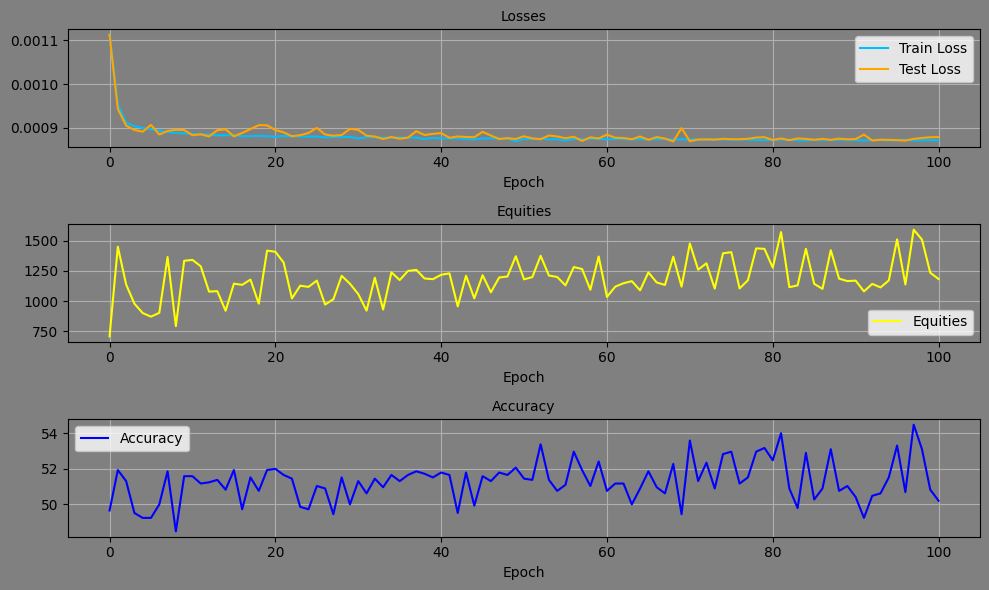

Epoch: 101, Equity: 1155.19, Accuracy: 50.96 train_losses: 0.0020302326888293294, test_losses: 0.0008739670156501234, Duration: 0:00:01.110678


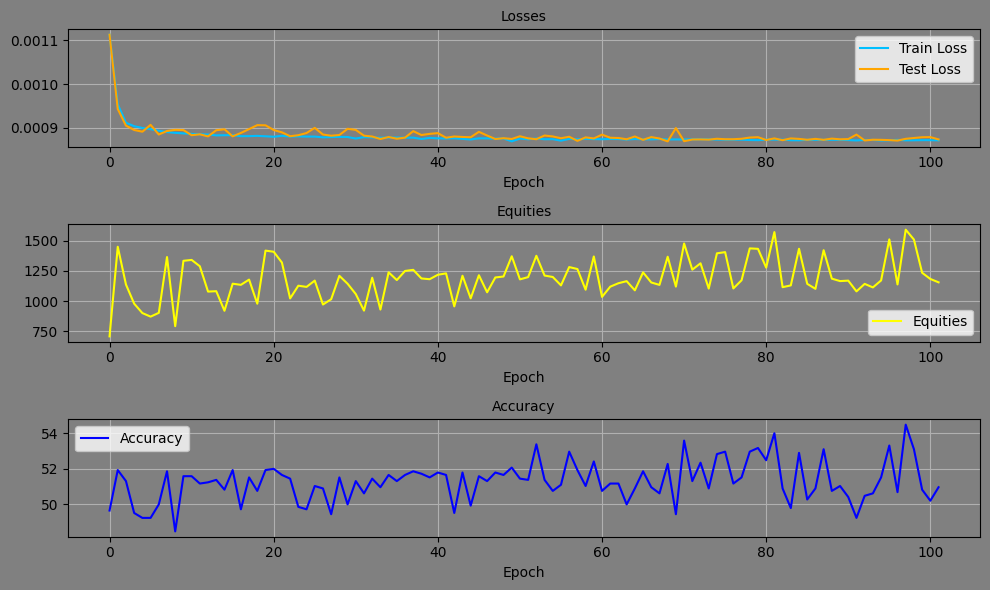

Epoch: 102, Equity: 1108.89, Accuracy: 50.76 train_losses: 0.002026725328326272, test_losses: 0.0008727263775654137, Duration: 0:00:01.028588


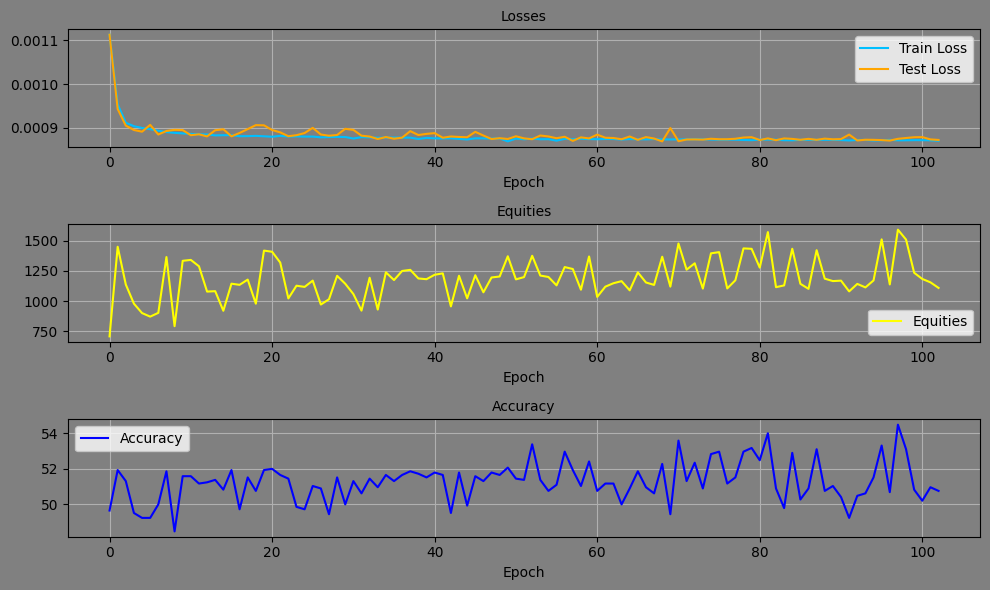

Epoch: 103, Equity: 1198.84, Accuracy: 51.65 train_losses: 0.002032497768080877, test_losses: 0.0008719545439817011, Duration: 0:00:01.160890


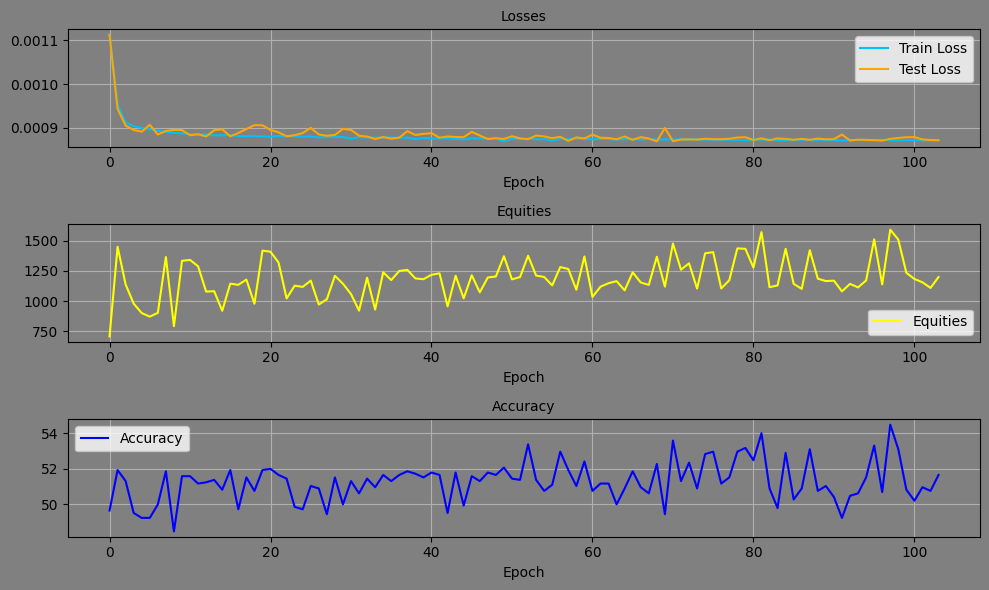

Epoch: 104, Equity: 1212.51, Accuracy: 51.10 train_losses: 0.0020289419198660746, test_losses: 0.0008771999273449183, Duration: 0:00:01.099417


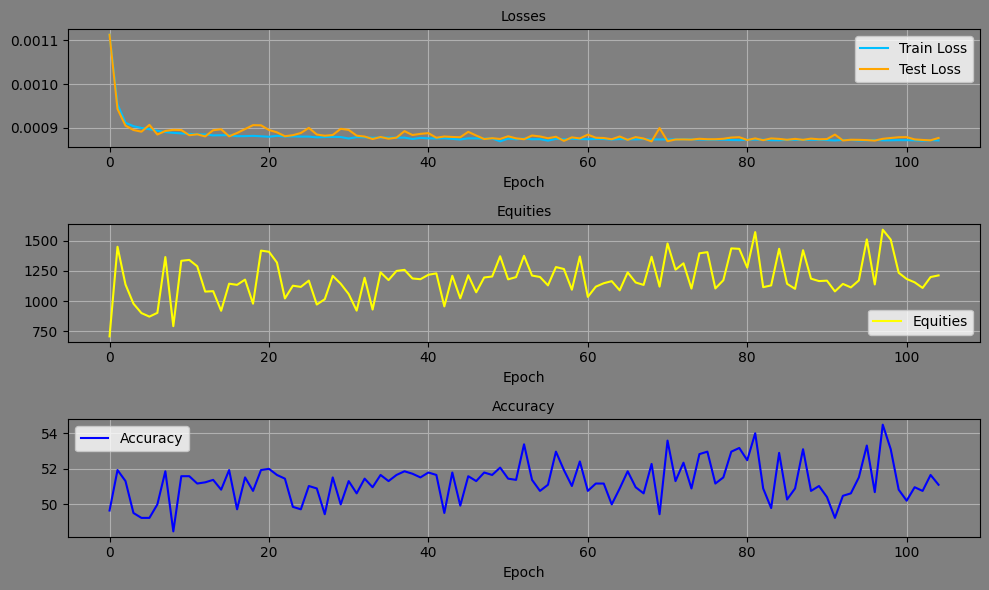

Epoch: 105, Equity: 1221.09, Accuracy: 50.69 train_losses: 0.0020313511604040956, test_losses: 0.0008726288215257227, Duration: 0:00:01.181708


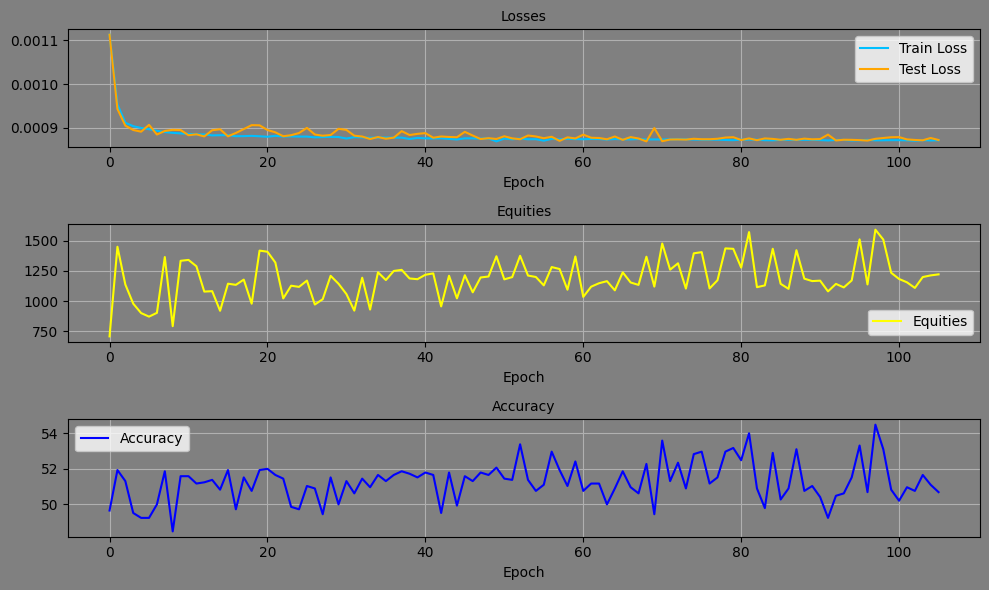

Epoch: 106, Equity: 1184.48, Accuracy: 50.83 train_losses: 0.0020277745232919037, test_losses: 0.0008827308192849159, Duration: 0:00:01.105591


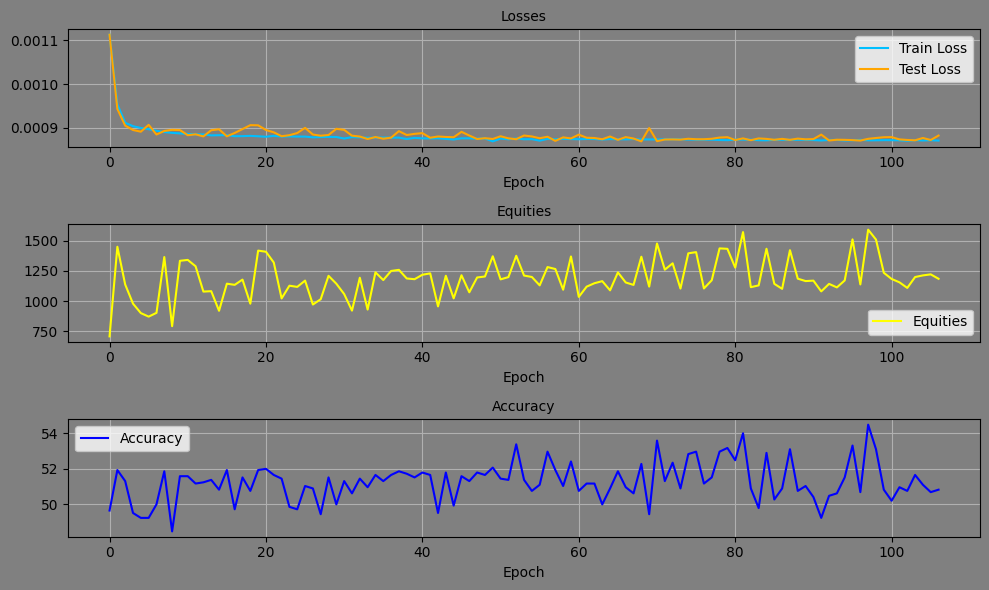

Epoch: 107, Equity: 1259.46, Accuracy: 51.58 train_losses: 0.002018559800555235, test_losses: 0.0008783944649621844, Duration: 0:00:01.190579


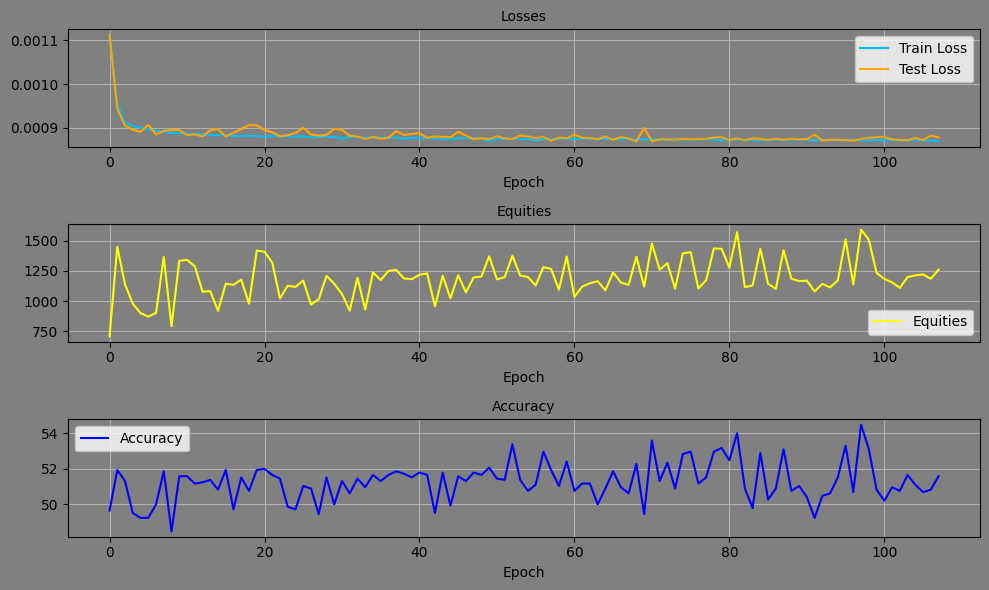

Epoch: 108, Equity: 1509.59, Accuracy: 53.93 train_losses: 0.00203228177906241, test_losses: 0.000870382587891072, Duration: 0:00:01.170187


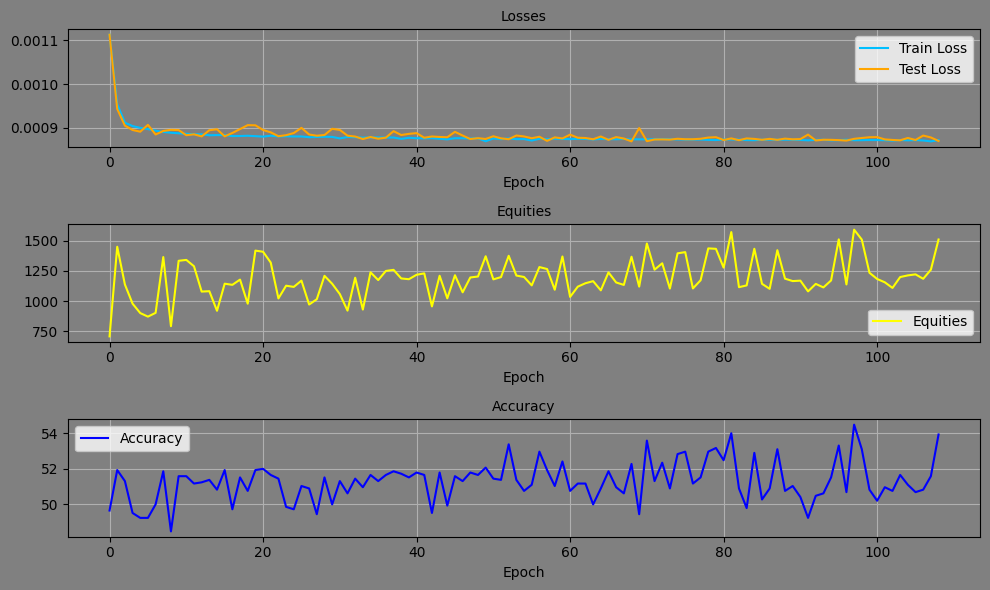

Epoch: 109, Equity: 1400.45, Accuracy: 52.13 train_losses: 0.0020314291542884977, test_losses: 0.0008719973848201334, Duration: 0:00:01.139740


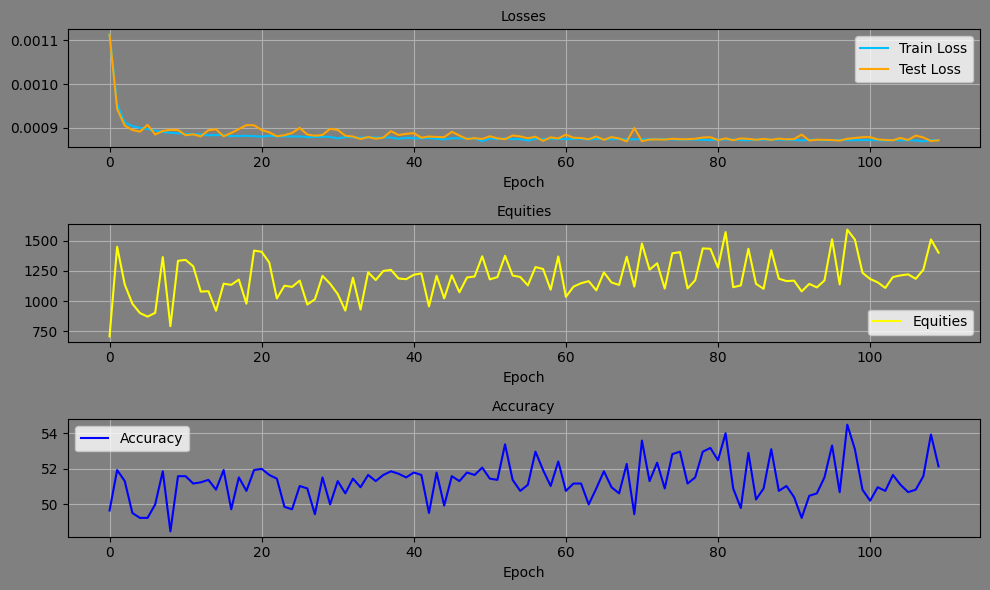

Epoch: 110, Equity: 1222.07, Accuracy: 51.03 train_losses: 0.0020289888416039742, test_losses: 0.0008730276604183018, Duration: 0:00:01.216398


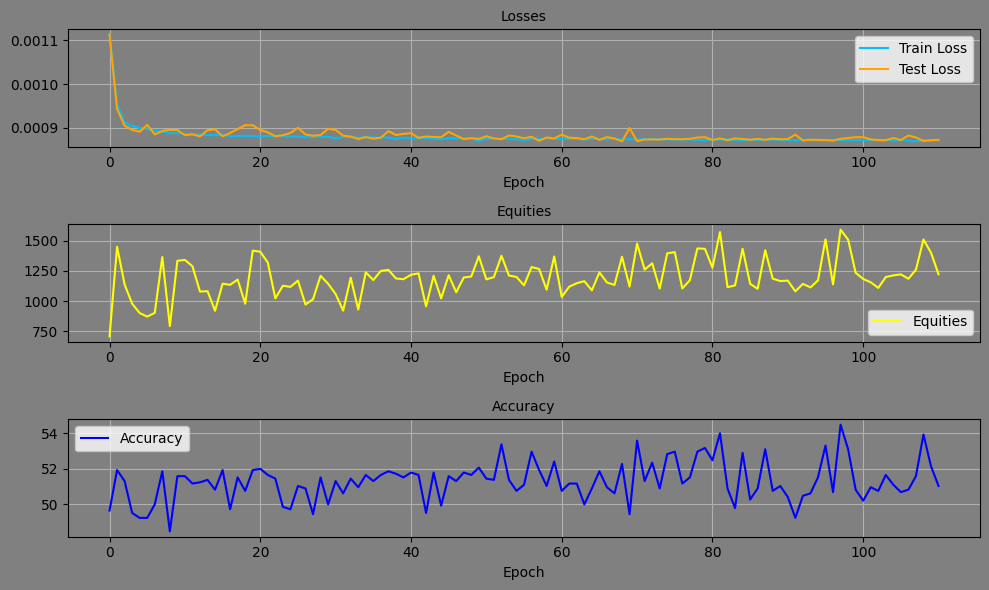

Epoch: 111, Equity: 1179.33, Accuracy: 50.48 train_losses: 0.002028585624097476, test_losses: 0.0008732297574169934, Duration: 0:00:01.279929


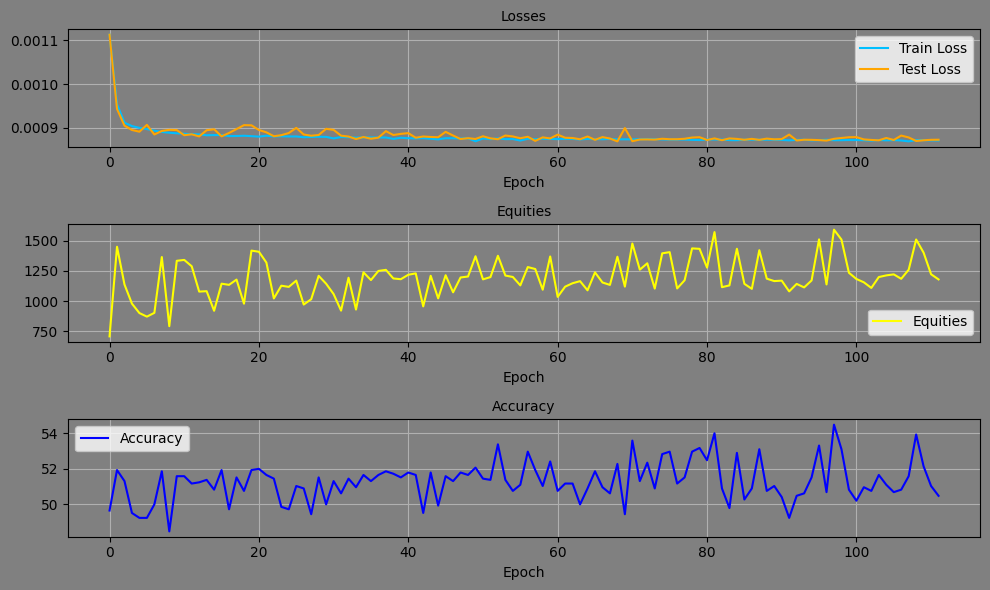

Epoch: 112, Equity: 1519.50, Accuracy: 54.06 train_losses: 0.0020268886715405715, test_losses: 0.0008740550256334245, Duration: 0:00:01.154108


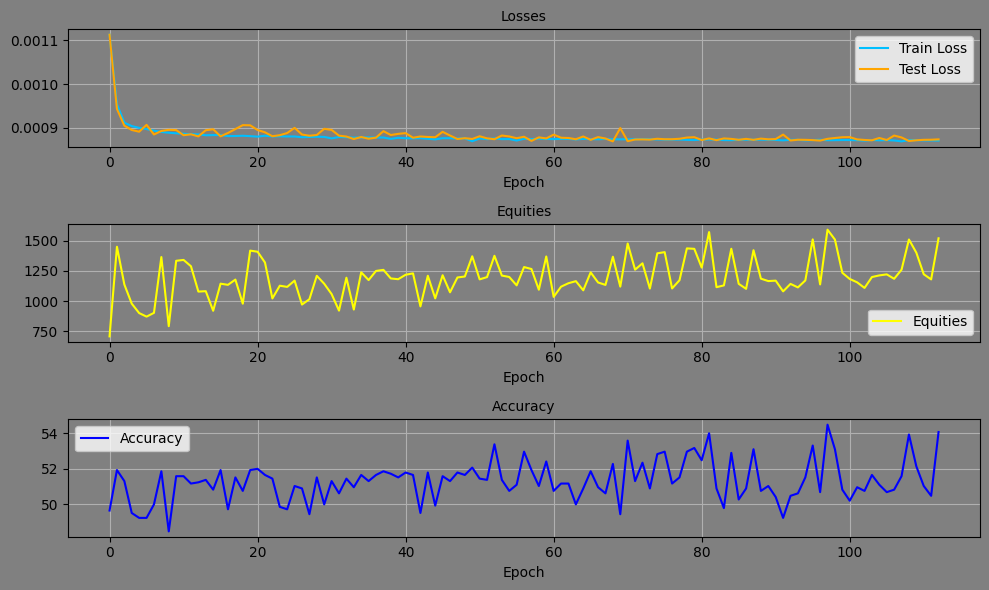

Epoch: 113, Equity: 1148.75, Accuracy: 50.21 train_losses: 0.0020271413837514457, test_losses: 0.000871986907441169, Duration: 0:00:01.143803


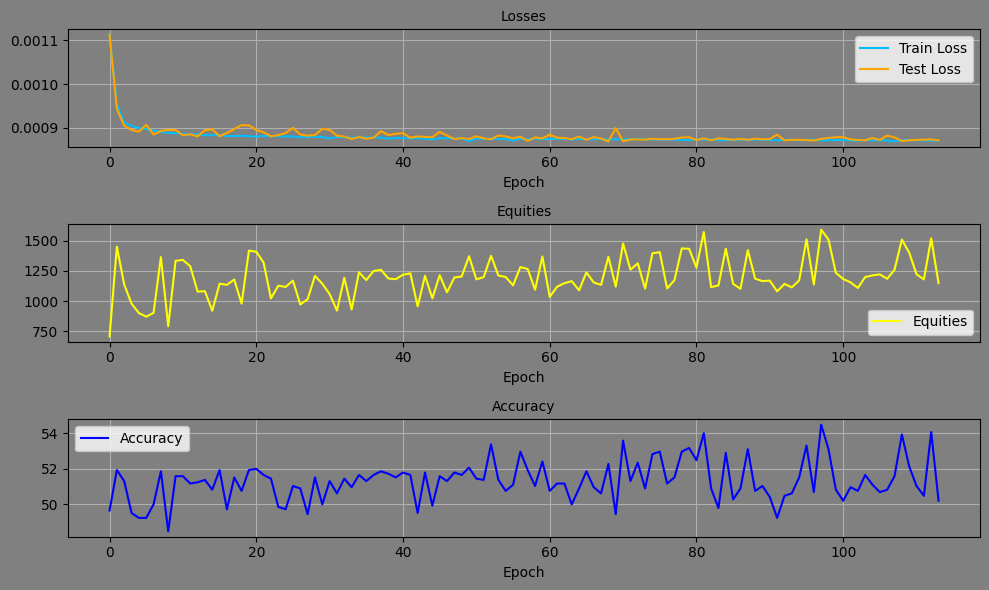

Epoch: 114, Equity: 1106.94, Accuracy: 50.55 train_losses: 0.002027723298985578, test_losses: 0.0008745684754103422, Duration: 0:00:01.171754


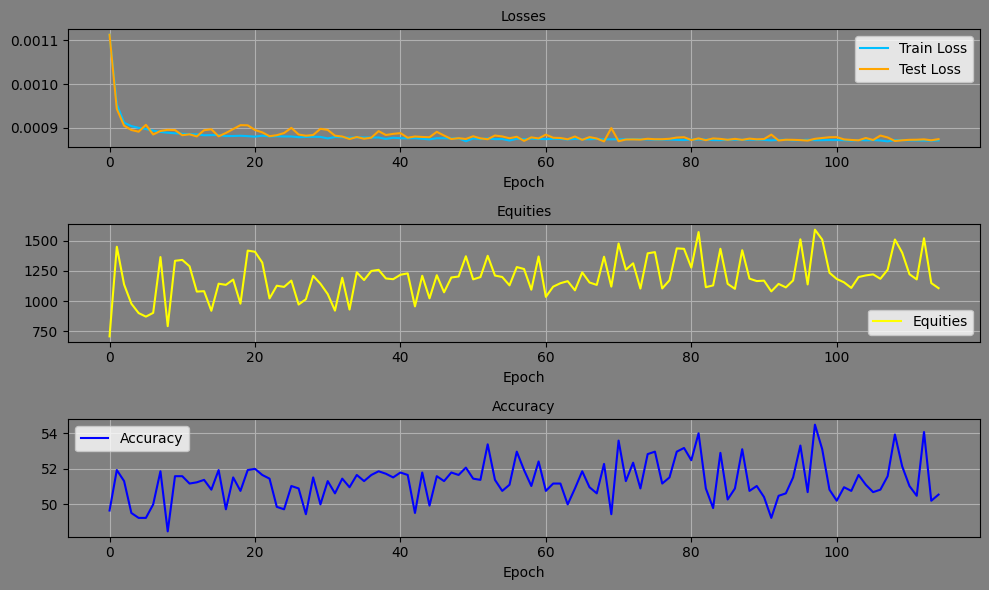

Epoch: 115, Equity: 1225.79, Accuracy: 50.69 train_losses: 0.002025085188949975, test_losses: 0.0008729617693461478, Duration: 0:00:01.080200


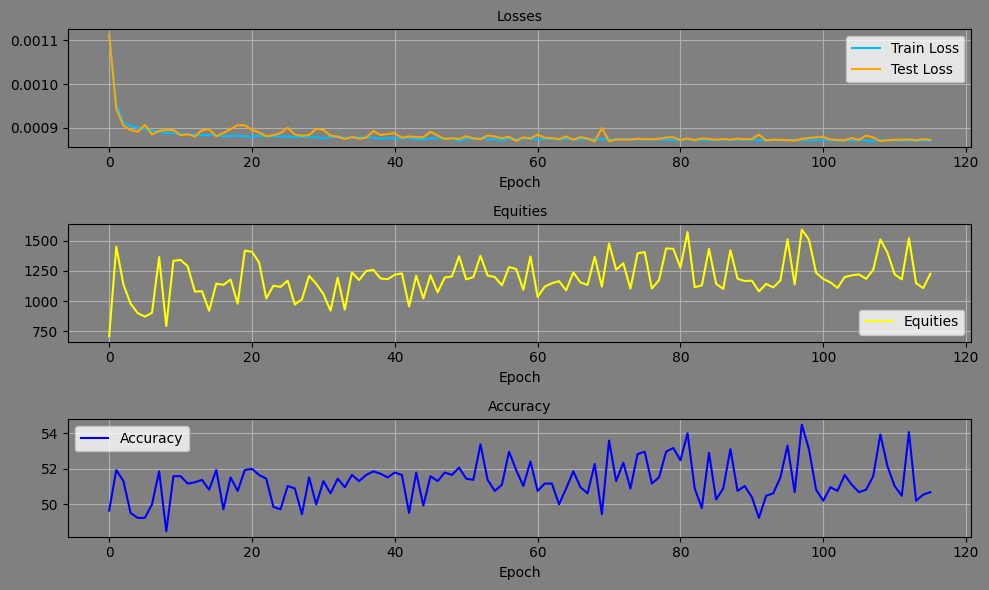

Epoch: 116, Equity: 1099.00, Accuracy: 50.62 train_losses: 0.0020131432482810843, test_losses: 0.0008848729776218534, Duration: 0:00:01.170484


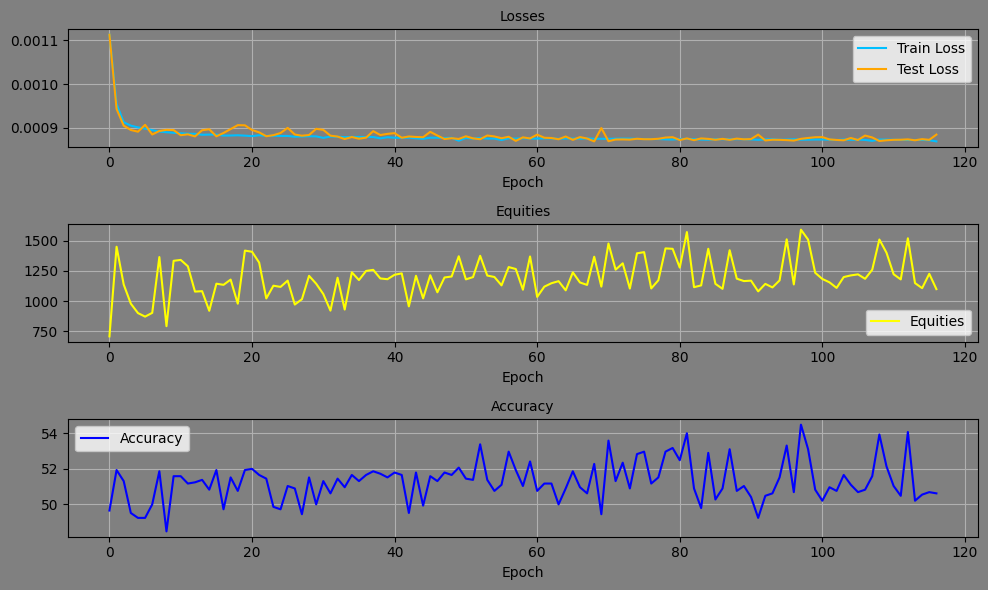

Epoch: 117, Equity: 1208.73, Accuracy: 50.76 train_losses: 0.002027854117886981, test_losses: 0.0008711089030839503, Duration: 0:00:01.277020


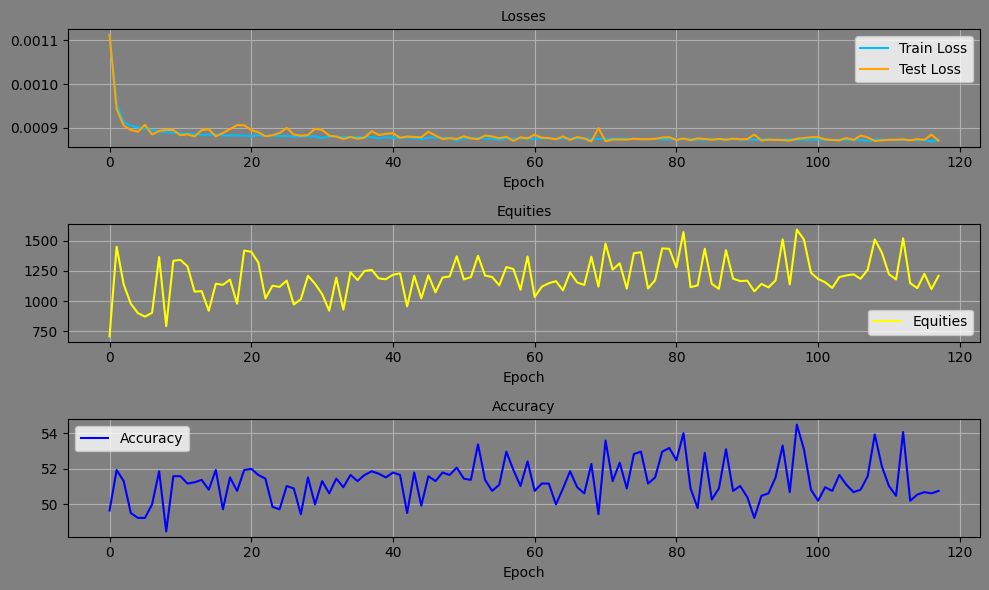

Epoch: 118, Equity: 1255.99, Accuracy: 51.31 train_losses: 0.0020275676948866245, test_losses: 0.0008732318528927863, Duration: 0:00:01.258685


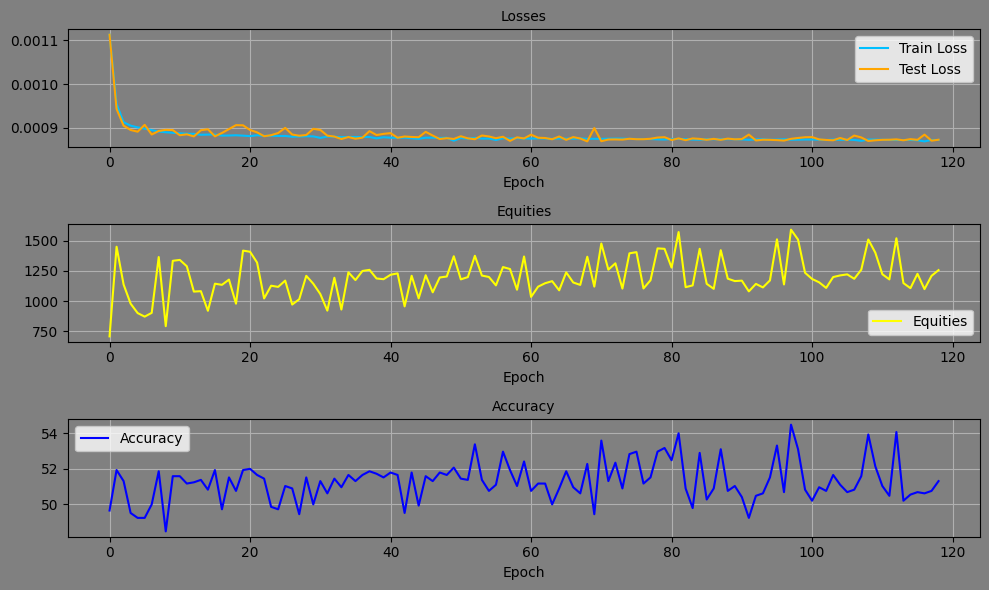

Epoch: 119, Equity: 1151.85, Accuracy: 50.96 train_losses: 0.002029766480619502, test_losses: 0.0008732702699489892, Duration: 0:00:01.242258


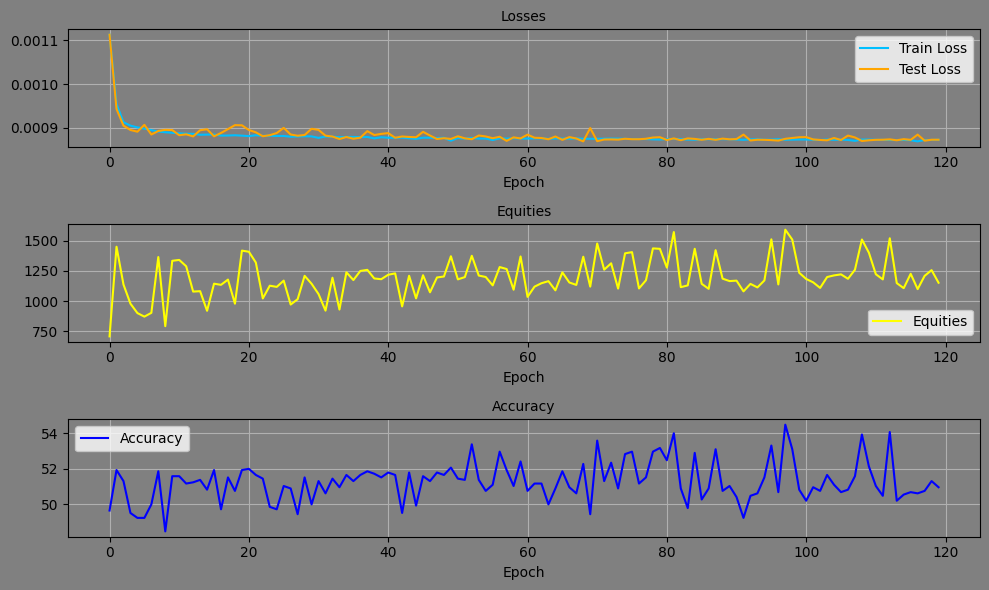

Epoch: 120, Equity: 1543.94, Accuracy: 53.79 train_losses: 0.0020250747813576144, test_losses: 0.0008729344117455184, Duration: 0:00:01.223140


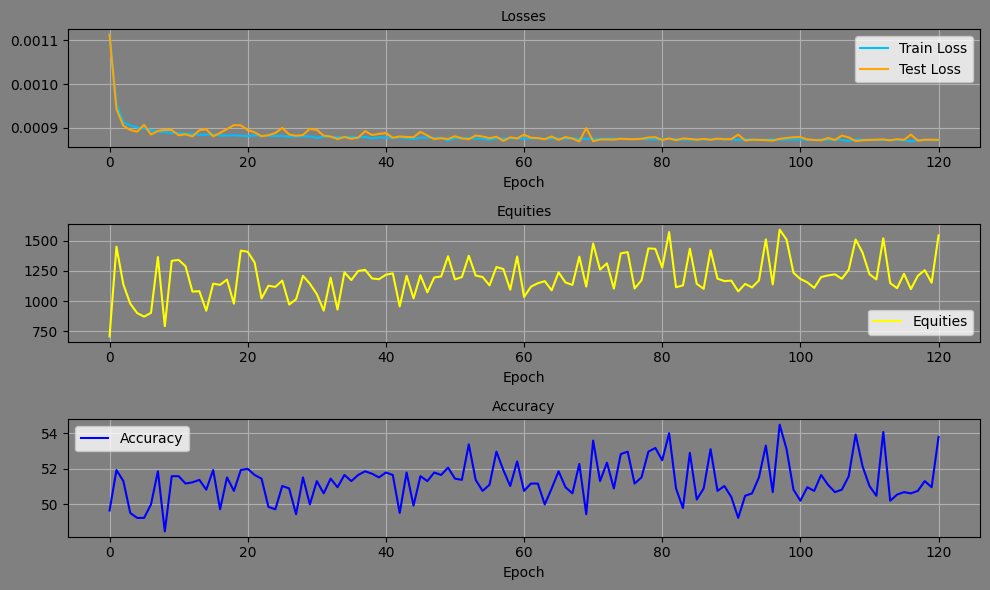

Epoch: 121, Equity: 1385.94, Accuracy: 53.10 train_losses: 0.0020259149059841885, test_losses: 0.0008802090305835009, Duration: 0:00:01.078702


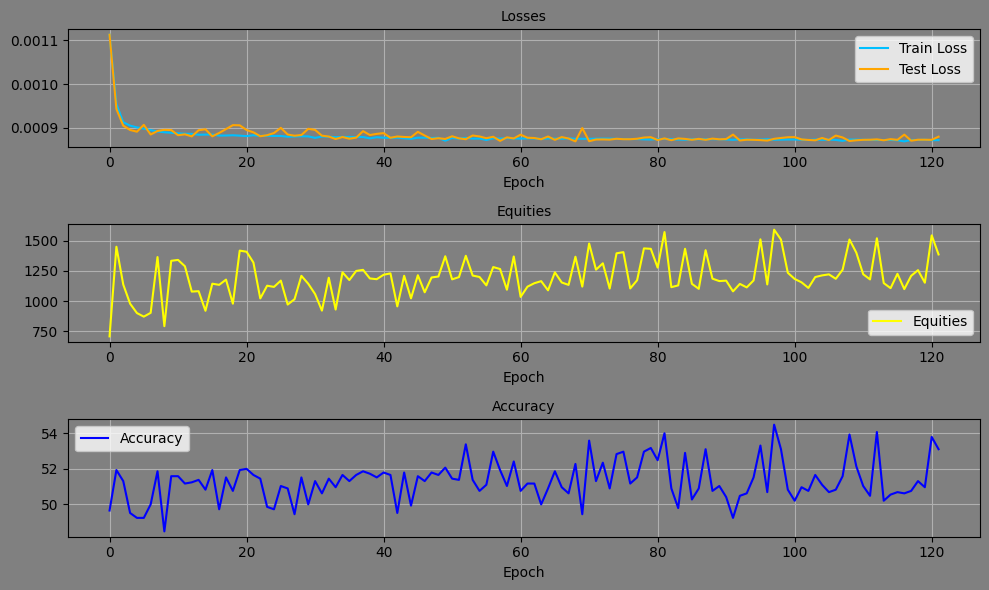

Epoch: 122, Equity: 1225.35, Accuracy: 50.76 train_losses: 0.0020207547375934005, test_losses: 0.0008794647292234004, Duration: 0:00:01.175174


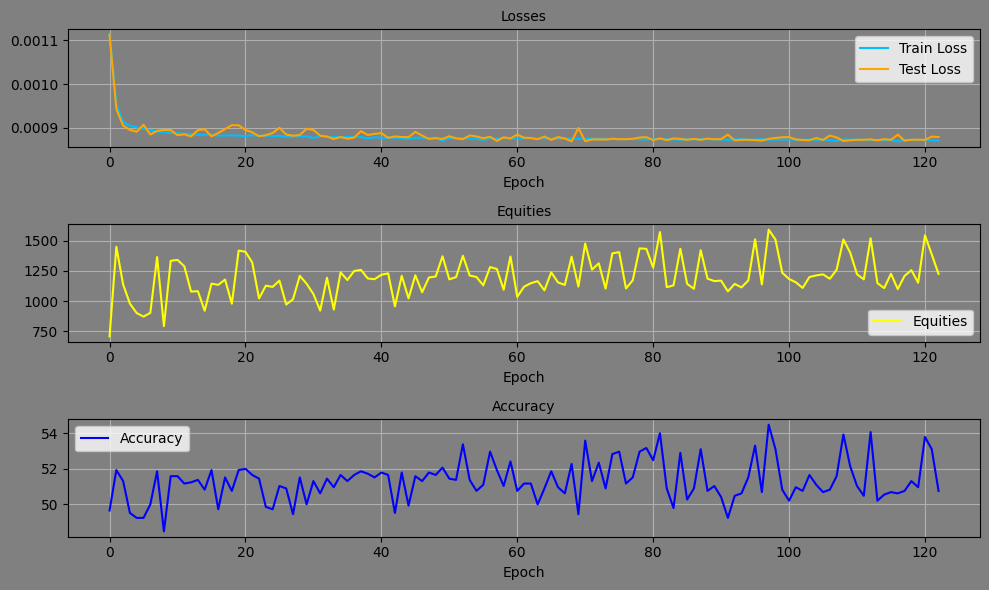

Epoch: 123, Equity: 1105.05, Accuracy: 50.90 train_losses: 0.002020720041550589, test_losses: 0.000873950426466763, Duration: 0:00:01.101064


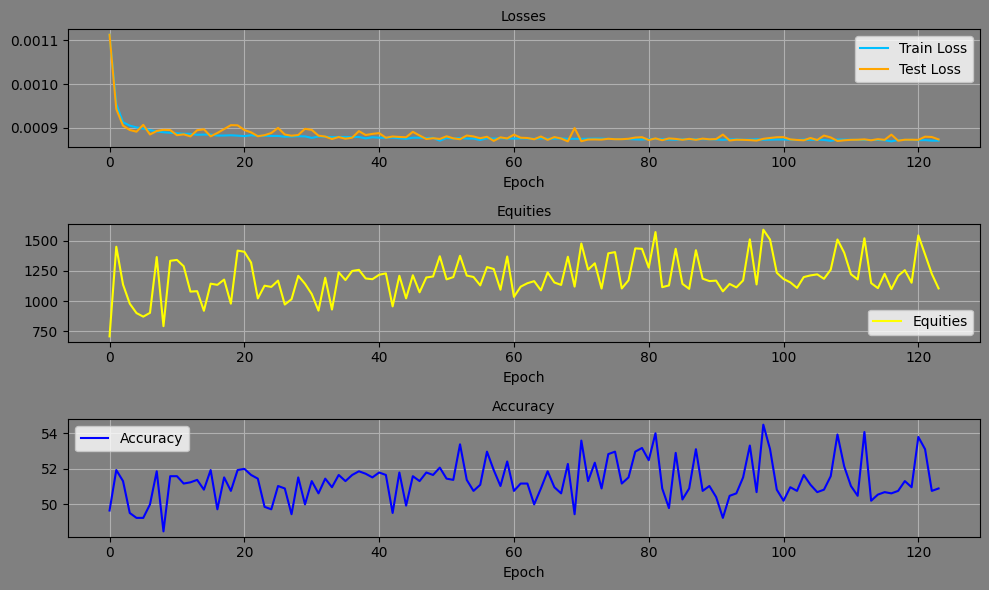

Epoch: 124, Equity: 1437.95, Accuracy: 52.96 train_losses: 0.002022891926477366, test_losses: 0.0008762505021877587, Duration: 0:00:01.154140


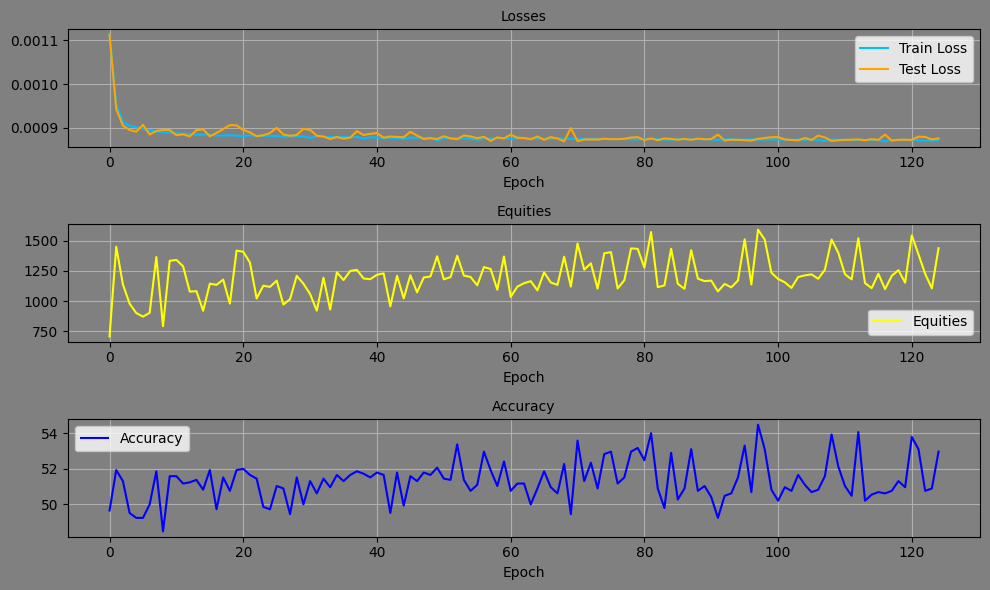

Epoch: 125, Equity: 1153.22, Accuracy: 50.62 train_losses: 0.0020168489998950885, test_losses: 0.000888713460881263, Duration: 0:00:01.135156


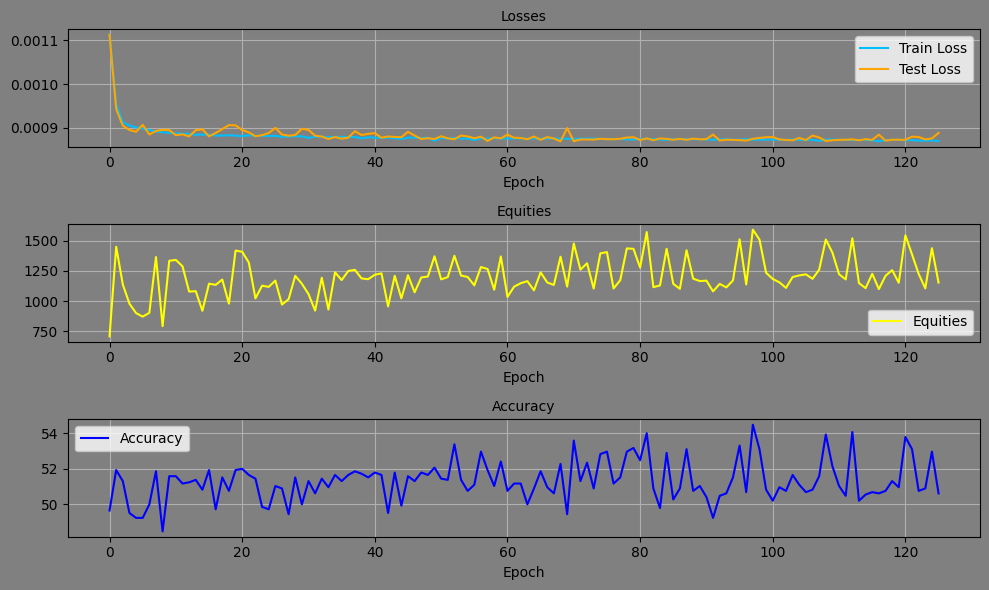

Epoch: 126, Equity: 1260.19, Accuracy: 51.17 train_losses: 0.0020232996115783115, test_losses: 0.0008784448727965355, Duration: 0:00:01.159504


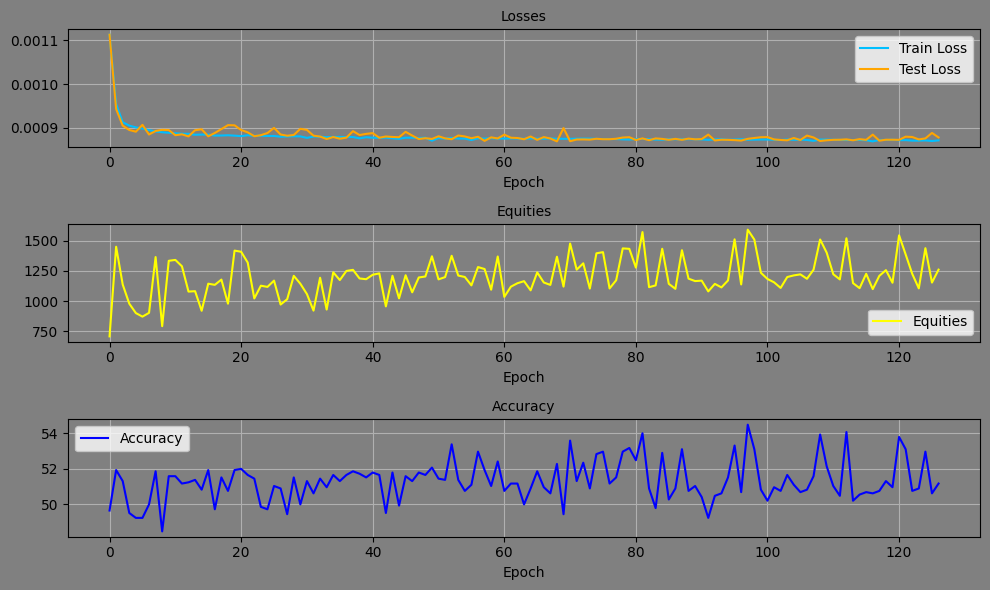

Epoch: 127, Equity: 1183.63, Accuracy: 50.69 train_losses: 0.0020249247007275593, test_losses: 0.0008695896831341088, Duration: 0:00:01.313311


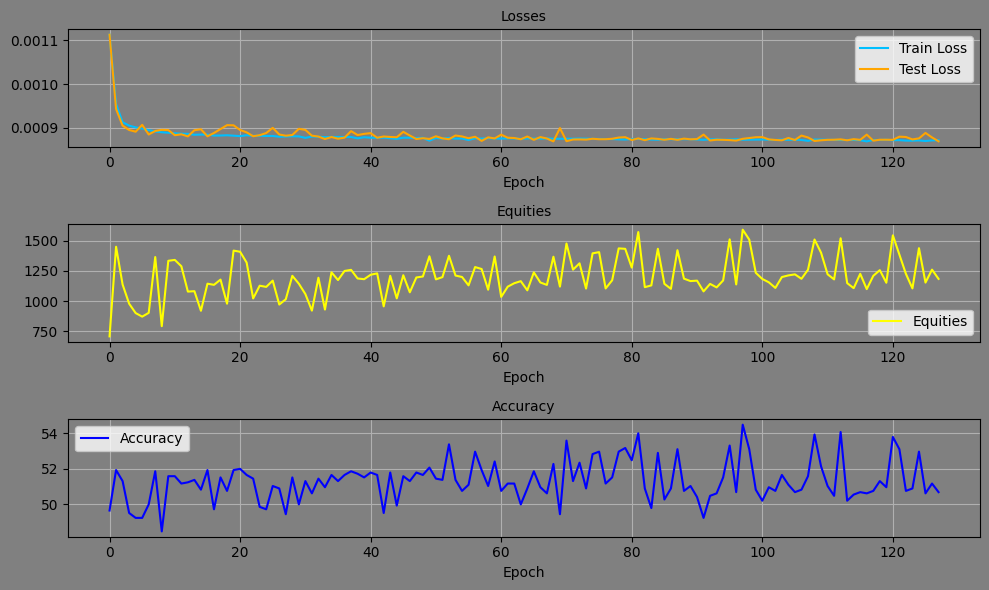

Epoch: 128, Equity: 1173.66, Accuracy: 51.17 train_losses: 0.002023559710216178, test_losses: 0.0008725561201572418, Duration: 0:00:01.251962


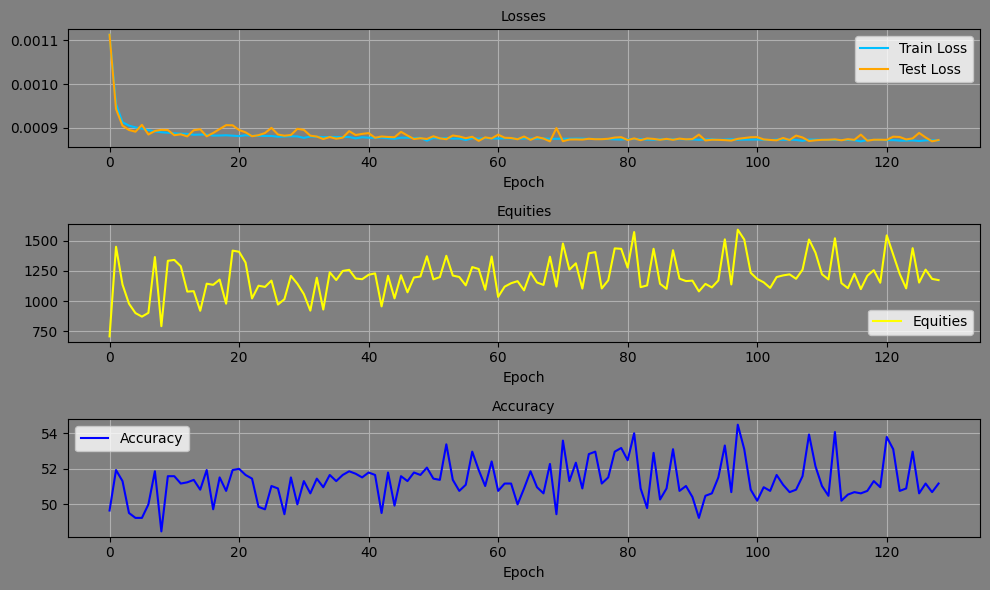

Epoch: 129, Equity: 1130.38, Accuracy: 50.41 train_losses: 0.002024403916993996, test_losses: 0.0008766454993747175, Duration: 0:00:01.151568


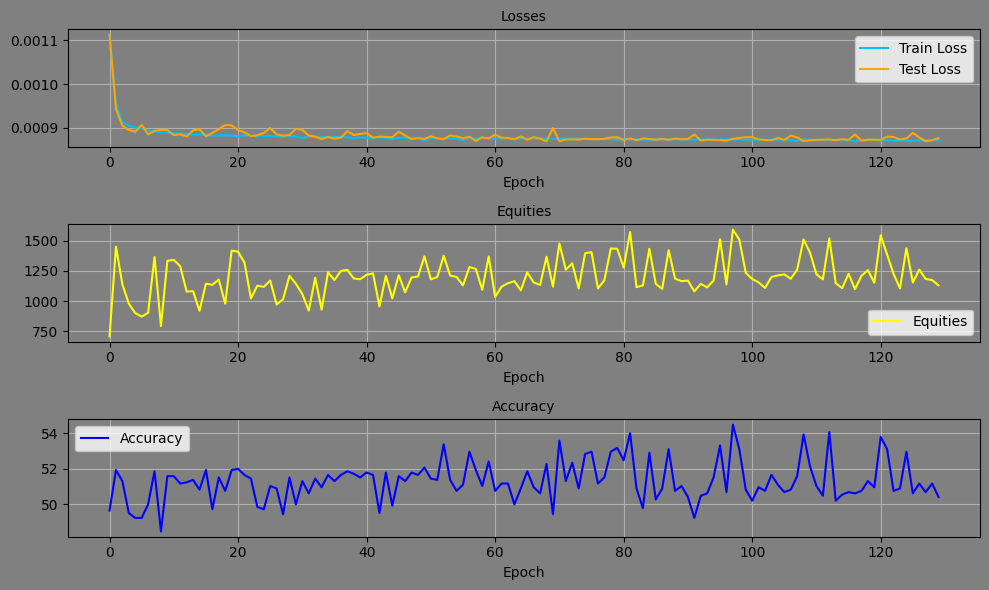

Epoch: 130, Equity: 1140.37, Accuracy: 50.21 train_losses: 0.002016187347780486, test_losses: 0.0008811074076220393, Duration: 0:00:01.154602


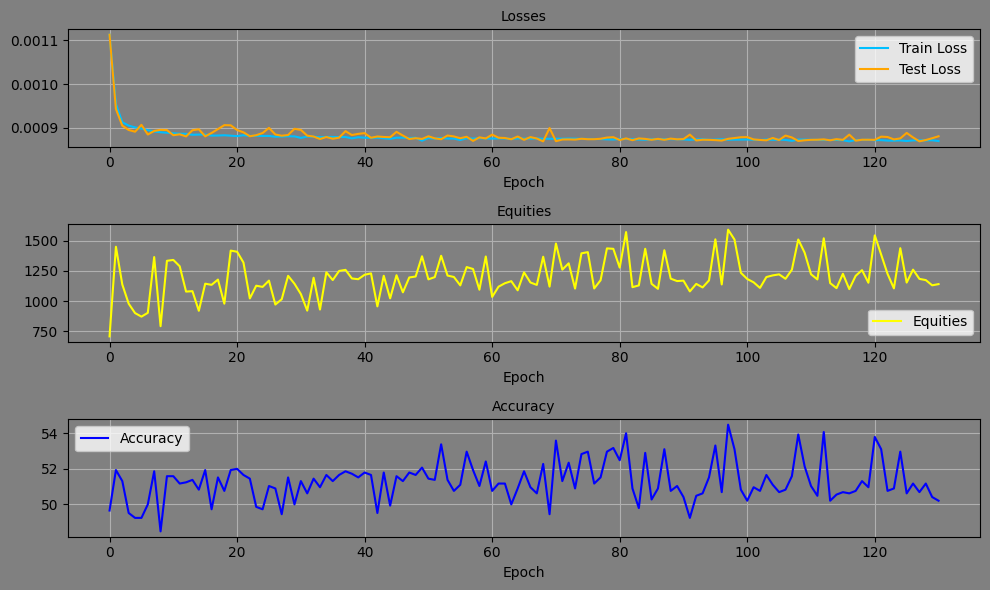

Epoch: 131, Equity: 1550.59, Accuracy: 53.51 train_losses: 0.002022132589911548, test_losses: 0.0008699288009665906, Duration: 0:00:01.123922


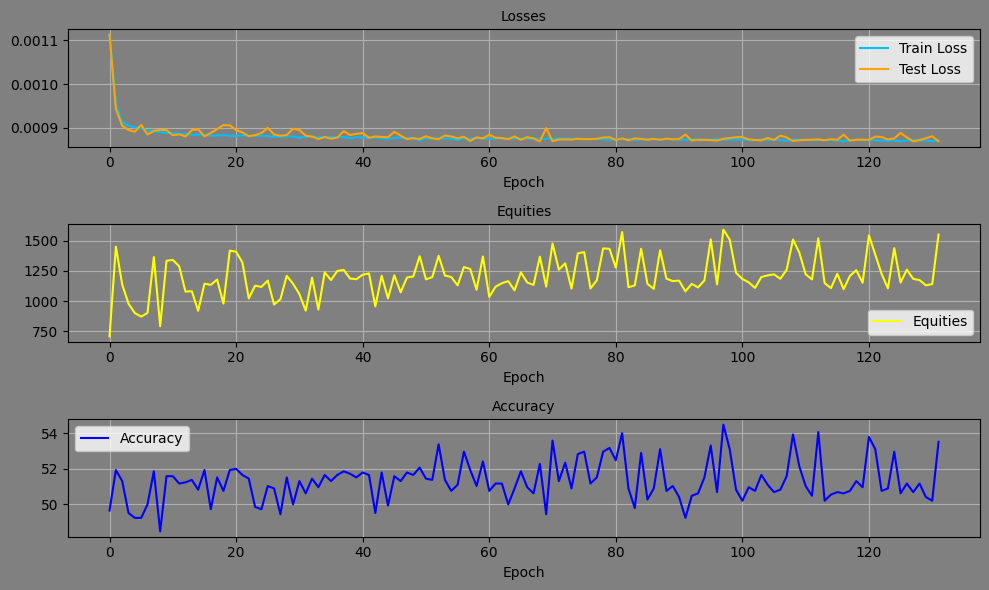

Epoch: 132, Equity: 1532.99, Accuracy: 53.44 train_losses: 0.002018821865214222, test_losses: 0.0008714920259080827, Duration: 0:00:01.116789


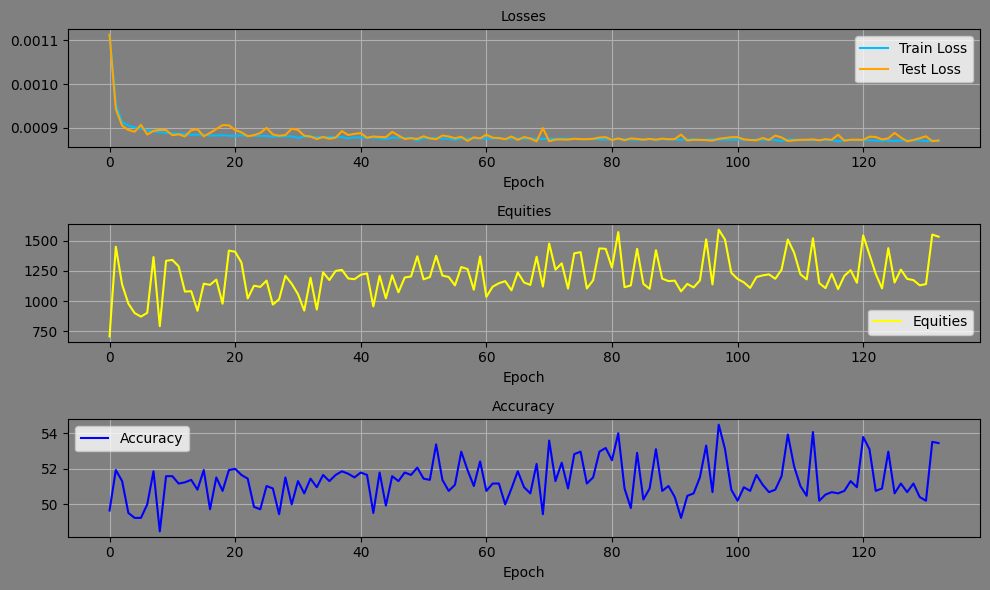

Epoch: 133, Equity: 1579.83, Accuracy: 53.65 train_losses: 0.00202221626144213, test_losses: 0.0008749801781959832, Duration: 0:00:01.199335


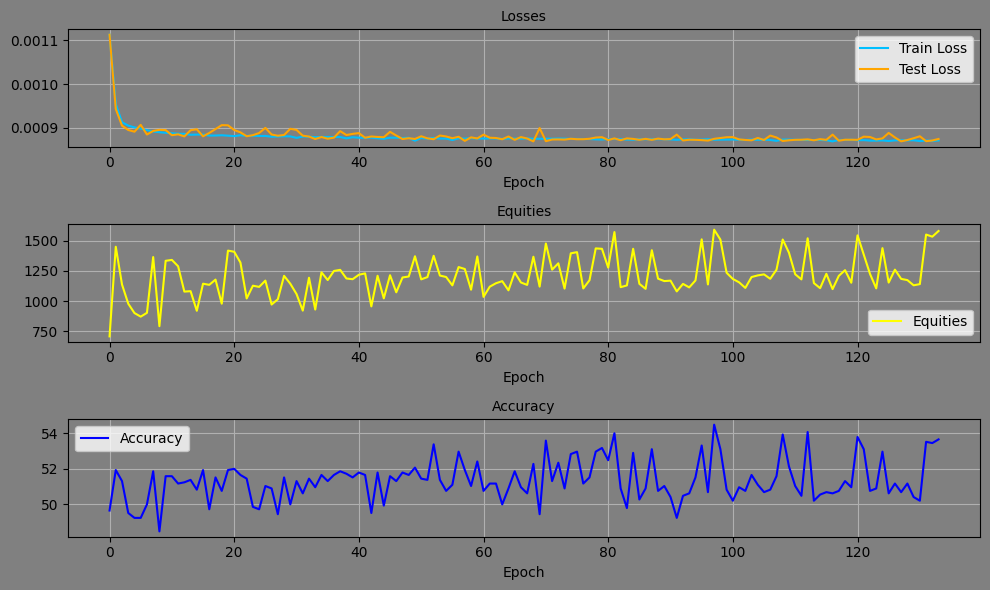

Epoch: 134, Equity: 1171.62, Accuracy: 50.62 train_losses: 0.0020190687864930384, test_losses: 0.0008729019900783896, Duration: 0:00:01.160814


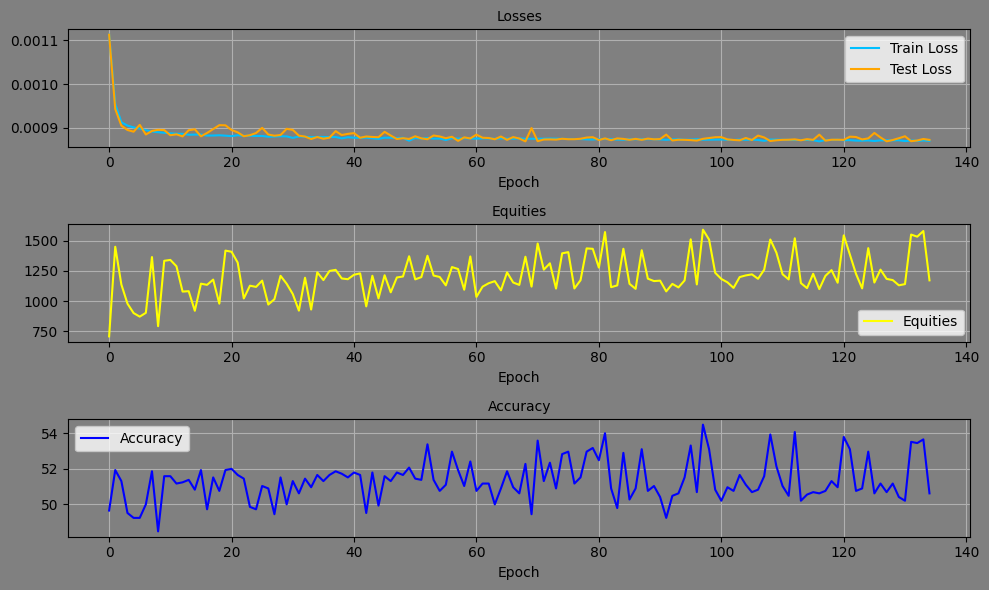

Epoch: 135, Equity: 1540.17, Accuracy: 53.24 train_losses: 0.002019405619726987, test_losses: 0.0008712917333468795, Duration: 0:00:01.225994


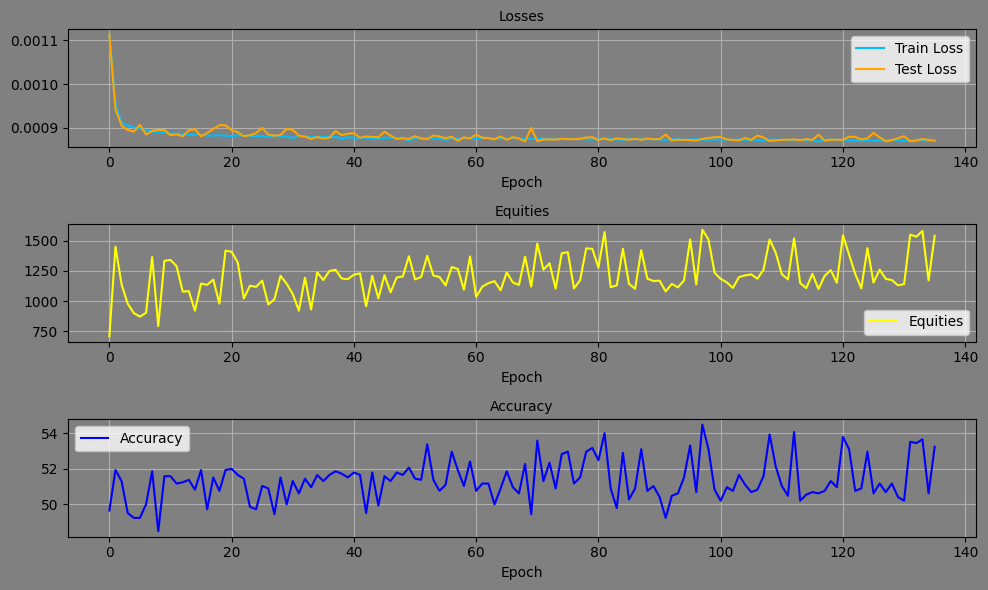

In [ ]:
for epoch in range(epoch, num_epochs):

    # Track duration
    dt0_epoch = datetime.now()

    # Create mini batches
    mini_batches, seed = create_minibatches(X_train, Y_train, batch_size, seed, shuffle=True)

    train_losses_batch = []

    for X_train_batch, Y_train_batch in mini_batches:
        # Set train mode
        model.train()

        # Reset the gradients
        optimizer.zero_grad()

        # Forward propagation
        Y_hat_train = model(X_train_batch) # Shape: (batch_size, num_features)

        # Calculate loss (train)
        train_loss = criterion(Y_hat_train, Y_train_batch)

        # Backprop
        train_loss.backward()

        # Update optimizer
        optimizer.step()

        # Keep track of training losses
        train_losses_batch.append(train_loss.item())

    # Predict on val slice (selection period)
    with torch.no_grad():

        # Set evaluation mode
        model.eval()

        # Forward propagation
        Y_pred_val = model(X_val)

        # Calculate test loss
        test_loss = criterion(Y_pred_val, Y_val)

    # Convert 'Y_pred_val' to numpy
    Y_pred_val_cpu = Y_pred_val.detach().cpu().numpy()

    train_losses.append(np.mean(train_losses_batch))
    test_losses.append(test_loss.item())

    # ===================== Backtest =====================
    equities = []    # Store equity (account value) over time
    pos_size = 1000  # Fixed position size ($1000 per trade)
    equity = 1000    # Starting capital
    correct_pred = 0 # Initialize correct prediction

    actions = Y_pred_val_cpu[:, 0] > 0 # Get model's buy/sell predictions

    for i in range(len(X_val)-1):
        curr_open = val_opens[i]   # the price we enter at.
        curr_close = val_closes[i] # the price we exit at.
        curr_action = actions[i]        # the model’s signal (buy or sell).

        # Calculate percentage price change
        pct_change = (curr_close - curr_open) / curr_open

        # Profit or loss in dollars
        pnl = np.abs(pos_size * pct_change)

        # Update equity depending on action and price move
        if curr_action == 1:     # Long position (Buy side)
            if pct_change > 0:
                equity += pnl    # Price up → profit
                correct_pred += 1
            elif pct_change < 0:
                equity -= pnl    # Price down → loss

        elif curr_action == 0:   # Short position
            if pct_change > 0:
                equity -= pnl    # Price up → loss
            elif pct_change < 0:
                equity += pnl    # Price down → profit
                correct_pred += 1

        equities.append(equity) # Save current equity
    # ========================================================

    # Calculate percentage accuracy
    accuracy = correct_pred / len(X_val) * 100

    # Save final equity for each epoch
    equity_epochs.append(equity)
    accuracy_epochs.append(accuracy)

    print(f'Epoch: {epoch}, Equity: {equity:.2f}, Accuracy: {accuracy:.2f} train_losses: {train_losses[-1]}, test_losses: {test_losses[-1]}, Duration: {datetime.now() - dt0_epoch}')

    # Save training process
    torch.save({
        'epoch': epoch,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'train_losses': train_losses,
        'test_losses': test_losses,
        'equity_epochs': equity_epochs,
        'accuracy_epochs': accuracy_epochs,
        'seed': seed,
    }, 'training_process')

    if equity > 1200:
        torch.save(model.state_dict(), f"models/eq_{equity:.0f}_ep_{epoch}.pt")

    # Plot training process
    fig, axs = plt.subplots(nrows=3, ncols=1, figsize=(10, 6))
    scaler_testloss = MinMaxScaler(feature_range=(np.min(test_losses)-0.0000000001, np.max(test_losses)))

    # Plot Train Loss and Test Loss
    axs[0].set_title(f"Losses", fontsize=10)
    axs[0].plot(scaler_testloss.fit_transform(np.array(train_losses).reshape(-1,1)), label='Train Loss', color='deepskyblue')
    axs[0].plot(test_losses, label='Test Loss', color='orange')
    axs[0].set_xlabel("Epoch")
    axs[0].legend()
    axs[0].grid()
    # Plot Equities
    axs[1].set_title(f"Equities", fontsize=10)
    axs[1].plot(equity_epochs, label='Equities', color='yellow')
    axs[1].set_xlabel("Epoch")
    axs[1].legend()
    axs[1].grid()
    # Plot Accuracy
    axs[2].set_title(f"Accuracy", fontsize=10)
    axs[2].plot(accuracy_epochs, label='Accuracy', color='blue')
    axs[2].set_xlabel("Epoch")
    axs[2].legend()
    axs[2].grid()
    # Set background color and paper color
    fig.patch.set_facecolor(mcolors.to_hex('grey'))  # Set paper color
    for ax in axs.flat:
        ax.set_facecolor(mcolors.to_hex('grey'))  # Set bg color
    # Display
    plt.tight_layout()
    plt.savefig(f'training_process.png')
    plt.show()
    plt.close()


In [ ]:
import json
import re

split_info = {"train_start": TRAIN_START, "train_end": TRAIN_END, "val_end": VAL_END, "total_rows": total_rows}
with open(ARTIFACTS / "split_info.json", "w", encoding="utf-8") as f:
    json.dump(split_info, f, indent=2)

with open(ARTIFACTS / "scalers.pkl", "wb") as f:
    pickle.dump(train_scalers, f)

models_dir = Path("models").resolve()
pt_files = []
for fname in os.listdir(models_dir):
    if not fname.endswith(".pt"):
        continue
    m = re.match(r"^eq_(\d+)_ep_", fname)
    if not m:
        continue
    eq = float(m.group(1))
    rel_path = os.path.relpath(str(models_dir / fname), str(CNN_ROOT)).replace(os.sep, "/")
    pt_files.append((eq, rel_path))

pt_files.sort(key=lambda x: -x[0])
top3 = [p for _, p in pt_files[:3]]

manifest_path = ARTIFACTS / "manifest.json"
manifest = {}
if manifest_path.is_file():
    with open(manifest_path, "r", encoding="utf-8") as f:
        manifest = json.load(f)
manifest[ARCH_MANIFEST_KEY] = top3
with open(manifest_path, "w", encoding="utf-8") as f:
    json.dump(manifest, f, indent=2)

print("Written:", ARTIFACTS / "split_info.json", ARTIFACTS / "scalers.pkl", manifest_path)
print("manifest key:", ARCH_MANIFEST_KEY, "top3:", top3)

